### Mount storage

In [187]:
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

odours

In [188]:
TASKS = [
'alcoholic', 'aldehydic', 'alliaceous', 'almond', 'amber', 'animal',
'anisic', 'apple', 'apricot', 'aromatic', 'balsamic', 'banana', 'beefy',
'bergamot', 'berry', 'bitter', 'black currant', 'brandy', 'burnt',
'buttery', 'cabbage', 'camphoreous', 'caramellic', 'cedar', 'celery',
'chamomile', 'cheesy', 'cherry', 'chocolate', 'cinnamon', 'citrus', 'clean',
'clove', 'cocoa', 'coconut', 'coffee', 'cognac', 'cooked', 'cooling',
'cortex', 'coumarinic', 'creamy', 'cucumber', 'dairy', 'dry', 'earthy',
'ethereal', 'fatty', 'fermented', 'fishy', 'floral', 'fresh', 'fruit skin',
'fruity', 'garlic', 'gassy', 'geranium', 'grape', 'grapefruit', 'grassy',
'green', 'hawthorn', 'hay', 'hazelnut', 'herbal', 'honey', 'hyacinth',
'jasmin', 'juicy', 'ketonic', 'lactonic', 'lavender', 'leafy', 'leathery',
'lemon', 'lily', 'malty', 'meaty', 'medicinal', 'melon', 'metallic',
'milky', 'mint', 'muguet', 'mushroom', 'musk', 'musty', 'natural', 'nutty',
'odorless', 'oily', 'onion', 'orange', 'orangeflower', 'orris', 'ozone',
'peach', 'pear', 'phenolic', 'pine', 'pineapple', 'plum', 'popcorn',
'potato', 'powdery', 'pungent', 'radish', 'raspberry', 'ripe', 'roasted',
'rose', 'rummy', 'sandalwood', 'savory', 'sharp', 'smoky', 'soapy',
'solvent', 'sour', 'spicy', 'strawberry', 'sulfurous', 'sweaty', 'sweet',
'tea', 'terpenic', 'tobacco', 'tomato', 'tropical', 'vanilla', 'vegetable',
'vetiver', 'violet', 'warm', 'waxy', 'weedy', 'winey', 'woody'
]

print("No of tasks: ", len(TASKS))
n_tasks = len(TASKS)

No of tasks:  138


In [189]:
perfurmershub2labels_updated = {'Wood': {'main': 'woody', 'accessory':['cedar', 'sandalwood']},
 'Green': {'main': 'green', 'accessory': ['grassy', 'leafy']},
 'Linalool': {'main': 'floral', 'accessory': ['lavender', 'citrus']},#['floral', 'lavender'],
 'Fruity': {'main': 'fruity', 'accessory': ['apple', 'apricot', 'banana', 'berry', 'black currant', 'cherry', 'grape', 'grapefruit', 'melon', 'orange', 'peach', 'pear', 'pineapple', 'plum', 'raspberry', 'strawberry']},#['fruity', 'apple', 'apricot', 'banana', 'berry', 'black currant', 'cherry', 'grape', 'grapefruit', 'melon', 'orange', 'peach', 'pear', 'pineapple', 'plum', 'raspberry', 'strawberry'],
 'Zolvent': {'main': 'solvent', 'accessory': []},
 'Herb': {'main': 'herbal', 'accessory': ['anisic', 'clove', 'mint']},
 'Spice': {'main': 'spicy', 'accessory': ['spicy', 'cinnamon', 'clove']},
 'Citrus': {'main': 'citrus','accessory': ['lemon', 'bergamot', 'grapefruit', 'orange']},
 'Balsamic': {'main': 'balsamic', 'accessory': []},
 'Narcotic': {'main': 'ethereal' , 'accessory': []},
 'Vanilla': {'main': 'vanilla' , 'accessory': []},
 'Rose': {'main': 'rose' , 'accessory': []},
 'Orchid': {'main': 'floral' , 'accessory': []},#['floral'],
 'Animalic': {'main': 'meaty' , 'accessory': ['animal', 'musk','beefy']}, #'animal', 'beefy', 'meaty', 'musk'],
 'Phenolic': {'main': 'phenolic' , 'accessory': []},#['phenolic'],
 'Iris': {'main': 'orris' , 'accessory': []},#['orris'],
 'Musk': {'main': 'musk' , 'accessory': []},#['musk'],
 'Dairy': {'main': 'dairy'  , 'accessory': ['buttery', 'cheesy', 'creamy', 'milky']},#['dairy', 'buttery', 'cheesy', 'creamy', 'milky'],
 'Muguet': {'main': 'muguet', 'accessory': []},#['muguet'],
 'iceBerg': {'main': 'fresh', 'accessory': ['cooling']},#['cooling', 'fresh'],
 'Edible': {'main': 'vanilla', 'accessory': ['chocolate', 'caramellic', 'honey', 'almond', 'cinnamon', 'cocoa', 'coffee', 'fruity', 'sweet', 'buttery', 'creamy', 'milky']},#['almond', 'chocolate', 'cocoa', 'coconut', 'coffee', 'hazelnut', 'honey', 'malty', 'nutty', 'popcorn', 'roasted', 'tea'],
 'Aliphatic': {'main': 'fatty', 'accessory': ['aldehydic', 'oily']},#['aldehydic', 'fatty', 'oily'],
 'Jasmine': {'main': 'jasmin', 'accessory': []}, #['jasmin'],
 'Konifer': {'main': 'pine', 'accessory': ['woody']}}#['pine', 'woody']}

Set model up

In [190]:
import deepchem as dc
from openpom.feat.graph_featurizer import GraphFeaturizer, GraphConvConstants
from openpom.utils.data_utils import get_class_imbalance_ratio, IterativeStratifiedSplitter
from openpom.models.mpnn_pom5 import MPNNPOMModel, MPNNPOM
from datetime import datetime
from tqdm import tqdm
import torch
import numpy as np
from sklearn.metrics import roc_auc_score
from rdkit import Chem
import rdkit
from PIL import Image
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D

In [191]:
### CUDA

# !pip install torch==2.3.0 torchvision==0.18.0 torchaudio==2.3.0 --index-url https://download.pytorch.org/whl/cu121
# !pip install -r requirements.txt
# !pip install hdbscan
# !echo "y" | pip uninstall dgl
# !pip install  dgl -f https://data.dgl.ai/wheels/torch-2.3/cu121/repo.html
# !pip install dgllife
# !pip install torch-geometric
# !echo "y" | pip install scipy
# !pip install scipy
# # !pip install scipy==1.10.1
# !python -m pip install pytorch-lightning
# !pip install pyyaml
# !pip install pydantic
# !pip install captum
# !pip install cairosvg
# !pip install nbformat

In [192]:
### CPU/ MacOS

# !pip install torch==2.3.0 torchvision torchaudio
# !pip install -r requirements.txt
# !pip install hdbscan
# !echo "y" | pip uninstall dgl
# !pip install  dgl -f https://data.dgl.ai/wheels/torch-2.3/repo.html
# !pip install dgllife
# !pip install torch-geometric
# !echo "y" | pip install scipy
# !pip install scipy
# # !pip install scipy==1.10.1
# !python -m pip install pytorch-lightning
# !pip install pyyaml
# !pip install pydantic
# !pip install captum
# !pip install cairosvg
# !pip install nbformat


save train and test splits

In [193]:
# uncomment and run if no splits saved yet

# download curated dataset
# !wget https://raw.githubusercontent.com/ARY2260/openpom/main/openpom/data/curated_datasets/curated_GS_LF_merged_4983.csv

# The curated dataset can also found at `openpom/data/curated_datasets/curated_GS_LF_merged_4983.csv` in the repo.

import pandas as pd

input_file = r'openpom/data/curated_datasets/curated_GS_LF_merged_4983.csv' # or new downloaded file path


datasetdf = pd.read_csv(input_file, index_col = False)


# get dataset

featurizer = GraphFeaturizer()
smiles_field = 'nonStereoSMILES'
loader = dc.data.CSVLoader(tasks=TASKS,
                   feature_field=smiles_field,
                   featurizer=featurizer)
dataset = loader.create_dataset(inputs=[input_file])
n_tasks = len(dataset.tasks)

# get train valid test splits
splitter = IterativeStratifiedSplitter(order=2)
train_dataset, test_dataset = splitter.train_test_split(dataset, frac_train=0.8, train_dir='./splits/train_data', test_dir='./splits/test_data')

print("train_dataset: ", len(train_dataset))
print("test_dataset: ", len(test_dataset))

train_dataset:  3989
test_dataset:  994


load splits

In [194]:


train_dataset = dc.data.DiskDataset('./splits/train_data')
test_dataset = dc.data.DiskDataset('./splits/test_data')
print("train_dataset: ", len(train_dataset))
print("test_dataset: ", len(test_dataset))

train_dataset:  3989
test_dataset:  994


set parameters

In [195]:
train_ratios = get_class_imbalance_ratio(train_dataset)
assert len(train_ratios) == n_tasks

# learning_rate = 0.001
learning_rate = dc.models.optimizers.ExponentialDecay(initial_rate=0.001, decay_rate=0.5, decay_steps=32*20, staircase=True)

accuracy_metric = dc.metrics.Metric(dc.metrics.accuracy_score)
precision_metric = dc.metrics.Metric(dc.metrics.precision_score)
recall_metric = dc.metrics.Metric(dc.metrics.recall_score)

roc_auc_metric = dc.metrics.Metric(dc.metrics.roc_auc_score)
# classification_report = dc.metrics.Metric(dc.metrics)

In [196]:
# dc.metrics.

In [197]:
# no of models in the ensemble
n_models = 10

# no of epochs each model is trained for
nb_epoch = 62

Get test score from the ensemble

In [198]:
# list_preds = []
# for i in range(n_models):
from openpom.models.mpnn_pom5 import MPNNPOMModel, MPNNPOM

import torch.nn.functional as F
model = MPNNPOMModel(n_tasks = n_tasks,
                        batch_size=128,
                        learning_rate=learning_rate,
                        class_imbalance_ratio = train_ratios,
                        loss_aggr_type = 'sum',
                        node_out_feats = 100,
                        edge_hidden_feats = 75,
                        edge_out_feats = 100,
                        num_step_message_passing = 5,
                        mpnn_residual = True,
                        message_aggregator_type = 'sum',
                        mode = 'classification',
                        number_atom_features = GraphConvConstants.ATOM_FDIM,
                        number_bond_features = GraphConvConstants.BOND_FDIM,
                        n_classes = 1,
                        readout_type = 'set2set',
                        num_step_set2set = 3,
                        num_layer_set2set = 2,
                        ffn_hidden_list= [392, 392],
                        ffn_embeddings = 256,
                        ffn_activation = 'relu',
                        ffn_dropout_p = 0.12,
                        ffn_dropout_at_input_no_act = False,
                        weight_decay = 1e-5,
                        self_loop = False,
                        optimizer_name = 'adam',
                        log_frequency = 32,
                        model_dir = f'./ensemble_models5/experiments_{n_models}',
                        device_name='cpu')
model.restore(f"./ensemble_models5/experiments_{n_models}/checkpoint2.pt")

In [199]:
# list_preds = []
# for i in range(n_models):
from openpom.models.mpnn_pom5 import MPNNPOMModel, MPNNPOM

import torch.nn.functional as F
model = MPNNPOMModel(n_tasks = n_tasks,
                        batch_size=128,
                        loss_aggr_type = 'sum',
                        node_out_feats = 100,
                        edge_hidden_feats = 75,
                        edge_out_feats = 100,
                        num_step_message_passing = 5,
                        mpnn_residual = True,
                        message_aggregator_type = 'sum',
                        mode = 'classification',
                        number_atom_features = GraphConvConstants.ATOM_FDIM,
                        number_bond_features = GraphConvConstants.BOND_FDIM,
                        n_classes = 1,
                        readout_type = 'set2set',
                        num_step_set2set = 3,
                        num_layer_set2set = 2,
                        ffn_hidden_list= [392, 392],
                        ffn_embeddings = 256,
                        ffn_activation = 'relu',
                        ffn_dropout_p = 0.12,
                        ffn_dropout_at_input_no_act = False,
                        weight_decay = 1e-5,
                        self_loop = False,
                        optimizer_name = 'adam',
                        log_frequency = 32,
                        model_dir = f'./ensemble_models5/experiments_{n_models}',
                        device_name='cpu')
model.restore(f"./ensemble_models5/experiments_{n_models}/checkpoint2.pt")

No class imbalance ratio provided!


 Accessory functions

In [200]:
import dgl

def convert_to_dgl(graph_data):
    # Extract node features, edge indices, and edge features
    node_features = torch.tensor(graph_data.node_features, dtype=torch.float32)
    edge_indices = torch.tensor(graph_data.edge_index, dtype=torch.long)
    edge_features = torch.tensor(graph_data.edge_features, dtype=torch.float32)

    # Create a DGL graph
    dgl_graph = dgl.graph((edge_indices[0], edge_indices[1]), num_nodes=node_features.shape[0])

    # Assign node features to the DGL graph
    dgl_graph.ndata['x'] = node_features
    # Assign edge features to the DGL graph
    dgl_graph.edata['edge_attr'] = edge_features
    return dgl_graph


In [201]:
def other_smells(odour_cluster, targets):
  all_covered_smells = []
  for k, v in odour_cluster.items():
    all_covered_smells.extend(v)

  remaining_smells = list(set(targets).difference(set(all_covered_smells)))
  reordered_cluster = {}
  reordered_cluster['remaining'] = remaining_smells
  for k, v in odour_cluster.items():
    reordered_cluster[k] = v

  return reordered_cluster

In [202]:
import colorsys

def generate_distinct_colors(n):
    colors = []
    for i in range(n):
        hue = i / n
        rgb = colorsys.hsv_to_rgb(hue, 1.0, 1.0)
        scaled_rgb = tuple(int(x * 255) for x in rgb)
        colors.append(scaled_rgb)
    return colors

In [203]:
from sklearn.cluster import KMeans
import numpy as np

def calculate_cluster_distance(cluster1, cluster2):
    min_distance = float('inf')

    for point1 in cluster1:
        for point2 in cluster2:
            distance = np.linalg.norm(np.array(point1) - np.array(point2))
            if distance < min_distance:
                min_distance = distance

    return min_distance

def rank_keys_by_cluster_distance(data):
    keys = list(data.keys())
    points_lists = list(data.values())

    # Flatten the list of points for each key
    flattened_points = [point for sublist in points_lists for point in sublist]

    # Convert the flattened points to a numpy array
    X = np.array(flattened_points)

    # Use KMeans clustering to cluster the points
    kmeans = KMeans(n_clusters=len(keys), random_state=42)
    kmeans.fit(X)

    # Get the cluster labels
    labels = kmeans.labels_

    # Create clusters for each key
    key_clusters = {key: [] for key in keys}
    for i, label in enumerate(labels):
        key_clusters[keys[label]].append(flattened_points[i])

    # Calculate the average distance between clusters for each key
    key_distances = {}
    for key1 in keys:
        distance_sum = 0
        for key2 in keys:
            if key1 != key2:
                distance_sum += calculate_cluster_distance(
                    key_clusters[key1], key_clusters[key2]
                )
        key_distances[key1] = distance_sum / (len(keys) - 1)

    # Rank keys by average cluster distance
    ranked_keys = sorted(keys, key=lambda key: key_distances[key])

    return ranked_keys

# Example usage
data = {
    'key1': [[1, 2], [2, 3], [3, 4]],
    'key2': [[5, 6], [6, 7], [7, 8]],
    'key3': [[9, 10], [10, 11], [11, 12]]
}

ranked_keys = rank_keys_by_cluster_distance(data)
print("Ranked Keys:", ranked_keys)


Ranked Keys: ['key1', 'key2', 'key3']


In [204]:
import math

def cluster_centroids(centroid_dict, thresh=2):

  thresh_dist = math.sqrt(thresh**2 + thresh**2)
  clustered_centroids = {}
  for k, v in centroid_dict.items():
    if clustered_centroids == {}:
      clustered_centroids[(v[0], v[1])] = [k]
    else:
      count = 0
      distance_cluster = []
      for k1, v1 in clustered_centroids.items():
        distance_cluster.append((math.sqrt((v[0]- k1[0])**2 + (v[1]- k1[1])**2), k1, count))
        count += 1
      min_dist = sorted(distance_cluster, key = lambda x: x[0])[0]
      if min_dist[0]<= thresh_dist:
        existing_key = list(clustered_centroids.keys())[min_dist[-1]]
        new_coords = min_dist[1]
        clustered_centroids[existing_key].append(k)
        # new_key = ((existing_key[0] + new_coords[0])/2, (existing_key[1] + new_coords[1])/2)
        # clustered_centroids[new_key] = clustered_centroids[existing_key]
        # del clustered_centroids[existing_key]
      else:
        clustered_centroids[(v[0], v[1])] = [k]
  return clustered_centroids


In [205]:
from sklearn.cluster import KMeans
import numpy as np

def calculate_cluster_distance(cluster1, cluster2):
    min_distance = float('inf')
    for point1 in cluster1:
        for point2 in cluster2:
            distance = np.linalg.norm(np.array(point1) - np.array(point2))
            if distance < min_distance:
                min_distance = distance
    return min_distance

def calculate_cluster_centroid(cluster):
    if not cluster:
        return None
    cluster_array = np.array(cluster)
    centroid = np.mean(cluster_array, axis=0)
    return centroid.tolist()

def centroid(points):
    # print('points: ', points)
    x_coords = [p[0] for p in points]
    y_coords = [p[1] for p in points]
    _len = len(points)
    centroid_x = sum(x_coords)/_len
    centroid_y = sum(y_coords)/_len
    return [centroid_x, centroid_y]

def rank_keys_by_cluster_distance(data):
    keys = list(data.keys())
    points_lists = list(data.values())

    centroid_dict = {}
    for k,v in data.items():
      # print(v)
      centroid_dict[k] = centroid(v)


    # Flatten the list of points for each key
    flattened_points = [point for sublist in points_lists for point in sublist]

    # Convert the flattened points to a numpy array
    X = np.array(flattened_points)

    # Use KMeans clustering to cluster the points
    kmeans = KMeans(n_clusters=len(keys), random_state=42)
    kmeans.fit(X)

    # Get the cluster labels
    labels = kmeans.labels_

    # Create clusters for each key
    key_clusters = {key: [] for key in keys}
    for i, label in enumerate(labels):
        key_clusters[keys[label]].append(flattened_points[i])

    if len(keys)>1:
    # Calculate the average distance between clusters for each key
      key_distances = {}
      key_centroids = {}
      for key1 in keys:
          distance_sum = 0
          for key2 in keys:
              if key1 != key2:
                  distance_sum += calculate_cluster_distance(
                      key_clusters[key1], key_clusters[key2]
                  )
          key_distances[key1] = distance_sum / (len(keys) - 1)

          # Calculate the centroid for each key's cluster
          key_centroids[key1] = calculate_cluster_centroid(key_clusters[key1])

      # Rank keys by average cluster distance
      ranked_keys = sorted(keys, key=lambda key: key_distances[key])

    else:
      ranked_keys = keys
      key_centroids = {}
      key_centroids[keys[0]] = calculate_cluster_centroid(key_clusters[keys[0]])

    sorted_centroids = {}
    for l in ranked_keys:
      sorted_centroids[l] = centroid_dict[l]


    return ranked_keys, centroid_dict

# Example usage
data = {
    'key1': [[1, 2], [2, 3], [3, 4]],
    'key2': [[5, 6], [6, 7], [7, 8]],
    'key3': [[9, 10], [10, 11], [11, 12]]
}

ranked_keys, key_centroids = rank_keys_by_cluster_distance(data)
print("Ranked Keys:", ranked_keys)
print("Centroids:", key_centroids)
# print('Centroids2: ', centroid_dict)


Ranked Keys: ['key1', 'key2', 'key3']
Centroids: {'key1': [2.0, 3.0], 'key2': [6.0, 7.0], 'key3': [10.0, 11.0]}


In [206]:
from copy import deepcopy

def pick_odour_bracket(label_list, flavour_bracket):
  n = len(flavour_bracket.keys())
  distinct_colors = generate_distinct_colors(n)
  flav_color_map = {}
  distinct_colors = [[128,255,0], [128,50,170], [0,70,128],
                     [0,128,255], [128,0,0], [255,0,128],
                     [0, 70, 30], [0, 2, 0], [0, 0, 255],
                     [128, 100, 70], [128, 0, 255]]
  for idx, f in enumerate(flavour_bracket.keys()):
    flav_color_map[f] = {'color': distinct_colors[idx], 'idx': idx}

  bracket = []
  fragrance_in_category = {}
  for l in label_list:
    for k,v in flavour_bracket.items():
      totlist = deepcopy(v)
      totlist.append(k)
      if l in totlist:
        bracket.append(k)
        if k in fragrance_in_category:
          fragrance_in_category[k].append(','.join(label_list))
        else:
          fragrance_in_category[k] = [','.join(label_list)]


  num_valid_labels = len(bracket)
  all_labels = len(label_list)

  if num_valid_labels>0:
    try:
      ratio = num_valid_labels/all_labels
    except:
      ratio = 1
  else:
    ratio = 1

  bracket = list(set(bracket))
  # print('ratio: ', ratio)
  # if ratio<.1:
  #   colour = ('orange', [255, 165, 0], 'valid_but_other_labels')
  if len(bracket)>1: #ratio<.2:
      if 'remaining' in bracket:
        bracket.pop(bracket.index('remaining'))
      if len(bracket)>1:
        exact_odours = []
        for k, v in fragrance_in_category.items():
          exact_odours.extend(v)
        colour = ('orange', [255, 156, 0], 'overlap', exact_odours)


  if len(bracket) == 1:
    color_dict = flav_color_map[bracket[0]]
    color = color_dict['color']
    cid = color_dict['idx']
    exact_odors = fragrance_in_category[bracket[0]]
    colour = ('color_' + str(cid), color, bracket[0], exact_odors)
  if len(bracket) == 0:
    colour = ('white', [255, 255, 255], 'OOS', 'oos')
  return colour

In [207]:

def colour_indices_map(all_labels, flavour_bracket):

  colour_index_map = {}

  if type(flavour_bracket) == dict:
    for idx, l_list in enumerate(all_labels):
      colour, c_val, label, exact_odors = pick_odour_bracket(l_list, flavour_bracket)
      # print(colour)
      if colour not in colour_index_map:
        colour_index_map[colour] = {'c_val': c_val, 'indices':[idx], 'label': label,
                                    'exact_odors': [exact_odors]}
      else:
        colour_index_map[colour]['indices'].append(idx)
        colour_index_map[colour]['exact_odors'].append(exact_odors)

  elif type(flavour_bracket) == list:
    for idx, l_list in enumerate(all_labels):
      if idx in flavour_bracket:
        c_val = [128,255,0]
        colour = 'green'
        label = 'indexed_label'
        idxlist = [str(idx)]
        idxlist.extend(l_list)
        exact_odors = idxlist
        # colour, c_val, label, exact_odors = pick_odour_bracket(l_list, flavour_bracket)
        # print(colour)
        if colour not in colour_index_map:
          colour_index_map[colour] = {'c_val': c_val, 'indices':[idx],
                                      'label': label,
                                      'exact_odors': [exact_odors]}
        else:
          colour_index_map[colour]['indices'].append(idx)
          colour_index_map[colour]['exact_odors'].append(exact_odors)


  return colour_index_map



In [208]:
def rgb_to_rgba_normalized(rgb_color, alpha):
    """
    Convert RGB tuple (0-255 range) to normalized RGBA tuple by adding an alpha value.

    Parameters:
    - rgb_color (tuple): RGB color tuple (e.g., (100, 150, 200) for specific RGB values).
    - alpha (float): Alpha value for transparency (0.0 for fully transparent, 1.0 for fully opaque).

    Returns:
    - tuple: Normalized RGBA color tuple.
    """
    # Normalize RGB values to the 0-1 range
    normalized_rgb_color = tuple(component / 255.0 for component in rgb_color)

    # Add alpha value
    return (*normalized_rgb_color, alpha)

Flavour Buckets

In [209]:
flavour_buckets = {'floral': ['muguet', 'lavender', 'jasmin'], 'meaty': ['savory', 'beefy', 'roasted'], 'ethereal': ['cognac', 'fermented', 'alcoholic']}

In [210]:
flavour_buckets2 = {
    'Fruity': ['apple', 'apricot', 'banana', 'berry', 'cherry', 'citrus', 'grape', 'grapefruit', 'lemon', 'orange', 'peach', 'pear', 'pineapple', 'plum', 'raspberry', 'strawberry'],
    'Floral': ['chamomile', 'hawthorn', 'hyacinth', 'jasmin', 'lily', 'muguet', 'rose', 'violet'],
    'Herbal and Spicy': ['aldehydic', 'anisic', 'balsamic', 'cinnamon', 'clove', 'herbal', 'lavender', 'mint', 'spicy', 'tea'],
    'Woody and Earthy': ['cedar', 'earthy', 'mossy', 'mushroom', 'pine', 'sandalwood', 'vetiver'],
    # 'Sweet and Gourmand': ['almond', 'burnt', 'buttery', 'caramellic', 'chocolate', 'cocoa', 'coconut', 'creamy', 'honey', 'malty', 'powdery', 'vanilla'],
    'Animalic and Musky': ['amber', 'animal', 'musk'],
    'Green and Vegetal': ['celery', 'green', 'leafy', 'vegetable', 'weedy'],
    'Smoky and Roasted': ['roasted', 'smoky'],
    'Alcoholic and Boozy': ['alcoholic', 'brandy', 'cognac', 'rummy', 'winey'],
    'Savory and Spicy': [ 'cheesy', 'garlic', 'onion', 'pungent', 'savory', 'sharp'], #'gassy', 'meaty''beefy',
    'Clean and Fresh': ['clean', 'fresh', 'ozone', 'solvents'],
    # 'Miscellaneous': ['camphoreous', 'coumarinic', 'dry', 'ethereal', 'fatty', 'fermented', 'metallic', 'oily', 'phenolic', 'sulfurous', 'odorless']
}


In [211]:
flavour_buckets3 = {'Fragrant': ['rose', 'chamomile', 'jasmine', 'hyacinth', 'lily', 'violet', 'hawthorn'],
    'Ethereal': ['cognac', 'fermented', 'alcoholic'],
    'Resinous': ['resin', 'turpentine', 'cedar', 'pine', 'sandalwood', 'amber'],
    'Spicy': ['cinnamon', 'nutmeg', 'clove'],
    'Putrid': ['gassy'], #, 'radish'
    'Onion/Garlic': ['garlic', 'onion'],
    'Burnt': ['burnt', 'tar', 'roasted', 'smoky']}


In [212]:
primary_odours = {'fragrant': ['rose', 'lavender'],
                  'ethereal' : ['ethereal'],
                  'resinous': ['terpenic'],
                  'spicy': ['cinnamon'],
                  'putrid': ['sulfurous', 'fermented'],
                  'burnt': ['burnt', 'smoky', 'phenolic']}

# primary_odours = other_smells(primary_odours, targets=TASKS)


crocker_henderson = {'fragrant': ['rose', 'lavender'],
                  'putrid': ['sulfurous', 'fermented'],
                  'burnt': ['burnt', 'smoky', 'phenolic']
                     #'acid'
                    }

                  # 'ethereal' : ['ethereal'],
                  # 'resinous': ['terpenic'],
                  # 'spicy': ['cinnamon'],

# crocker_henderson = other_smells(crocker_henderson,  targets=TASKS)


zwaardemaker = {'ambrosial': ['rose', 'lavender'],
                'alliaceous': ['alliaceous'],
                'ethereal' : ['ethereal'],
                'hircine': ['sulfurous'],
                'empryeumatic': ['burnt', 'coffee', 'tobacco', 'vanilla', 'cocoa','woody'],
                'foul': ['sulfurous', 'fermented'],
                'aromatic': ['aromatic'],}

all_odours_considered = {#'sweet': ['sweet', 'fruity'],
                        'fragrant': ['rose', 'lavender'],
                        #  'putrid': ['sulfurous', 'fermented'],
                         'ethereal' : ['ethereal'],
                         'resinous': ['terpenic'],
                         'spicy': ['cinnamon'],
                         'burnt': ['burnt', 'smoky', 'phenolic'],
                         'alliaceous': ['alliaceous'],
                         'cocoa': ['coffee', 'tobacco', 'vanilla', 'cocoa','woody'],
                         'aromatic': ['aromatic'],
                         }

all_odours_custom_clustered = {'cinnamon': ['cinnamon'],
                               'fragrant': ['lavender', 'rose'],
                               'ethereal': ['ethereal'],
                               'cocoa': ['cocoa'],
                               'woody': ['woody'],
                               'spicy': ['spicy'],
                               'vanilla': ['vanilla'],
                               'phenolic': ['phenolic'],
                               'smoky': ['smoky'],
                               'burnt': ['burnt'],
                               'sulfurous': ['sulfurous'],
                               'cinnamon': ['cinnamon']}


custom_odours_2 = {
 'woody': ['woody', 'burnt'], #,'smoky'],
 'floral': ['lavender', 'rose'],
 'sharp': ['alcoholic'],
 'sweet': ['sweet']
#  'fruity': ['apple', 'berry', 'grape', 'pineapple'],
}

fruity_smell = {'fruity': ['fruity']}
sweet_smell = {'sweet': ['sweet']}
green_smell = {'green': ['green']}
floral_smell = {'floral': ['floral']}
sulfurous_smell = {'sulfurous': ['sulfurous']}
fresh_smell = {'fresh': ['fresh']}
woody_smell = {'woody': ['woody']}
campherous_smell = {'camphoreous': ['camphoreous']}
roasted_smell = {'roasted': ['roasted']}
burnt_smell = {'burnt': ['burnt']}
ethereal_smell = {'ethereal': ['ethereal']}

# zwaardemaker = other_smells(zwaardemaker,  targets=TASKS)

Get predictions from dataset

In [213]:
def get_all_outputs_from_model4(dataset):
  model.model.eval()
  all_embeddings_alldata = []
  all_target_alldata = []
  all_labels_alldata = []
  individual_indices= []
  all_predictions = []

  for i in range(len(dataset.X)):
    gt_labels = dataset.y[i]
    tg = []
    for idx, t in enumerate(gt_labels):
        if t >=.5:
            tg.append(TASKS[idx])
    if len(tg) == 1:
      try:
        individual_indices.append(i)
      except:
        pass

  for i in range(len(dataset.X)):
    gt_labels = dataset.y[i]
    tg = []
    for idx, t in enumerate(gt_labels):
        if t >=.5:
            tg.append(TASKS[idx])
    if True:
      deepchem_graph_data = dataset.X[i]
      dgl_data = convert_to_dgl(deepchem_graph_data)
      node_feats: torch.Tensor = torch.tensor(dgl_data.ndata['x'])
      edge_feats: torch.Tensor = torch.tensor(dgl_data.edata['edge_attr'])

      # try:
      model.model.load_graph_obj(dgl_data)
      model_outputs = model.model(node_feats, edge_feats, torch.tensor([0], device = 'cpu'))
      # model_outputs = model.model(dgl_data)
      model_outputs = F.sigmoid(torch.Tensor(model_outputs))
      model_outputs = model_outputs.squeeze(-1)
      model_outputs = model_outputs.detach().numpy().tolist()
      embeddings = model.model.get_embeddings(node_feats, edge_feats)
      embeddings = embeddings.detach().numpy()
      preds = model_outputs
      target_list = preds
      all_y = []
      for target in target_list:
        # print(target)
        tg = []
        for idx, t in enumerate(target):
            if t >=.5:
                tg.append(TASKS[idx])
        all_y.append(tg)
      all_labels_alldata.append(all_y[0])
      all_target_alldata.append(target_list)
      all_embeddings_alldata.append(embeddings)
      all_predictions.append(preds)

      # except:
      #   print('Failed at idx: ', i)
      #   print(gt_labels)
        # print(traceback.format_exc())
  return all_labels_alldata, all_embeddings_alldata, all_predictions, individual_indices

In [214]:
import pandas as pd

# download curated dataset
# !wget https://raw.githubusercontent.com/ARY2260/openpom/main/openpom/data/curated_datasets/curated_GS_LF_merged_4983.csv

# The curated dataset can also found at `openpom/data/curated_datasets/curated_GS_LF_merged_4983.csv` in the repo.

# input_file = r'openpom/data/curated_datasets/curated_GS_LF_merged_4983.csv' #  or new downloaded file path

base_dataset = r'openpom/data/curated_datasets/curated_GS_LF_merged_4983.csv' # or new downloaded file path

# custom_input_file = r'openpom/data/intensity_dataset_v1.csv'
# custom_input_file_temp = r'openpom/data/intensity_dataset_v1_temp.csv'
# custom_input_file_woody = r'openpom/data/Woody-2.csv'
combined_dataset_temp = r'openpom/data/intensity_dataset_v3_temp.csv'

# custom_input_file2 = r'openpom/data/intensity_dataset_v1.csv'

base_dataset_csv = pd.read_csv(base_dataset, index_col = False)

# custom_input_csv = pd.read_csv(custom_input_file, index_col = False)

# custom_input_csv_woody = pd.read_csv(custom_input_file_woody, index_col = False)


def canonical_smiles(smiles):
    return Chem.MolToSmiles(Chem.MolFromSmiles(smiles), isomericSmiles = True)

def remove_stereo(smiles):
    smiles = smiles.replace('@','')
    smiles = smiles.replace('/','')
    smiles = smiles.replace('\\','')
    return canonical_smiles(smiles)

#SubDF
# custom_input_csv = custom_input_csv[custom_input_csv['descriptors'].str.contains('Phenolic')]
# custom_input_csv = custom_input_csv[custom_input_csv['descriptors'].str.contains('Wood')&custom_input_csv['descriptors'].str.contains('Fruity')]

# custom_input_csv['nonStereoSMILES'] = custom_input_csv['SMILES'].apply(lambda x: remove_stereo(x))

# custom_input_csv_woody['nonStereoSMILES'] = custom_input_csv_woody['SMILES'].apply(lambda x: remove_stereo(x))

# custom_input_csv.to_csv(custom_input_file_temp, index= False)

# custom_input_csv_woody.to_csv(custom_input_file_woody, index= False)


# compound_details = list(custom_input_csv['descriptors'])

# compound_details_woody = list(custom_input_csv_woody['descriptors'])

# compound_names = [c.split(';')[0] for c in compound_details]

# compound_names_woody = [c.split(';')[0] for c in compound_details_woody]

# print("test_dataset: ", len(dataset))

In [215]:
# # get individual dataset and combine

# all_labels_alldata, all_embeddings_alldata, individual_indices = get_all_outputs_from_model(dataset)

# featurizer = GraphFeaturizer()
# smiles_field = 'nonStereoSMILES'
# loader = dc.data.CSVLoader(tasks=TASKS,
#                    feature_field=smiles_field,
#                    featurizer=featurizer)

# oj_dataset = loader.create_dataset(inputs=[custom_input_file_temp])

# woody_dataset = loader.create_dataset(inputs=[custom_input_file_woody])

# n_tasks = len(oj_dataset.tasks)

# n_tasks_woody = len(woody_dataset.tasks)

# # get train valid test splits
# splitter = IterativeStratifiedSplitter(order=2)

# # train_dataset, test_dataset = splitter.train_test_split(dataset, frac_train=0.8, train_dir='./splits/train_data', test_dir='./splits/test_data')

# print("OJ dataset: ", len(oj_dataset))

# oj_all_labels_alldata, oj_all_embeddings_alldata, individual_indices = get_all_outputs_from_model(oj_dataset)

# print("woody dataset: ", len(woody_dataset))

# woody_all_labels_alldata, woody_all_embeddings_alldata, woody_individual_indices = get_all_outputs_from_model(woody_dataset)

# ##include smell labels in label
# updated_compound_details_woody = []
# for idx, val in enumerate(compound_details_woody):
#   compound_name_list = val.split(';')
#   pred_labels = woody_all_labels_alldata[idx]
#   combine_label_str = ','.join(pred_labels)
#   compound_name_list_updated = ';'.join([combine_label_str, compound_name_list[1]])
#   updated_compound_details_woody.append(compound_name_list_updated)

# combined_alllabels = deepcopy(oj_all_labels_alldata)
# combined_alllabels.extend(all_labels_alldata)
# combined_allembeddings = deepcopy(oj_all_embeddings_alldata)
# combined_allembeddings.extend(all_embeddings_alldata)

In [216]:

# # create combined dataset

# custom_input_csv = custom_input_csv.drop(182)

# compound_details = list(custom_input_csv['descriptors'])
# compound_names = [c.split(';')[0] for c in compound_details]

# print(len(custom_input_csv))

# combined_data = pd.concat([custom_input_csv, base_dataset_csv])

# combined_data = combined_data.drop(index=combined_data.index[[3668,3673,3841,3842,3861,3874,3875,3975,4705,4841,4850]])

# combined_data.to_csv(combined_dataset_temp, index=False)

# combined_dataset = loader.create_dataset(inputs=[combined_dataset_temp])

# # combined_alllabels, combined_allembeddings, individual_indices = get_all_outputs_from_model(combined_dataset)


In [217]:
embeddings = pd.read_csv('embeddings_all_6.csv', index_col= False)
labels = pd.read_csv('labels_all_6.csv', index_col = False)
combined_data = pd.read_csv(combined_dataset_temp, index_col = False)
predictions = pd.read_csv('predictions_all_6.csv', index_col = False)

embeddings_list = []
for idx, row in embeddings.iterrows():
  embed = []
  for k,v in dict(row).items():
    if k !='id':
      embed.append(v)
  embeddings_list.append(np.array(embed))

combined_allembeddings = np.asarray(embeddings_list)

combined_alllabels = []
for idx, row in labels.iterrows():
  lvals = []
  for k,v in dict(row).items():
    if k!='id' and v == 1:
      lvals.append(k)
  combined_alllabels.append(lvals)

combined_allpredictions = []
labels_order = []
for idx, row in predictions.iterrows():
  lvals = []
  for k,v in dict(row).items():

    if k!='id':
      lvals.append(v)
  combined_allpredictions.append(lvals)

In [218]:
odour_labels = len(list(combined_data.columns)[2:-1])
dataset_labels = combined_data[list(combined_data.columns)[2:-1]]
lvals = dataset_labels.values

label counts

In [219]:
label_counts = {}

for ls in combined_alllabels:
  for lb in ls:
    if lb not in label_counts:
      label_counts[lb] = 1
    else:
      label_counts[lb] += 1

In [220]:
label_counts = dict(sorted(list(label_counts.items()), key=lambda x: x[1], reverse=True))

In [221]:
count = 0
combined_w_preds = []
for idx, row in combined_data.iterrows():
    rdict = dict(row)
    max_pred_odour = ''
    max_pred_val = 0
    for idt, t in enumerate(TASKS):
        rdict[f'p_{t}'] = combined_allpredictions[count][idt]
        if float(combined_allpredictions[count][idt])> max_pred_val:
            max_pred_val = combined_allpredictions[count][idt]
            max_pred_odour = t
    rdict['max_odour_name'] = max_pred_odour
    combined_w_preds.append(rdict)
    count += 1

combined_data_w_preds = pd.DataFrame(combined_w_preds)


combined_data_w_preds.to_csv(r'combined_data_w_preds.csv', index= False)

### Captum

In [36]:
import torch
import torch.nn.functional as F
from captum.attr import IntegratedGradients
from dgl import DGLGraph

model.model.eval()


# # Example input data (replace with your actual data)
# deepchem_graph_data = combined_dataset.X[260]
# dgl_data = convert_to_dgl(deepchem_graph_data)

dataset_id = 260
label_id = 49


# deepchem_graph_data = combined_dataset.X[dataset_id]
# g = convert_to_dgl(deepchem_graph_data)

def calculate_attributions(g, label_id):

  node_feats_dataset: torch.Tensor = torch.tensor(g.ndata['x'], requires_grad = True)
  edge_feats_dataset: torch.Tensor = torch.tensor(g.edata['edge_attr'], requires_grad = True)

  n_steps_value = 50

  model.model.load_graph_obj(g)
  ig = IntegratedGradients(model.model.forward)

  # Perform the attribution
  attr = ig.attribute(inputs=(node_feats_dataset, edge_feats_dataset, torch.tensor([1], device='cpu')), target=label_id,n_steps=n_steps_value)

  return attr

smiles = list(combined_data['nonStereoSMILES'])[dataset_id]
# smiles = list(combined_data['nonStereoSMILES'])[dataset_id]
mol = Chem.MolFromSmiles(smiles)
deepchem_graph_data, node_feats, edges, edge_feats = featurizer.featurize2(mol)
g = convert_to_dgl(deepchem_graph_data)

attr = calculate_attributions(g = g, label_id = label_id)


RuntimeError: One of the differentiated Tensors appears to not have been used in the graph. Set allow_unused=True if this is the desired behavior.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def value_to_rgb(value, min_value= -0.1, max_value= 0.1, colormap='coolwarm'):#'viridis'):
    """
    Convert a value between min_value and max_value to an RGB heatmap value.

    Parameters:
    value (float): The value to be converted to an RGB color.
    min_value (float): The minimum value of the range.
    max_value (float): The maximum value of the range.
    colormap (str): The name of the colormap to use (default is 'viridis').

    Returns:
    tuple: A tuple representing the RGB color.
    """
    # Normalize the value between 0 and 1
    normalized_value = (value - min_value) / (max_value - min_value)
    
    # Get the colormap
    cmap = plt.get_cmap(colormap)
    
    # Get the RGBA color from the colormap
    rgba_color = cmap(normalized_value)
    
    # Convert RGBA to RGB
    rgb_color = rgba_color[:3]
    
    # Scale RGB values to 0-255
    rgb_color_255 = tuple(int(255 * c) for c in rgb_color)
    
    return rgb_color

# Example usage
value = 0.5
min_value = 0
max_value = 1
rgb_color = value_to_rgb(value, min_value, max_value)
print(rgb_color)


(0.8674276350862745, 0.864376599772549, 0.8626024620196079)


In [ ]:
label_name = 'alcoholic'
label_id = TASKS.index(label_name)

count = 0
dataset_candidates = {}
for idx, row in combined_data.iterrows():
  if row[TASKS[label_id]] == 1:
    dataset_candidates[count] = row['nonStereoSMILES']
  count += 1

index_to_look_at = 0

alcoholic: 0.59
almond: 0.54
ethereal: 0.86
fresh: 0.52
fruity: 0.81
gassy: 0.55
nutty: 0.72
pungent: 0.72
sharp: 0.59


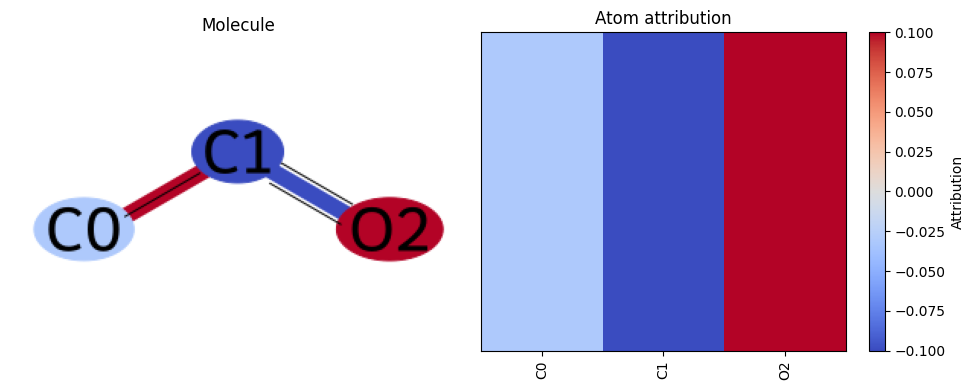

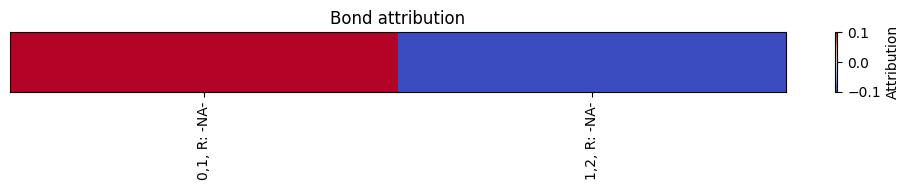

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import dgl
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import rdMolDraw2D
from matplotlib.colors import Normalize
from PIL import Image
from io import BytesIO
import pandas as pd

import os
os.environ['DYLD_LIBRARY_PATH'] = '/opt/homebrew/opt/cairo/lib'
os.environ['PKG_CONFIG_PATH'] = '/opt/homebrew/opt/cairo/lib/pkgconfig'

atomic_numbers = pd.read_csv(r'atomic_number_index.csv', index_col = False)

bond_to_index = {'SINGLE': 1, 'DOUBLE': 2, 'TRIPLE': 3, 'AROMATIC': 4, 'IsRing': 5}

import cairosvg

import numpy as np

def normalize_ig(ig_values):
    abs_values = np.abs(ig_values)
    min_val, max_val = np.min(abs_values), np.max(abs_values)
    normalized = (abs_values - min_val) / (max_val - min_val)
    return np.sign(ig_values) * normalized


target_id = list(dataset_candidates.items())[index_to_look_at][0]
smiles = list(dataset_candidates.items())[index_to_look_at][1]
predictions_dict = dict(predictions.iloc[target_id])

for k,v in predictions_dict.items():
   if k!= 'id':
      if v>.5:
         val = round(v, 2)
         print(f'{k}: {val}')

# smiles = list(combined_data['nonStereoSMILES'])[target_id]
mol = Chem.MolFromSmiles(smiles)
deepchem_graph_data, node_feats, edges, edge_feats = featurizer.featurize2(mol)
g = convert_to_dgl(deepchem_graph_data)

# Example IG values
# ig_values = np.array([-0.5, 0.3, 0.1, -0.2, 0.4])
# normalized_ig_values = normalize_ig(ig_values)
# print(normalized_ig_values)

# Load your graph, node, and edge attributions
# (replace this with your actual data loading and IG calculations)
# g = dgl.graph(([0, 1, 2], [1, 2, 3]))
attr = calculate_attributions(g = g, label_id = label_id)
node_attributions = attr[0].detach()
edge_attributions = attr[1].detach()


# Modify atom names (arbitrary example)
index_to_atomic_number = {}
# atom_colors = {0: (1, 0, 0),  # Red color for the first carbon atom
#                1: (0, 1, 0),  # Green color for the second carbon atom
#                2: (0, 0, 1)}  # Blue color for the oxygen atom

# bond_colors = {(0, 1): (0, 1, 1),  # Cyan color for the bond between the first and second carbon atoms
#                (1, 2): (1, 0, 1)}  # Magenta color for the bond between the second carbon atom and oxygen

for atom in mol.GetAtoms():
  atomic_number = atom.GetAtomicNum()
  get_index = atom.GetIdx()
  symbol = list(atomic_numbers[atomic_numbers['Atomic Number'] == atomic_number]['Symbol of the Element'])[0]
  index_to_atomic_number[get_index] = {'atomic_number': atomic_number, 'symbol': symbol}
  atom.SetProp('atomLabel', f'{symbol}{get_index}')


index_with_bond_type = {}
ring_attr = []
for bond in mol.GetBonds():
  index_with_bond_type[bond.GetIdx()] = bond.GetBondType()
  start, end = bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()
  ring_attr.append(bond.IsInRing())

     


# Normalize attributions for visualization
norm = Normalize(vmin=-0.1, vmax=0.1)

# # Prepare the molecule for drawing
# mol = Draw.PrepareMolForDrawing(mol)
# Prepare the molecule for drawing
rdDepictor.Compute2DCoords(mol)

required_node_attributions = []
atom_colors = {}
for idx, val in enumerate(node_attributions):
  atns = val[-107:-7]
  required_node_attributions.append(atns[index_to_atomic_number[idx]['atomic_number']-1])
  atom_colors[idx] = value_to_rgb(float(atns[index_to_atomic_number[idx]['atomic_number']-1]))

required_edge_attributions = []
bond_colors = {}
idx = 0
counter = 0
bond_names = []
while idx<len(edge_attributions):
    bond_vec = edge_attributions[idx]
    bondtype = index_with_bond_type[counter]
    index_to_look_at = bond_to_index[str(bondtype)]
    reqd_attr = bond_vec[index_to_look_at]
    bond_colors[counter] = value_to_rgb(float(reqd_attr))
    required_edge_attributions.append(reqd_attr)
    start, end = edges[0][idx], edges[1][idx]
    if ring_attr[counter]:
       ring_attr_value = round(float(bond_vec[-1]),2)
    else:
       ring_attr_value = '-NA-'
    bond_names.append(','.join([str(start), str(end), f' R: {ring_attr_value}']))
    counter += 1
    idx += 2


drawer = rdMolDraw2D.MolDraw2DSVG(300, 200)
drawOptions = drawer.drawOptions()

# Set all colors to black
drawOptions.useBWAtomPalette()
drawOptions.bondLineWidth = 1.0
drawOptions.colorBonds = False
drawOptions.highlightColour = (0, 0, 0)
# fig = Draw.MolToMPL(mol, size = (300,300))
# opts = drawer.drawOptions()
# for idx in atom_colors:
#     opts.atomColourPalette[idx] = atom_colors[idx]
# drawer.DrawMolecule(mol, highlightAtoms=list(atom_colors.keys()), highlightAtomColors=atom_colors, highlightBonds=bond_colors.keys(), highlightBondColors=bond_colors)
drawer.DrawMolecule(mol, highlightAtoms=list(atom_colors.keys()), highlightAtomColors=atom_colors, highlightBonds=list(bond_colors.keys()), highlightBondColors=bond_colors)
# drawer.DrawMolecule(mol)
drawer.FinishDrawing()
svg = drawer.GetDrawingText()

# Convert SVG to PNG
png = cairosvg.svg2png(bytestring=svg.encode('utf-8'))
image = Image.open(BytesIO(png))

# Display molecular structure
plt.figure(figsize=(10, 4))
plt.subplot(121)
plt.imshow(image)
plt.axis('off')
plt.title("Molecule")

# Generate node heatmap
try:
    node_heatmap = np.array(required_node_attributions) #torch.mean(node_attributions, dim=1).numpy()
except TypeError as e:
    print(f"Error: {e}")
    node_heatmap = node_attributions.mean(1) #.numpy()  # Fallback if dim=1 is not recognized

plt.subplot(122)
plt.imshow(node_heatmap.reshape(1, -1), cmap='coolwarm', aspect='auto', norm=norm)
plt.colorbar(label='Attribution')
plt.title("Atom attribution")
plt.yticks([])

x_ones = []
for i in range(len(node_heatmap)):
  symbol = index_to_atomic_number[i]['symbol']
  # atomic_num = index_to_atomic_number[i]['atomic_number']
  x_ones.append(f'{symbol}{i}')
plt.xticks(range(len(node_heatmap)), x_ones, rotation=90)

plt.tight_layout()
plt.show()

# Generate edge heatmap
plt.figure(figsize=(10, 2))
try:
    edge_heatmap = np.array(required_edge_attributions)#torch.mean(edge_attributions, dim=1).numpy()
except TypeError as e:
    print(f"Error: {e}")
    edge_heatmap = edge_attributions.mean(1) #.numpy()  # Fallback if dim=1 is not recognized

plt.imshow(edge_heatmap.reshape(1, -1), cmap='coolwarm', aspect='auto', norm=norm)
plt.colorbar(label='Attribution')
plt.title("Bond attribution")
plt.yticks([])
plt.xticks(range(len(edge_heatmap)), bond_names, rotation=90)

plt.tight_layout()
plt.show()

if index_to_look_at<len(list(dataset_candidates.items())):
  index_to_look_at += 1
else:
   index_to_look_at = 0

In [ ]:
for atom in mol.GetAtoms():
  atomic_number = atom.GetAtomicNum()
  get_index = atom.GetIdx()
#   symbol = list(atomic_numbers[atomic_numbers['Atomic Number'] == atomic_number]['Symbol of the Element'])[0]
  print(atomic_number, get_index)

6 0
6 1
8 2


### PCA all experiments 

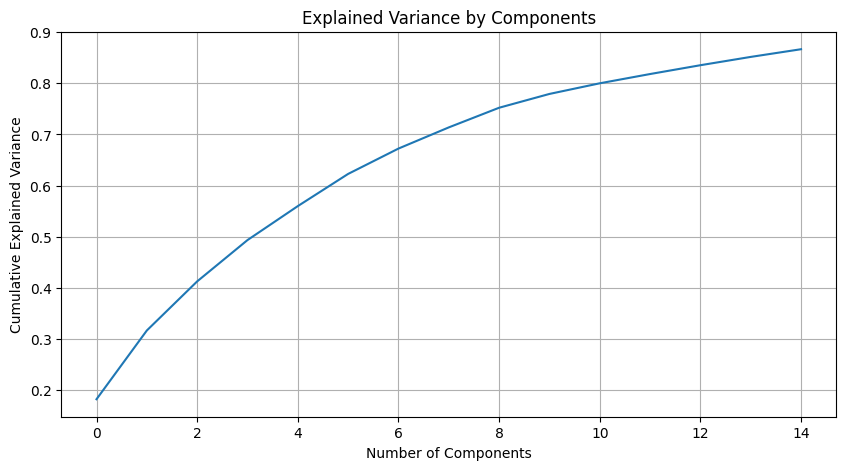

Top 5 contributing odours for each UMAP component:
PCA Component 1:
odorless: 0.379
sulfurous: 0.344
meaty: 0.298
roasted: 0.286
onion: 0.253
PCA Component 2:
woody: 0.329
floral: 0.272
phenolic: 0.191
balsamic: 0.191
spicy: 0.165
PCA Component 3:
fatty: 0.381
waxy: 0.378
oily: 0.211
green: 0.196
onion: 0.177
PCA Component 4:
roasted: 0.281
green: 0.279
nutty: 0.252
vegetable: 0.241
meaty: 0.218
PCA Component 5:
green: 0.209
herbal: 0.188
mint: 0.184
odorless: 0.173
camphoreous: 0.167
PCA Component 6:
green: 0.260
ethereal: 0.220
alcoholic: 0.183
sweet: 0.157
pungent: 0.141
PCA Component 7:
sulfurous: 0.423
onion: 0.271
garlic: 0.257
alliaceous: 0.252
meaty: 0.221
PCA Component 8:
alcoholic: 0.263
ethereal: 0.233
nutty: 0.209
cognac: 0.203
fermented: 0.185
PCA Component 9:
woody: 0.309
herbal: 0.165
camphoreous: 0.164
pine: 0.161
terpenic: 0.159
PCA Component 10:
sweet: 0.192
musk: 0.157
citrus: 0.146
sulfurous: 0.142
fatty: 0.135
PCA Component 11:
musk: 0.154
balsamic: 0.150
garlic: 0

In [ ]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assume `embeddings` is a numpy array of shape (num_samples, 256)
# Assume `labels` is a binary matrix of shape (num_samples, 104), where each column represents an odour

embeddings_all = np.asarray(combined_allembeddings)
# del combined_allembeddings
# Step 1: Dimensionality Reduction using PCA
pca = PCA(n_components=15)
principal_components = pca.fit_transform(embeddings_all)

# Plotting explained variance to find the optimal number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Components')
plt.grid(True)
plt.show()

# Choose n dimensions based on explained variance plot
n_components = 15
pca_n = PCA(n_components=n_components) #n_components=n_components)
principal_components_n = pca_n.fit_transform(embeddings_all)
# Step 2: Analyze Component Loadings with respect to labels
# Correlate each principal component with each label
correlations = np.array([np.corrcoef(principal_components_n[:, i], lvals[:, j])[0, 1]
                         for i in range(n_components) for j in range(138)]).reshape(n_components, 138)

# Assuming odour names are given as follows:
odour_names = np.array(TASKS)  # Replace with actual names if available

# # Print top contributing odours for each principal component
# print("Top contributing odours for each principal component:")
# for i in range(n_components):
#     print(f"Principal Component {i+1}:")
#     sorted_indices = np.argsort(np.abs(correlations[i]))[::-1]
#     print(odour_names[sorted_indices[:5]])  # Show top 5 odours for simplicity

# Print top contribu
# ting odours for each principal component along with their correlation values
# Print top 5 contributing odours for each UMAP component along with their correlation values
print("Top 5 contributing odours for each UMAP component:")
for i in range(n_components):
    print(f"PCA Component {i+1}:")
    sorted_indices = np.argsort(correlations[i])[::-1]  # Sort in descending order
    for j in sorted_indices[:5]:  # Show top 5 odours
        print(f"{odour_names[j]}: {correlations[i, j]:.3f}")

In [ ]:
principal_components_n[0]

array([15.38767738,  2.24326331, -2.39756496,  5.65535081, -7.90681954,
       -2.95644156, -2.63777676,  9.46719486,  2.45732758, -0.4705608 ,
       -7.61419115, -0.56223274,  2.84286596, -1.19298077, -1.35585928])

In [ ]:
import torch.nn.functional as F


def get_probabilites(vectorval):
    activation_func = model.model.activation(torch.tensor(vectorval, dtype=torch.float32))
    final_linear = model.model.linears[-1](activation_func)
    logits = model.model.get_logits_from_output(output=final_linear)
    output_values: torch.Tensor = F.sigmoid(logits)
    output_values = output_values.reshape(-1).detach().numpy()
    return output_values  

def get_labels_along_vector(vectorval):
    output_values: torch.Tensor = get_probabilites(vectorval)

    label_vals = []
    for idx, v in enumerate(output_values):
        if v>.5:
            label_vals.append([TASKS[idx], v])

    return label_vals

# for idx, val in enumerate(pca_n.components_):
#     print(f'PCA {idx+1}: {get_labels_along_vector(val)}')

In [ ]:
# Generate points along the direction of v
t_values = np.linspace(-2, 2, 100)  # Generate 100 points for t in the range [-2, 2]
print(t_values)
points = np.outer(t_values, pca_n.components_[0])  # Compute the points as t * v

[-2.         -1.95959596 -1.91919192 -1.87878788 -1.83838384 -1.7979798
 -1.75757576 -1.71717172 -1.67676768 -1.63636364 -1.5959596  -1.55555556
 -1.51515152 -1.47474747 -1.43434343 -1.39393939 -1.35353535 -1.31313131
 -1.27272727 -1.23232323 -1.19191919 -1.15151515 -1.11111111 -1.07070707
 -1.03030303 -0.98989899 -0.94949495 -0.90909091 -0.86868687 -0.82828283
 -0.78787879 -0.74747475 -0.70707071 -0.66666667 -0.62626263 -0.58585859
 -0.54545455 -0.50505051 -0.46464646 -0.42424242 -0.38383838 -0.34343434
 -0.3030303  -0.26262626 -0.22222222 -0.18181818 -0.14141414 -0.1010101
 -0.06060606 -0.02020202  0.02020202  0.06060606  0.1010101   0.14141414
  0.18181818  0.22222222  0.26262626  0.3030303   0.34343434  0.38383838
  0.42424242  0.46464646  0.50505051  0.54545455  0.58585859  0.62626263
  0.66666667  0.70707071  0.74747475  0.78787879  0.82828283  0.86868687
  0.90909091  0.94949495  0.98989899  1.03030303  1.07070707  1.11111111
  1.15151515  1.19191919  1.23232323  1.27272727  1.3

In [ ]:

def get_most_delta_along_vector(vectorval, range=(-20, 20)):
    # Generate points along the direction of v
    t_values = np.linspace(range[0], range[1], 100)  # Generate 100 points for t in the range [-2, 2]
    points = np.outer(t_values, vectorval)  # Compute the points as t * v

    each_smell = {}
    for idx, val in enumerate(points):
        probas = get_probabilites(val)
        for idx, s in enumerate(TASKS):
            if s not in each_smell:
                each_smell[s] = []
            each_smell[s].append(probas[idx])

    ranges = {}
    for k,v in each_smell.items():
        ranges[k] = np.max(v) - np.min(v)

    ranges = sorted(list(ranges.items()), key=lambda x: x[1], reverse=True)
    return ranges

In [ ]:

def accumulate_deltas_across_pca(pca_components):
    pca_deltas = {}
    for pc in pca_components:
        itemlist = get_most_delta_along_vector(pc, range=(-5, 5))
        topval = itemlist[0]
        if topval[0] not in pca_deltas:
            pca_deltas[topval[0]] = []  
        pca_deltas[topval[0]].append(topval[1])
    return pca_deltas

accumulate_deltas_across_pca(pca_n.components_[:30])

{'floral': [0.4537849],
 'fruity': [0.47840092],
 'waxy': [0.39264965],
 'green': [0.36817354],
 'caramellic': [0.37704086, 0.2894337, 0.29868394],
 'cognac': [0.33791745],
 'sulfurous': [0.44668597, 0.31162158, 0.2920973],
 'alcoholic': [0.36767983, 0.3316543],
 'woody': [0.3477398],
 'cheesy': [0.36977538, 0.31290972],
 'citrus': [0.37911516],
 'sweet': [0.41831878],
 'phenolic': [0.32855207],
 'earthy': [0.3073264],
 'alliaceous': [0.30127084],
 'lemon': [0.28606194],
 'jasmin': [0.33539057, 0.28704423],
 'grape': [0.3059218],
 'musk': [0.28461617, 0.30029327],
 'geranium': [0.3130258],
 'ketonic': [0.31640446],
 'orris': [0.2524982]}

In [ ]:
import numpy as np
from scipy.linalg import null_space

# # Define your n-dimensional vector v
# v = np.array([1, 2, 3, 4])

# Find a vector that is perpendicular to v using null space
# # v.dot(w) = 0, so we find the null space of the transpose of v
# w = null_space(pca_n.components_[0].reshape(1, -1)).flatten()

null_space_vectors = null_space(pca_n.components_[0].reshape(1, -1))

# Select the first vector in the null space and normalize it (if needed)
w = null_space_vectors[:, 0]

outs1 = get_probabilites(w)

# print("Original vector v:", v)
# print("Perpendicular vector w:", w)


In [ ]:
outs2 = get_probabilites(pca_n.components_[0])

In [ ]:
outs2[outs2>.5]

array([0.50214595], dtype=float32)

In [ ]:
outs1[outs1>0.5]

array([0.50013614, 0.5047587 , 0.5086456 , 0.5027714 , 0.5068881 ,
       0.50495946, 0.51083463, 0.501684  , 0.50259125, 0.5121498 ,
       0.50715137, 0.50334954, 0.5043855 , 0.50989145, 0.50124156,
       0.5064573 , 0.5107822 , 0.506541  , 0.51094025], dtype=float32)

In [ ]:
get_most_delta_along_vector(pca_n.components_[10], range=(-5, 5))

[('citrus', 0.37911516),
 ('roasted', 0.29436326),
 ('lactonic', 0.28350627),
 ('lemon', 0.2788704),
 ('ketonic', 0.27839258),
 ('beefy', 0.26562285),
 ('hazelnut', 0.26067257),
 ('bergamot', 0.25850415),
 ('grape', 0.25707513),
 ('coffee', 0.25461203),
 ('musk', 0.25334322),
 ('animal', 0.25324282),
 ('gassy', 0.2529898),
 ('odorless', 0.2513944),
 ('meaty', 0.24981363),
 ('grapefruit', 0.2483357),
 ('orange', 0.2480571),
 ('amber', 0.24731985),
 ('cabbage', 0.24659277),
 ('garlic', 0.24626511),
 ('brandy', 0.24422799),
 ('jasmin', 0.24230643),
 ('smoky', 0.2388641),
 ('cucumber', 0.23696513),
 ('cheesy', 0.23522404),
 ('orangeflower', 0.23521169),
 ('popcorn', 0.23437226),
 ('coumarinic', 0.23395447),
 ('black currant', 0.23348567),
 ('cortex', 0.23280412),
 ('pine', 0.23178643),
 ('tobacco', 0.23004735),
 ('lavender', 0.22698748),
 ('cherry', 0.22677243),
 ('sandalwood', 0.22676972),
 ('geranium', 0.22537345),
 ('phenolic', 0.22527918),
 ('banana', 0.22351512),
 ('cocoa', 0.22279334

In [ ]:
accumulate_deltas_across_pca(pca_n.components_[:12])

{'floral': [0.4537849],
 'fruity': [0.47840092],
 'waxy': [0.39264965],
 'green': [0.36817354],
 'caramellic': [0.37704086],
 'cognac': [0.33791745],
 'sulfurous': [0.44668597],
 'alcoholic': [0.36767983],
 'woody': [0.3477398],
 'cheesy': [0.36977538],
 'citrus': [0.37911516],
 'sweet': [0.41831878]}

In [ ]:
activation_func = model.model.activation(torch.tensor(points[0], dtype=torch.float32))
final_linear = model.model.linears[-1](activation_func)
logits = model.model.get_logits_from_output(output=final_linear)
output_values: torch.Tensor = F.sigmoid(logits)
output_values = output_values.reshape(-1).detach().numpy()
output_values

array([0.33822942, 0.43633747, 0.31632894, 0.38796425, 0.43202204,
       0.39815432, 0.4214733 , 0.47550848, 0.47313094, 0.42402148,
       0.45349035, 0.45072746, 0.3650291 , 0.46500024, 0.46585578,
       0.40567753, 0.41430226, 0.4056849 , 0.33196393, 0.39093593,
       0.35311785, 0.40420178, 0.39642432, 0.38108906, 0.4241784 ,
       0.39864963, 0.38912886, 0.4126781 , 0.42638248, 0.41513237,
       0.48744473, 0.44160208, 0.39787304, 0.38327283, 0.43475333,
       0.33546633, 0.4136831 , 0.38746822, 0.39370698, 0.43804413,
       0.38917258, 0.43044648, 0.41783243, 0.39923114, 0.46189836,
       0.44600666, 0.39908686, 0.47465828, 0.39382055, 0.38226962,
       0.56154853, 0.49319512, 0.43605798, 0.58442026, 0.3231885 ,
       0.32161567, 0.47124106, 0.43528107, 0.43660092, 0.43229845,
       0.5628552 , 0.39817277, 0.44207987, 0.36747518, 0.4883369 ,
       0.4727843 , 0.4422732 , 0.44011047, 0.4263967 , 0.3851618 ,
       0.4346092 , 0.45667145, 0.4593478 , 0.41620374, 0.44826

### Generate pca

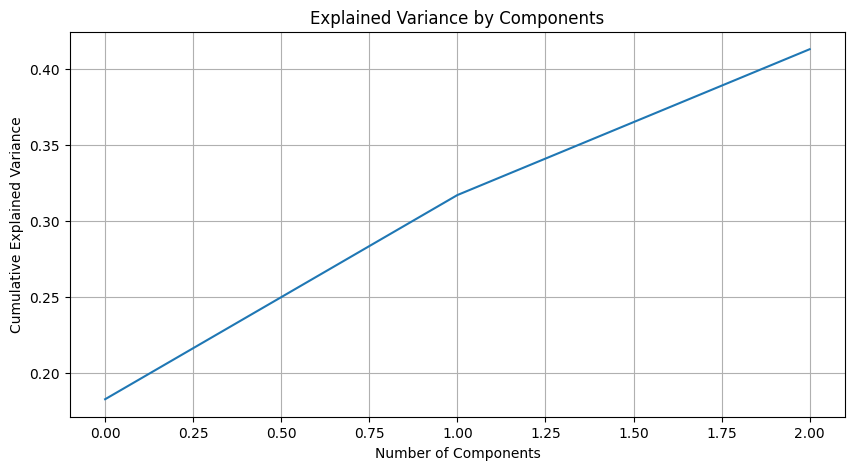

Top 5 contributing odours for each UMAP component:
PCA Component 1:
odorless: 0.379
sulfurous: 0.344
meaty: 0.298
roasted: 0.286
onion: 0.253
PCA Component 2:
woody: 0.329
floral: 0.272
phenolic: 0.191
balsamic: 0.191
spicy: 0.165
PCA Component 3:
fatty: 0.381
waxy: 0.378
oily: 0.211
green: 0.196
onion: 0.177
PCA Component 4:
roasted: 0.281
green: 0.279
nutty: 0.252
vegetable: 0.241
meaty: 0.218
PCA Component 5:
green: 0.209
herbal: 0.188
mint: 0.184
odorless: 0.173
camphoreous: 0.167
PCA Component 6:
green: 0.260
ethereal: 0.220
alcoholic: 0.183
sweet: 0.157
pungent: 0.141
PCA Component 7:
sulfurous: 0.423
onion: 0.271
garlic: 0.257
alliaceous: 0.252
meaty: 0.221
PCA Component 8:
alcoholic: 0.263
ethereal: 0.233
nutty: 0.209
cognac: 0.203
fermented: 0.185
PCA Component 9:
woody: 0.309
herbal: 0.165
camphoreous: 0.164
pine: 0.161
terpenic: 0.159
PCA Component 10:
sweet: 0.192
musk: 0.157
citrus: 0.146
sulfurous: 0.142
fatty: 0.135
PCA Component 11:
musk: 0.154
balsamic: 0.150
garlic: 0

In [236]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assume `embeddings` is a numpy array of shape (num_samples, 256)
# Assume `labels` is a binary matrix of shape (num_samples, 104), where each column represents an odour

embeddings_all = np.asarray(combined_allembeddings)
# del combined_allembeddings
# Step 1: Dimensionality Reduction using PCA
pca = PCA(n_components=3)
principal_components = pca.fit_transform(embeddings_all)

# Plotting explained variance to find the optimal number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Components')
plt.grid(True)
plt.show()

# Choose n dimensions based on explained variance plot
n_components = 256
pca_n = PCA(n_components=n_components) #n_components=n_components)
principal_components_n = pca_n.fit_transform(embeddings_all)
# Step 2: Analyze Component Loadings with respect to labels
# Correlate each principal component with each label
correlations = np.array([np.corrcoef(principal_components_n[:, i], lvals[:, j])[0, 1]
                         for i in range(n_components) for j in range(138)]).reshape(n_components, 138)

# Assuming odour names are given as follows:
odour_names = np.array(TASKS)  # Replace with actual names if available

# # Print top contributing odours for each principal component
# print("Top contributing odours for each principal component:")
# for i in range(n_components):
#     print(f"Principal Component {i+1}:")
#     sorted_indices = np.argsort(np.abs(correlations[i]))[::-1]
#     print(odour_names[sorted_indices[:5]])  # Show top 5 odours for simplicity

# Print top contribu
# ting odours for each principal component along with their correlation values
# Print top 5 contributing odours for each UMAP component along with their correlation values
print("Top 5 contributing odours for each UMAP component:")
for i in range(n_components):
    print(f"PCA Component {i+1}:")
    sorted_indices = np.argsort(correlations[i])[::-1]  # Sort in descending order
    for j in sorted_indices[:5]:  # Show top 5 odours
        print(f"{odour_names[j]}: {correlations[i, j]:.3f}")

In [237]:
combined_data_w_pca = []

count = 0
for idx, row in combined_data.iterrows():
    dfdict = dict(row)
    dfdict['coords'] = principal_components_n[count]
    combined_data_w_pca.append(dfdict)
    count += 1

combined_data_w_pca = pd.DataFrame(combined_data_w_pca)

combined_data_w_pca.to_csv(r'combined_data_w_pca.csv', index= False)


combined_data_w_preds_w_pca = []

count = 0
for idx, row in combined_data_w_preds.iterrows():
    dfdict = dict(row)
    dfdict['coords'] = principal_components_n[count]
    combined_data_w_preds_w_pca.append(dfdict)
    count += 1

combined_data_w_preds_w_pca = pd.DataFrame(combined_data_w_preds_w_pca)

combined_data_w_preds_w_pca.to_csv(r'combined_data_w_preds_w_pca.csv', index = False)

In [238]:
# combined_data_w_pca = pd.read_csv(r'combined_data_w_pca.csv', index_col = False)
# combined_data_w_preds_w_pca = pd.read_csv(r'combined_data_w_preds_w_pca.csv', index_col = False)

### Plotplot PCA plots

In [160]:
import traceback

In [161]:
convex_hull_3d_points = {'sweet': 36, 'fruity': 33, 'green': 26, 'floral': 24, 'waxy': 18, 'apple': 14, 'tropical': 13, 'woody': 11, 'ethereal': 11, 'spicy': 11, 'pineapple': 10, 'powdery': 9, 'rose': 9, 'cherry': 9, 'pear': 9, 'fatty': 8, 'phenolic': 7, 'banana': 7, 'herbal': 6, 'fresh': 6, 'berry': 5, 'anisic': 5, 'coumarinic': 5, 'hawthorn': 5, 'vanilla': 5, 'citrus': 5, 'geranium': 4, 'hay': 4, 'melon': 4, 'sulfurous': 4, 'aldehydic': 3, 'almond': 3, 'honey': 3, 'medicinal': 3, 'smoky': 3, 'ripe': 3, 'burnt': 3, 'oily': 3, 'onion': 3, 'roasted': 3, 'odorless': 3, 'orris': 2, 'violet': 2, 'metallic': 2, 'leathery': 2, 'pungent': 2, 'nutty': 2, 'ketonic': 2, 'cucumber': 2, 'orange': 2, 'cooked': 2, 'meaty': 2, 'balsamic': 2, 'alliaceous': 2, 'fishy': 2, 'cheesy': 2, 'raspberry': 1, 'alcoholic': 1, 'solvent': 1, 'camphoreous': 1, 'aromatic': 1, 'bitter': 1, 'cinnamon': 1, 'winey': 1, 'dry': 1, 'animal': 1, 'tobacco': 1, 'jasmin': 1, 'fermented': 1, 'caramellic': 1, 'garlic': 1, 'savory': 1}

In [162]:
topk = 10
topk_labels = []
count = 0
for k,v in convex_hull_3d_points.items():
    if count<topk:
        topk_labels.append(k)
    count += 1

single_labels = []
valid_embedding_points = []
valid_embedding_points_3d = []

for idx, ls in enumerate(combined_alllabels):
    try:
        probas = []
        for lval in ls:
            probas.append((lval, combined_allpredictions[idx][TASKS.index(lval)]))
        sorted_probas = sorted(probas, key=lambda x: x[1], reverse=True)
        max_proba = sorted_probas[0]
        high_conc_label = max_proba[0]

        if high_conc_label in topk_labels and high_conc_label not in {'tropical'}:
            single_labels.append(max_proba[0])
            valid_embedding_points.append(principal_components[idx][:2])
            valid_embedding_points_3d.append(principal_components[idx][:3])
    except:
        pass
    

In [163]:
len(set(topk_labels))

10

In [164]:
countlabels = {}
for val in single_labels:
    if val not in countlabels:
        countlabels[val] = 0
    countlabels[val] += 1

print(countlabels)

{'green': 690, 'fruity': 1323, 'sweet': 397, 'floral': 623, 'woody': 356, 'spicy': 75, 'ethereal': 18, 'waxy': 69}


In [165]:
import numpy as np
import plotly.express as px

# Example data
# points = np.array([[1, 2], [2, 3], [3, 4], [4, 5]])
# labels = ['A', 'B', 'A', 'C']

points = valid_embedding_points
labels = single_labels

# Convert to a DataFrame for easier plotting with Plotly
import pandas as pd
df = pd.DataFrame(points, columns=['x', 'y'])
df['label'] = labels

# Determine the minimum count across labels
min_count = df['label'].value_counts().min()

# Resample each label group to have an equal number of samples
df_balanced = df.groupby('label', group_keys=False).apply(lambda x: x.sample(min_count))

# Plot
fig = px.scatter(df_balanced, x='x', y='y', color='label', title="2D Points with Distinguishable Colors")
fig.show()


In [166]:
import numpy as np
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'notebook'


# Example data
# points = np.array([[1, 2], [2, 3], [3, 4], [4, 5]])
# labels = ['A', 'B', 'A', 'C']

points = valid_embedding_points_3d
labels = single_labels

# Convert to a DataFrame for easier plotting with Plotly
df = pd.DataFrame(points, columns=['x', 'y', 'z'])
df['label'] = labels

# Determine the minimum count across labels
min_count = df['label'].value_counts().min()

# Resample each label group to have an equal number of samples
df_balanced = df.groupby('label', group_keys=False).apply(lambda x: x.sample(min_count))

# 3D Plot
fig = px.scatter_3d(df_balanced, x='x', y='y', z='z', color='label', title="3D Points with Distinguishable Colors")
fig.show()

### Intensity based plots

In [245]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


convex_hull_3d_points = {'sweet': 36, 'fruity': 33, 'green': 26, 'floral': 24, 'waxy': 18, 'apple': 14, 'tropical': 13, 'woody': 11, 'ethereal': 11, 'spicy': 11, 'pineapple': 10, 'powdery': 9, 'rose': 9, 'cherry': 9, 'pear': 9, 'fatty': 8, 'phenolic': 7, 'banana': 7, 'herbal': 6, 'fresh': 6, 'berry': 5, 'anisic': 5, 'coumarinic': 5, 'hawthorn': 5, 'vanilla': 5, 'citrus': 5, 'geranium': 4, 'hay': 4, 'melon': 4, 'sulfurous': 4, 'aldehydic': 3, 'almond': 3, 'honey': 3, 'medicinal': 3, 'smoky': 3, 'ripe': 3, 'burnt': 3, 'oily': 3, 'onion': 3, 'roasted': 3, 'odorless': 3, 'orris': 2, 'violet': 2, 'metallic': 2, 'leathery': 2, 'pungent': 2, 'nutty': 2, 'ketonic': 2, 'cucumber': 2, 'orange': 2, 'cooked': 2, 'meaty': 2, 'balsamic': 2, 'alliaceous': 2, 'fishy': 2, 'cheesy': 2, 'raspberry': 1, 'alcoholic': 1, 'solvent': 1, 'camphoreous': 1, 'aromatic': 1, 'bitter': 1, 'cinnamon': 1, 'winey': 1, 'dry': 1, 'animal': 1, 'tobacco': 1, 'jasmin': 1, 'fermented': 1, 'caramellic': 1, 'garlic': 1, 'savory': 1, 'boozy': 1}
topk = len(convex_hull_3d_points)#35
topk_labels = []
count = 0
for k,v in convex_hull_3d_points.items():
    if count<topk:
        topk_labels.append(k)
    count += 1

topk_labels.pop(topk_labels.index('tropical'))

def generate_points_intensities(label_name):
    intensities = []
    valid_embedding_points = []
    valid_embedding_points_3d = []

    for idx, ls in enumerate(combined_alllabels):
        try:
            if label_name in ls:
                intensity = combined_allpredictions[idx][TASKS.index(label_name)]
                intensities.append(intensity)
                valid_embedding_points.append(principal_components[idx][:2])
                valid_embedding_points_3d.append(principal_components[idx][:3])
        except:
            pass
            print(traceback.format_exc())
    
    
    return np.asarray(valid_embedding_points), np.asarray(valid_embedding_points_3d), intensities


points2d, points3d, intensities = generate_points_intensities('woody')


def generate_intensities_from_complete_data(complete_data_df):
    df_to_capture_intensities = []
    for idx1, row in complete_data_df.iterrows():
        # max_odour_name = row['ID']
        # max_p = row[f'p_{max_odour_name}']
        for idx2, od in enumerate(TASKS):
            rdict = {'coords': row['coords'], 'label': od, 'intensity': row[f'p_{od}']}
            df_to_capture_intensities.append(rdict)
    
    return pd.DataFrame(df_to_capture_intensities)


# Create a custom color map that fades to transparency
cmap = plt.cm.viridis
norm = mcolors.Normalize(vmin=0, vmax=1)
colors = cmap(norm(np.linspace(0, 1, 256)))

# Adding an alpha channel that decreases linearly
alphas = np.linspace(1, 0, 256)
colors[:, -1] = alphas

# Create a new colormap with the transparent fade effect
transparent_cmap = mcolors.ListedColormap(colors)



import plotly.graph_objects as go

# Example data
X = np.random.rand(100)
Y = np.random.rand(100)
Z = np.random.rand(100)
dispersion = np.random.rand(100)

# Create a custom colorscale with RGBA values
n_colors = 256
viridis = plt.cm.viridis_r(np.linspace(0, 1, n_colors))

# Add decreasing alpha values for transparency
alphas = np.linspace(1, 0, n_colors)
viridis[:, -1] = alphas  # Adjust the alpha channel

# Convert to Plotly's colorscale format
transparent_colorscale = [
    [i / (n_colors - 1), f'rgba({int(r*255)}, {int(g*255)}, {int(b*255)}, {a})']
    for i, (r, g, b, a) in enumerate(viridis)
]


def generate_base_colors(labels):
    # Remove duplicates and sort labels
    unique_labels = sorted(set(labels))
    num_labels = len(unique_labels)
    
    # Generate a colormap
    colormap = plt.get_cmap('tab20', num_labels)  # 'tab20' has 20 distinct colors
    
    # Create a dictionary with colors
    base_colors = {}
    for i, label in enumerate(unique_labels):
        base_colors[label] = [int(c * 255) for c in colormap(i)]
    
    return base_colors

In [244]:
combined_data_w_preds_w_pca.head()

,SMILES,descriptors,alcoholic,aldehydic,alliaceous,almond,amber,animal,anisic,apple,...,p_vegetable,p_vetiver,p_violet,p_warm,p_waxy,p_weedy,p_winey,p_woody,max_odour_name,coords
0,CC1=NC=CN=C1C,"Edible72,Wood10,Green5,Balsamic5,Dairy3;vanill...",0,0,0,0,0,0,0,0,...,0.304871,0.072016,0.019827,0.083761,0.010467,0.037884,0.126330,0.161561,nutty,"[15.387677378788814, 2.2432633076736392, -2.39..."
1,CC1=C(SC(=N1)C)C(=O)C,"Edible42,Wood21,Musk15,Dairy9,Vanilla6,Narcoti...",0,0,0,0,0,0,0,0,...,0.391189,0.069082,0.050891,0.058548,0.014712,0.039310,0.031149,0.145432,roasted,"[6.243254248499835, -6.492269985494348, -1.861..."
2,CC(=O)C1=NC=CN=C1,"Edible88,Vanilla5,Green3,Orchid2,Narcotic2,Jas...",0,0,0,0,0,0,0,0,...,0.192703,0.071309,0.091041,0.026567,0.010346,0.041771,0.058311,0.098450,nutty,"[6.516610214897597, -6.29444814472332, -0.9684..."
3,CC1=CSC(=N1)C(C)C,"Edible50,Dairy20,Fruity10,Narcotic5,Green5,Spi...",0,0,0,0,0,0,0,0,...,0.580174,0.062544,0.059922,0.036119,0.107087,0.109691,0.028217,0.128522,green,"[-0.9452111623335032, -8.943343616740936, 4.60..."
4,CC/C=C(\C)/C(=O)O,"Fruity45,Herb30,Aliphatic25;fruity,herbal,fatty",0,0,0,0,0,0,0,0,...,0.399452,0.030598,0.076673,0.483245,0.256020,0.244700,0.296911,0.510566,fruity,"[-4.9418452489286375, -6.56645268268041, -4.78..."


In [226]:
# import numpy as np
# import plotly.graph_objects as go

# points = points2d


# # Create the scatter plot
# scatter = go.Scatter(
#     x=points[:, 0],
#     y=points[:, 1],
#     mode='markers',
#     marker=dict(
#         size=10,  # Adjust marker size as needed
#         color=intensities,
#         colorscale='Viridis_r',  # Choose a colorscale
#         showscale=True  # Show the color scale
#     )
# )

# # Create the figure
# fig = go.Figure(data=[scatter])

# # Set titles and labels
# fig.update_layout(
#     title='2D Points Heatmap',
#     xaxis_title='X Axis',
#     yaxis_title='Y Axis',
#     xaxis=dict(scaleanchor='y', scaleratio=1)  # Ensure aspect ratio is 1:1
# )

# # Show the figure
# fig.show()

In [227]:
# data = []
# dframe = []
# for l in topk_labels:
#     points2d, points3d, intensities = generate_points_intensities(l)
#     for idx, p in enumerate(points3d):
#         dframedict = {'label': l}
#         dframedict['x'] = p[0]
#         dframedict['y'] = p[1]
#         dframedict['z'] = p[2]
#         dframedict['intensity'] = intensities[idx]
#         dframe.append(dframedict)

# intensity_topk_3d = pd.DataFrame(dframe)

# intensity_topk_3d.to_csv(r'intensity_topk_3d_30.csv', index=False)

### Calculate epicenters by weighted avg

In [239]:
import pandas as pd
import numpy as np

def calculate_intensity_epicenters_weighted(df):
    epicenters = []

    # Iterate through each unique label
    for label in df['label'].unique():
        # Filter the dataframe for the current label
        label_df = df[df['label'] == label]
        # Calculate the weighted averages of x, y, z using the intensity as weights
        weight_sum = label_df['intensity'].sum()
        x_epicenter = (label_df['x'] * label_df['intensity']).sum() / weight_sum
        y_epicenter = (label_df['y'] * label_df['intensity']).sum() / weight_sum
        z_epicenter = (label_df['z'] * label_df['intensity']).sum() / weight_sum
        # Append the result as a dictionary to the epicenters list
        epicenters.append({
            'label': label,
            'x': x_epicenter,
            'y': y_epicenter,
            'z': z_epicenter
        })

    # Convert the list of dictionaries to a dataframe and return it
    epicenter_df = pd.DataFrame(epicenters)
    return epicenter_df


def calculate_intensity_epicenters_weighted_nD(df):
    epicenters = []
    # Iterate through each unique label
    for label in df['label'].unique():
        # Filter the dataframe for the current label
        label_df = df[df['label'] == label]
        # Calculate the weighted averages of x, y, z using the intensity as weights
        weight_sum = label_df['intensity'].sum()
        nD_epicenter = (label_df['coords'] * label_df['intensity']).sum() / weight_sum
        # y_epicenter = (label_df['y'] * label_df['intensity']).sum() / weight_sum
        # z_epicenter = (label_df['z'] * label_df['intensity']).sum() / weight_sum
        # Append the result as a dictionary to the epicenters list
        epicenters.append({
            'label': label,
            'epicenter': nD_epicenter
        })
    # Convert the list of dictionaries to a dataframe and return it
    epicenter_df = pd.DataFrame(epicenters)
    return epicenter_df



# Example usage
# Assuming 'df' is your existing dataframe
# Load the data
# file_path = 'intensity_topk_3d_all.csv'
# df = pd.read_csv(file_path)
# intensity_epicenters_df = calculate_intensity_epicenters_weighted(df)
# print(intensity_epicenters_df.head())


# Example usage
# Assuming 'df' is your existing dataframe
# Load the data
file_path = 'intensity_topk_3d_all.csv'
df = pd.read_csv(file_path)
intensity_epicenters_df = calculate_intensity_epicenters_weighted(df)
print(intensity_epicenters_df.head())

    label         x         y         z
0   sweet -3.654788  1.106519 -2.266331
1  fruity -3.937926 -4.076819 -0.467374
2   green -3.726859 -2.785268  1.620532
3  floral -6.101893  3.224382 -0.692040
4    waxy -3.650045  0.665711  7.008423


### Calculate epicenters by modelling

In [ ]:
from scipy.optimize import minimize
import numpy as np

import pandas as pd

# Load the data
file_path = 'intensity_topk_3d_all.csv'
df = pd.read_csv(file_path)

# Function to calculate the negative intensity at a given point, to be minimized
def neg_intensity(point, x, y, z, intensity):
    # Calculate the squared distance from the point to each (x, y, z)
    distances = np.sqrt((x - point[0])**2 + (y - point[1])**2 + (z - point[2])**2)
    
    # Model intensity as inversely proportional to the distance
    modeled_intensity = np.exp(-distances)
    
    # Sum of squared differences between the actual intensity and the modeled intensity
    return np.sum((intensity - modeled_intensity)**2)

# List to store the results
epicenters = []

# Group the dataframe by label
grouped = df.groupby('label')

# Iterate through each label and calculate the intensity epicenter
for label, group in grouped:
    x = group['x'].values
    y = group['y'].values
    z = group['z'].values
    intensity = group['intensity'].values
    
    # Initial guess for the epicenter is the mean of the coordinates
    initial_guess = [x.mean(), y.mean(), z.mean()]
    
    # Minimize the negative intensity function
    result = minimize(neg_intensity, initial_guess, args=(x, y, z, intensity))
    
    # Store the label and epicenter coordinates
    epicenters.append({
        'label': label,
        'x_epicenter': result.x[0],
        'y_epicenter': result.x[1],
        'z_epicenter': result.x[2]
    })

# Convert the results to a DataFrame
epicenters_df = pd.DataFrame(epicenters)

# Save the results to a CSV file
output_file_path = 'intensity_epicenters.csv'
epicenters_df.to_csv(output_file_path, index=False)

epicenters_df.head(), output_file_path


(        label  x_epicenter  y_epicenter  z_epicenter
 0   alcoholic    -1.307582    -7.842678     0.788620
 1   aldehydic    -5.753204     3.106072     3.491516
 2  alliaceous    14.632842    -4.732395     9.797963
 3      almond    -4.113222    -0.215345    -5.156209
 4      animal     1.941124     7.837463    -0.530972,
 'intensity_epicenters.csv')

### Sort labels based on f1-score

In [171]:
import sklearn
import json

threshold = .6

predictions = model.predict(test_dataset)


all_dgl_graphs = [convert_to_dgl(g) for g in test_dataset.X]
g = dgl.batch(all_dgl_graphs)
node_feats_dataset: torch.Tensor = torch.tensor(g.ndata['x'], requires_grad = True)
edge_feats_dataset: torch.Tensor = torch.tensor(g.edata['edge_attr'], requires_grad = True)
model.model.load_graph_obj(g)
outputs = model.model(node_feats_dataset, edge_feats_dataset, torch.tensor([1])).detach().numpy()
outputs = np.squeeze(outputs)

y_pred = np.where(predictions>0.5, True, False).astype(np.int32) #.flatten()
y_true = test_dataset.y.astype(np.int32) #.flatten()


classification_report = sklearn.metrics.classification_report(y_true= y_true, y_pred = y_pred, target_names=TASKS, zero_division=True)


split_list = classification_report.split('\n')
odour_dict = {}
for idx, s in enumerate(split_list):
    if idx >= 2:
        odour_properties = s.split()
        try:
            odour_dict[odour_properties[0]] = {'precision': odour_properties[1], 'recall': odour_properties[2],'f1_score': odour_properties[3], 'support': odour_properties[4]}
        except:
            pass

odour_dict = dict(sorted(list(odour_dict.items()), key=lambda x: float(x[1]['f1_score']), reverse= True))


high_accuracy_odours = []
for k in odour_dict:
    if float(odour_dict[k]['f1_score'])>= threshold:
        high_accuracy_odours.append(k)



In [172]:
### Add f1 score to code

# weighted_epicenters = pd.read_csv(r'intensity_epicenters_weighted.csv', index_col = False)

# nlist = []
# for idx, row in weighted_epicenters.iterrows():
#     dfdict = dict(row)
#     lval = row['label']
#     f1 = odour_dict[lval]['f1_score']
#     dfdict['f1'] = f1
#     nlist.append(dfdict)

# ndf = pd.DataFrame(nlist)

# ndf.to_csv(r'weighted_epicenters_f1score.csv', index = False)
    


In [173]:
for f in flavour_buckets2:
    if len(set(flavour_buckets2[f]).intersection(set(high_accuracy_odours)))==0:
        print(f'no odour from {f} present!')

no odour from Woody and Earthy present!
no odour from Clean and Fresh present!


### Using simple weighted avg to find most intense point

In [174]:
weighted_epicenters = pd.read_csv(r'intensity_epicenters_weighted.csv', index_col = False)

In [175]:
import plotly.graph_objects as go
import pandas as pd
import plotly.express as px

# Assuming your dataframe is named df and has columns 'label', 'x', 'y', 'z'
df = weighted_epicenters

# Generate unique colors for each label
unique_labels = df['label'].unique()
color_map = {label: px.colors.qualitative.Plotly[i % len(px.colors.qualitative.Plotly)] for i, label in enumerate(unique_labels)}

# Assign colors based on labels
df['color'] = df['label'].map(color_map)

# Create the 3D scatter plot
fig = go.Figure()

for label in unique_labels:
    label_data = df[df['label'] == label]
    fig.add_trace(go.Scatter3d(
        x=label_data['x'],
        y=label_data['y'],
        z=label_data['z'],
        mode='markers',
        marker=dict(
            size=10,  # Adjust size for better visibility
            color=label_data['color'],
        ),
        name=label
    ))

# Set layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='X Axis',
        yaxis_title='Y Axis',
        zaxis_title='Z Axis',
    ),
    legend_title='Labels',
    title='3D Scatter Plot of Points with Unique Labels',
    template='plotly_white'
)

fig.show()


### Using simple weighted avg to analyze most intense points - With Thresholding

In [176]:
weighted_epicenters_f1score = pd.read_csv(r'weighted_epicenters_f1score.csv', index_col = False)

In [177]:
'''
Might be similar based on distance?
- Fruity, green
- roasted meaty
- balsamic, honey
- Fatty, oil, waxy
- smoky, leathery?
'''

ambiguous_labels = ['herbal', 'aldehydic', 'geranium', 'waxy', 'anisic']

In [178]:
import plotly.graph_objects as go
import pandas as pd
import plotly.express as px

# Assuming your dataframe is named df and has columns 'label', 'x', 'y', 'z', 'f1'
df = weighted_epicenters_f1score

# Ask for the threshold value
threshold_to_show_faded = 0.6

threshold_to_eliminate = 0.3

labels_to_drop = ambiguous_labels


# Generate unique colors for each label
unique_labels = df['label'].unique()
color_map = {label: px.colors.qualitative.Plotly[i % len(px.colors.qualitative.Plotly)] for i, label in enumerate(unique_labels)}

# Assign colors based on labels
df['color'] = df['label'].map(color_map)

# Create the 3D scatter plot
fig = go.Figure()

for label in unique_labels:
    label_data = df[df['label'] == label]
    label_data['opacity'] = label_data['f1'].apply(lambda f1: 0.2 if f1 < threshold_to_show_faded else 1.0)
    f1_score = label_data['f1'].to_list()[0]

    if float(f1_score)> threshold_to_eliminate and label not in labels_to_drop:

        fig.add_trace(go.Scatter3d(
            x=label_data['x'],
            y=label_data['y'],
            z=label_data['z'],
            mode='markers',
            marker=dict(
                size=10,  # Adjust size for better visibility
                color=label_data['color'],
                opacity=label_data['opacity'].tolist()[0]  # Convert Series to list
            ),
            name= f'{label} {f1_score}'
        ))

# Set layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='X Axis',
        yaxis_title='Y Axis',
        zaxis_title='Z Axis',
    ),
    legend_title='Labels',
    title='3D Scatter Plot of Points with Unique Labels',
    template='plotly_white'
)

fig.show()


In [179]:
# all_labels = list(weighted_epicenters_f1score['label'])

# all_distances = {}
# threshold_distances = {}
# for l1 in all_labels:
#     for l2 in all_labels:
#         intensity1 = list(weighted_epicenters_f1score[weighted_epicenters_f1score['label'] == l1]['f1'])[0]
#         intensity2 = list(weighted_epicenters_f1score[weighted_epicenters_f1score['label'] == l2]['f1'])[0]
#         if l1 != l2 and ((l1, l2) not in all_distances) and ((l2, l1) not in all_distances):
#             v1 = np.array(weighted_epicenters_f1score[weighted_epicenters_f1score['label'] == l1][['x', 'y', 'z']].values)
#             v2 = np.array(weighted_epicenters_f1score[weighted_epicenters_f1score['label'] == l2][['x', 'y', 'z']].values)
#             all_distances[(l1, l2)] = np.linalg.norm(v1-v2)
#             if intensity1>threshold_to_eliminate and intensity2>threshold_to_eliminate \
#                 and ((l1, l2) not in threshold_distances) and ((l2, l1) not in threshold_distances):
#                 threshold_distances[(l1, l2)] = np.linalg.norm(v1-v2)

# all_distances = dict(sorted(list(all_distances.items()), key=lambda x: x[1]))



# distance_conversion = []
# for k,v in all_distances.items():
#     dfdict = {'label1': k[0], 'label2': k[1], 'distance': v}
#     distance_conversion.append(dfdict)

# dists_3d_df = pd.DataFrame(distance_conversion)

# dists_3d_df.to_csv(r'vector_distances_bw_labels_3d.csv', index=False)

In [180]:
vec_dists_3d = pd.read_csv(r'vector_distances_bw_labels_3d.csv', index_col = False)

threshold_distance_cutoff = 1.8

vec_dists_3d_dict_all = {}
vec_dists_3d_dict_cut = {}
c = {}
rank_all = 1
rank_cut = 1
cutoff_rank = None
cutoff_rank_cut = None
cutoff_rank_all = None
for idx, row in vec_dists_3d.iterrows():
    l1 = row['label1']
    l2 = row['label2']
    if row['distance']> threshold_distance_cutoff and cutoff_rank_all is None and cutoff_rank_cut is None:
        cutoff_rank_cut = rank_cut
        cutoff_rank_all = rank_all
    if l1 not in ambiguous_labels and l2 not in ambiguous_labels:
        vec_dists_3d_dict_cut[(l1, l2)] = {'distance': row['distance'], 'rank': rank_cut}
        rank_cut += 1
    vec_dists_3d_dict_all[(l1, l2)] = {'distance': row['distance'], 'rank': rank_all}
    rank_all += 1
    

In [181]:
## Check closest labels to a particular one

label_to_check = 'odorless'

drop_ambiguous_labels = True


if drop_ambiguous_labels:
    vec_dists_3d_dict = vec_dists_3d_dict_cut
    cutoff_rank = cutoff_rank_cut
else:
    vec_dists_3d_dict = vec_dists_3d_dict_all
    cutoff_rank = cutoff_rank_all

print('CUT OFF: ', cutoff_rank)

for k,v in vec_dists_3d_dict.items():
    l1 = k[0]
    l2 = k[1]
    if l1 == label_to_check or l2 == label_to_check:
        print(f'{k}: {v}')


CUT OFF:  16
('fishy', 'odorless'): {'distance': 4.886840424128675, 'rank': 176}
('burnt', 'odorless'): {'distance': 5.908851286818192, 'rank': 246}
('odorless', 'solvent'): {'distance': 9.992745961127852, 'rank': 676}
('odorless', 'roasted'): {'distance': 10.072044588082417, 'rank': 692}
('nutty', 'odorless'): {'distance': 10.946811217523656, 'rank': 834}
('meaty', 'odorless'): {'distance': 11.012372359271426, 'rank': 842}
('medicinal', 'odorless'): {'distance': 11.184074802958934, 'rank': 864}
('odorless', 'smoky'): {'distance': 11.380848783109164, 'rank': 893}
('leathery', 'odorless'): {'distance': 11.768507328736314, 'rank': 957}
('odorless', 'phenolic'): {'distance': 12.22542007471, 'rank': 1021}
('caramellic', 'odorless'): {'distance': 13.237627902936923, 'rank': 1148}
('odorless', 'pungent'): {'distance': 13.310984972011974, 'rank': 1159}
('odorless', 'sulfurous'): {'distance': 13.340744508836105, 'rank': 1167}
('odorless', 'savory'): {'distance': 13.672305288794526, 'rank': 121

In [182]:
###Compare distance between 2 labels with context of rank

label_1 = 'fruity'
label_2 = 'floral'

drop_ambiguous_labels = True


if drop_ambiguous_labels:
    vec_dists_3d_dict = vec_dists_3d_dict_cut
    cutoff_rank = cutoff_rank_cut
else:
    vec_dists_3d_dict = vec_dists_3d_dict_all
    cutoff_rank = cutoff_rank_all


if (label_1, label_2) not in vec_dists_3d_dict:
    final_pair = (label_2, label_1)
else:
    final_pair = (label_1, label_2)
distval = vec_dists_3d_dict[final_pair]['distance']
rank = vec_dists_3d_dict[final_pair]['rank']

print('Distance: ', distval, ', rank: ', rank, f'\ncutoff rank for threshold distance {threshold_distance_cutoff}: ', cutoff_rank)


Distance:  7.618448394625845 , rank:  424 
cutoff rank for threshold distance 1.8:  16


In [183]:
### Create similar labels dict based on cut-off distance

drop_ambiguous_labels = True


if drop_ambiguous_labels:
    vec_dists_3d_dict = vec_dists_3d_dict_cut
    cutoff_rank = cutoff_rank_cut
else:
    vec_dists_3d_dict = vec_dists_3d_dict_all
    cutoff_rank = cutoff_rank_all

similar_odours = []
for k,v in vec_dists_3d_dict.items():
    if cutoff_rank>v['rank']:
        l1 = k[0]
        l2 = k[1]

        if similar_odours == []:
            similar_odours.append({l1, l2})
        else:
            match_found = False
            for idx, dc in enumerate(similar_odours):
                if l1 in dc or l2 in dc:
                    dc.add(l1)
                    dc.add(l2)
                    match_found = True
                    break
            if not match_found:
                similar_odours.append({l1, l2})
                

dict_similar_odour_sets = {}
for s in similar_odours:
    tlist = []
    for od in s:
        f1 = weighted_epicenters_f1score[weighted_epicenters_f1score['label'] == od]['f1'].values[0]
        tlist.append((od, f1))
    
    sorted_tlist = sorted(tlist, key=lambda x: x[1], reverse= True)
    dict_similar_odour_sets[sorted_tlist[0][0]] = [v[0] for v in sorted_tlist[1:]]

In [184]:
dict_similar_odour_sets

{'onion': ['garlic', 'alliaceous', 'savory'],
 'smoky': ['medicinal', 'leathery'],
 'coumarinic': ['almond', 'bitter'],
 'balsamic': ['honey'],
 'pineapple': ['apple'],
 'ethereal': ['alcoholic', 'fermented'],
 'fatty': ['oily'],
 'hawthorn': ['aromatic']}

In [185]:
import plotly.graph_objects as go
import pandas as pd
import plotly.express as px

# Assuming your dataframe is named df and has columns 'label', 'x', 'y', 'z', 'f1'
df = weighted_epicenters_f1score

# Ask for the threshold value
threshold_to_show_faded = 0.58

threshold_to_eliminate = 0.3

labels_to_drop = []
for k,v in dict_similar_odour_sets.items():
    labels_to_drop.extend(v)

labels_to_drop.extend(ambiguous_labels)


# Generate unique colors for each label
unique_labels = df['label'].unique()
color_map = {label: px.colors.qualitative.Plotly[i % len(px.colors.qualitative.Plotly)] for i, label in enumerate(unique_labels)}

# Assign colors based on labels
df['color'] = df['label'].map(color_map)

# Create the 3D scatter plot
fig = go.Figure()

for label in unique_labels:
    label_data = df[df['label'] == label]
    label_data['opacity'] = label_data['f1'].apply(lambda f1: 0.2 if f1 < threshold_to_show_faded else 1.0)
    f1_score = label_data['f1'].to_list()[0]

    if float(f1_score)> threshold_to_eliminate and label not in labels_to_drop:

        fig.add_trace(go.Scatter3d(
            x=label_data['x'],
            y=label_data['y'],
            z=label_data['z'],
            mode='markers',
            marker=dict(
                size=10,  # Adjust size for better visibility
                color=label_data['color'],
                opacity=label_data['opacity'].tolist()[0]  # Convert Series to list
            ),
            name= f'{label} {f1_score}'
        ))

# Set layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='X Axis',
        yaxis_title='Y Axis',
        zaxis_title='Z Axis',
    ),
    legend_title='Labels',
    title='3D Scatter Plot of Points with Unique Labels',
    template='plotly_white'
)

fig.show()


### Modelling different chemical similarity approaches

In [186]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.manifold import TSNE
import plotly.graph_objs as go

# Assuming df is your dataframe with columns 'ID' and 'SMILES'
# Example dataframe


shortened_df_list = []
for idx, row in combined_data_w_preds.iterrows():
    max_odour_name = row['max_odour_name']
    # if row[f'p_{max_odour_name}']>0.6:
    row['ID'] = max_odour_name
    row['SMILES'] = row['nonStereoSMILES']
    shortened_df_list.append(row)
    # shortened_df_list.append({'ID': max_odour_name, 'SMILES': row['nonStereoSMILES']})

df = pd.DataFrame(shortened_df_list)

# Convert SMILES to RDKit Molecule objects
df['Molecule'] = df['SMILES'].apply(Chem.MolFromSmiles)

# Generate ECFP4 fingerprints and convert to numpy arrays
df['Fingerprint'] = df['Molecule'].apply(lambda m: AllChem.GetMorganFingerprintAsBitVect(m, 2, nBits=2048))
fingerprints = np.array([np.asarray(fp) for fp in df['Fingerprint']])

# Calculate Tanimoto similarity matrix
tanimoto_sim = 1 - pairwise_distances(fingerprints, metric="jaccard")

# Dimensionality reduction using t-SNE for 3D visualization
tsne = TSNE(n_components=3, metric="precomputed", init='random')
df['TSNE_3D'] = list(tsne.fit_transform(1 - tanimoto_sim))  # Use dissimilarity for t-SNE

# Separate the 3D coordinates for plotting
df[['x', 'y', 'z']] = pd.DataFrame(df['TSNE_3D'].to_list(), index=df.index)

# # Map each ID to a unique color
# unique_ids = df['ID'].unique()
# color_map = {id: color for id, color in zip(unique_ids, px.colors.qualitative.Plotly)}
# df['color'] = df['ID'].map(color_map)

# # Plotting using Plotly
# fig = go.Figure(data=[go.Scatter3d(
#     x=df['x'], y=df['y'], z=df['z'],
#     mode='markers',
#     text=df['ID'],  # Show the ID on hover
#     marker=dict(size=5, color=df['color'], opacity=0.8)
# )])

# fig.update_layout(
#     scene=dict(
#         xaxis_title='TSNE Component 1',
#         yaxis_title='TSNE Component 2',
#         zaxis_title='TSNE Component 3'
#     ),
#     title="3D Visualization of Chemical Compounds with Unique Colors"
# )

# fig.show()

In [187]:
df.shape

(5232, 287)

In [188]:
df_to_calc_epicenter = []
for idx1, row in df.iterrows():
    # max_odour_name = row['ID']
    # max_p = row[f'p_{max_odour_name}']
    for idx2, od in enumerate(TASKS):
        rdict = {'x': row['x'], 'y': row['y'], 'z': row['z'], 'label': od, 'intensity': row[f'p_{od}']}
        df_to_calc_epicenter.append(rdict)

intensity_fingerprints_df = pd.DataFrame(df_to_calc_epicenter)

get_fingerprints_epicenter = calculate_intensity_epicenters_weighted(intensity_fingerprints_df)
get_fingerprints_epicenter = get_fingerprints_epicenter[get_fingerprints_epicenter['label'].isin(topk_labels)]

In [189]:
weighted_epicenters.columns

Index(['label', 'x', 'y', 'z', 'max_intensity', 'color'], dtype='object')

In [190]:
import plotly.graph_objects as go
import pandas as pd
import plotly.express as px

# Assuming your dataframe is named df and has columns 'label', 'x', 'y', 'z'
df = get_fingerprints_epicenter

# Generate unique colors for each label
unique_labels = df['label'].unique()
color_map = {label: px.colors.qualitative.Plotly[i % len(px.colors.qualitative.Plotly)] for i, label in enumerate(unique_labels)}

# Assign colors based on labels
df['color'] = df['label'].map(color_map)

# Create the 3D scatter plot
fig = go.Figure()

for label in unique_labels:
    label_data = df[df['label'] == label]
    fig.add_trace(go.Scatter3d(
        x=label_data['x'],
        y=label_data['y'],
        z=label_data['z'],
        mode='markers',
        marker=dict(
            size=10,  # Adjust size for better visibility
            color=label_data['color'],
        ),
        name=label
    ))

# Set layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='X Axis',
        yaxis_title='Y Axis',
        zaxis_title='Z Axis',
    ),
    legend_title='Labels',
    title='3D Scatter Plot of Points with Unique Labels',
    template='plotly_white'
)

fig.show()


### Comparing fingerprint epicenters and odour epicenters

In [191]:
df1 = get_fingerprints_epicenter
df2 = weighted_epicenters

In [192]:
import pandas as pd
import numpy as np

# Assuming df1 and df2 are your DataFrames
# df1: Mixed odor perception and chemical similarity
# df2: Tanimoto similarity

# Function to isolate odor perception
def isolate_odor_perception(df1, df2):
    # Ensure the dataframes are aligned by label or another common feature
    df1_sorted = df1.sort_values(by='label').reset_index(drop=True)
    df2_sorted = df2.sort_values(by='label').reset_index(drop=True)
    
    # Subtract the Tanimoto similarity component from the mixed data
    odor_perception_df = df1_sorted.copy()
    odor_perception_df[['x', 'y', 'z']] = df1_sorted[['x', 'y', 'z']] - df2_sorted[['x', 'y', 'z']]
    
    return odor_perception_df

# Apply the function
odor_perception_df = isolate_odor_perception(df1, df2)

# Optionally, plot the results
import plotly.express as px

fig = px.scatter_3d(
    odor_perception_df, x='x', y='y', z='z', 
    color='label',
    labels={'x':'X Axis', 'y':'Y Axis', 'z':'Z Axis'}
)
fig.show()


In [193]:
# import numpy as np
# import pandas as pd
# from sklearn.cross_decomposition import PCA
# import plotly.express as px

# # Assume data1 and data2 are pandas DataFrames with columns ['x', 'y', 'z', 'label']
# # Load your data
# data1 = df1
# data2 = df2

# # Ensure data alignment
# data1 = data1.sort_values(by='label').reset_index(drop=True)
# data2 = data2.sort_values(by='label').reset_index(drop=True)

# # Subtract data2 from data1 to isolate odor perception
# residuals = data1[['x', 'y', 'z']].values - data2[['x', 'y', 'z']].values

# # Perform PCA to reduce dimensionality and isolate odor perception
# pca = PCA(n_components=3)
# odor_perception_space = pca.fit_transform(residuals)

# # Normalize the resulting components
# odor_perception_space = (odor_perception_space - odor_perception_space.mean(axis=0)) / odor_perception_space.std(axis=0)

# # Create a new DataFrame for plotting
# isolated_data = pd.DataFrame(odor_perception_space, columns=['x', 'y', 'z'])
# isolated_data['label'] = data1['label']

# # Plot using Plotly
# fig = px.scatter_3d(isolated_data, x='x', y='y', z='z', color='label', title="Isolated Odor Perception Relationship")
# fig.show()


In [197]:
# all_labels = list(odor_perception_df['label'])

# all_distances = {}
# threshold_distances = {}
# for l1 in all_labels:
#     for l2 in all_labels:
#         # intensity1 = list(weighted_epicenters_f1score[weighted_epicenters_f1score['label'] == l1]['f1'])[0]
#         # intensity2 = list(weighted_epicenters_f1score[weighted_epicenters_f1score['label'] == l2]['f1'])[0]
#         if l1 != l2 and ((l1, l2) not in all_distances) and ((l2, l1) not in all_distances):
#             v1 = np.array(odor_perception_df[odor_perception_df['label'] == l1][['x', 'y', 'z']].values)
#             v2 = np.array(odor_perception_df[odor_perception_df['label'] == l2][['x', 'y', 'z']].values)
#             all_distances[(l1, l2)] = np.linalg.norm(v1-v2)
#             # if intensity1>threshold_to_eliminate and intensity2>threshold_to_eliminate \
#             #     and ((l1, l2) not in threshold_distances) and ((l2, l1) not in threshold_distances):
#             #     threshold_distances[(l1, l2)] = np.linalg.norm(v1-v2)

# all_distances = dict(sorted(list(all_distances.items()), key=lambda x: x[1]))



# distance_conversion = []
# for k,v in all_distances.items():
#     dfdict = {'label1': k[0], 'label2': k[1], 'distance': v}
#     distance_conversion.append(dfdict)

# dists_3d_df = pd.DataFrame(distance_conversion)

# dists_3d_df.to_csv(r'vector_distances_bw_labels_odours.csv', index=False)

In [200]:
vec_dists_3d = pd.read_csv(r'vector_distances_bw_labels_odours.csv', index_col = False)

threshold_distance_cutoff = 2.2

vec_dists_3d_dict_all = {}
vec_dists_3d_dict_cut = {}
c = {}
rank_all = 1
rank_cut = 1
cutoff_rank = None
cutoff_rank_cut = None
cutoff_rank_all = None
for idx, row in vec_dists_3d.iterrows():
    l1 = row['label1']
    l2 = row['label2']
    if row['distance']> threshold_distance_cutoff and cutoff_rank_all is None and cutoff_rank_cut is None:
        cutoff_rank_cut = rank_cut
        cutoff_rank_all = rank_all
    if l1 not in ambiguous_labels and l2 not in ambiguous_labels:
        vec_dists_3d_dict_cut[(l1, l2)] = {'distance': row['distance'], 'rank': rank_cut}
        rank_cut += 1
    vec_dists_3d_dict_all[(l1, l2)] = {'distance': row['distance'], 'rank': rank_all}
    rank_all += 1
    

In [202]:
## Check closest labels to a particular one

label_to_check = 'fishy'

drop_ambiguous_labels = True


if drop_ambiguous_labels:
    vec_dists_3d_dict = vec_dists_3d_dict_cut
    cutoff_rank = cutoff_rank_cut
else:
    vec_dists_3d_dict = vec_dists_3d_dict_all
    cutoff_rank = cutoff_rank_all

print('CUT OFF: ', cutoff_rank)

for k,v in vec_dists_3d_dict.items():
    l1 = k[0]
    l2 = k[1]
    if l1 == label_to_check or l2 == label_to_check:
        print(f'{k}: {v}')


CUT OFF:  29
('fishy', 'odorless'): {'distance': 5.607567646631019, 'rank': 298}
('fishy', 'garlic'): {'distance': 5.771739731705849, 'rank': 325}
('fishy', 'onion'): {'distance': 7.186052301065433, 'rank': 507}
('burnt', 'fishy'): {'distance': 7.774303402956288, 'rank': 581}
('alliaceous', 'fishy'): {'distance': 7.9693049483890706, 'rank': 606}
('fishy', 'sulfurous'): {'distance': 8.358782601177873, 'rank': 667}
('fishy', 'meaty'): {'distance': 8.450288990417787, 'rank': 685}
('fishy', 'savory'): {'distance': 9.295749733858557, 'rank': 820}
('fishy', 'solvent'): {'distance': 10.73791373168123, 'rank': 1015}
('fishy', 'pungent'): {'distance': 10.80379776012672, 'rank': 1025}
('fishy', 'roasted'): {'distance': 11.479738867375668, 'rank': 1118}
('cheesy', 'fishy'): {'distance': 12.33698846956032, 'rank': 1222}
('caramellic', 'fishy'): {'distance': 12.380216283001774, 'rank': 1232}
('fishy', 'nutty'): {'distance': 12.596827453162923, 'rank': 1263}
('fishy', 'ripe'): {'distance': 12.655063

### Chemical structure map techniques1 - pca

In [ ]:
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.decomposition import PCA

# Step 1: Convert SMILES to Molecular Fingerprints with Error Handling
def smiles_to_fingerprint(smiles):
    try:
        mol = Chem.MolFromSmiles(smiles)
        if mol is None:
            raise ValueError("Invalid SMILES string")
        fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=2048)
        return np.array(fp)
    except Exception as e:
        print(f"Error processing SMILES '{smiles}': {e}")
        return None

# Sample dataframe with 'SMILES' and 'nD_coords' columns
# df = pd.DataFrame({
#     'SMILES': ['CCO', 'CC', 'CCC', 'C1CCCCC1', 'CCN'],
#     'nD_coords': [np.random.rand(15) for _ in range(5)]  # Replace with actual nD coordinates
# })
df = combined_data_w_pca

# Convert SMILES to fingerprint matrix with error handling
df['fingerprint'] = df['nonStereoSMILES'].apply(smiles_to_fingerprint)

# Filter out rows where fingerprint conversion failed
df = df[df['fingerprint'].notnull()]

# If no valid fingerprints remain, stop the process
if df.empty:
    raise ValueError("No valid SMILES strings found")

fingerprint_matrix = np.vstack(df['fingerprint'].values)

# Step 2: Perform PCA on Chemical Structure Features to Reduce to 15 Dimensions
pca_structure = PCA(n_components=15)
reduced_chemical_structure = pca_structure.fit_transform(fingerprint_matrix)

# Step 3: Perform PCA on Reduced Chemical Structure Features to Identify Important Components
pca_combined = PCA()
pca_combined.fit(reduced_chemical_structure)
explained_variance = pca_combined.explained_variance_ratio_

# Select components explaining a significant variance (threshold can be adjusted)
num_components = np.argmax(np.cumsum(explained_variance) >= 0.95) + 1
chemical_components = pca_combined.components_[:num_components]

# Step 4: Project nD Coordinates onto Orthogonal Complement of Chemical Space
coords_matrix = np.vstack(df['nD_coords'].values)
coords_centered = coords_matrix - coords_matrix.mean(axis=0)

# Project chemical components onto nD space
projected_chemical = coords_centered @ chemical_components.T @ chemical_components

# Calculate odor perception component
odor_perception_component = coords_centered - projected_chemical

# Add the odor perception component back to the dataframe
df['odor_perception_coords'] = list(odor_perception_component)

# print(df[['nonStereoSMILES', 'nD_coords', 'odor_perception_coords']])


### Chemical structure map techniques2- graph based subtraction

In [ ]:
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem, DataStructs
from sklearn.metrics import pairwise_distances
from sklearn.manifold import SpectralEmbedding
import networkx as nx
from scipy.spatial.distance import pdist, squareform

# Step 1: Convert SMILES to Molecular Fingerprints
def smiles_to_fingerprint(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=2048)
    return fp

# Step 2: Compute Tanimoto Similarity
def compute_similarity(fp1, fp2):
    return DataStructs.TanimotoSimilarity(fp1, fp2)

# Sample dataframe with 'SMILES' and 'nD_coords' columns
# df = pd.DataFrame({
#     'SMILES': ['CCO', 'CC', 'CCC', 'C1CCCCC1', 'CCN'],
#     'nD_coords': [np.random.rand(15) for _ in range(5)]  # Replace with actual nD coordinates
# })

df = combined_data_w_pca
# Convert SMILES to fingerprint matrix with error handling
df['fingerprint'] = df['nonStereoSMILES'].apply(smiles_to_fingerprint)

# Filter out rows where fingerprint conversion failed
df = df[df['fingerprint'].notnull()]

# If no valid fingerprints remain, stop the process
if df.empty:
    raise ValueError("No valid SMILES strings found")

# Step 3: Construct Similarity Matrix
fingerprints = df['fingerprint'].values
similarity_matrix = np.zeros((len(fingerprints), len(fingerprints)))

for i in range(len(fingerprints)):
    for j in range(i, len(fingerprints)):
        sim = compute_similarity(fingerprints[i], fingerprints[j])
        similarity_matrix[i, j] = sim
        similarity_matrix[j, i] = sim

# Step 4: Construct Graph and Compute Laplacian
G = nx.from_numpy_matrix(similarity_matrix)
laplacian = nx.laplacian_matrix(G).toarray()

# Step 5: Apply Spectral Embedding (Laplacian Eigenmaps)
embedding = SpectralEmbedding(n_components=15, affinity='precomputed')
structure_component = embedding.fit_transform(similarity_matrix)

# Step 6: Subtract Structural Component from Combined Space
coords_matrix = np.vstack(df['nD_coords'].values)
coords_centered = coords_matrix - coords_matrix.mean(axis=0)

# Assuming structure_component is already aligned with coords_matrix
# If not, you might need to apply a Procrustes transformation

odor_perception_component = coords_centered - structure_component

# Add the odor perception component back to the dataframe
df['odor_perception_coords'] = list(odor_perception_component)

[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerator
[16:42:46] DEPRECATION WARNING: please use MorganGenerat

                                        nonStereoSMILES  \
0                                            Cc1nccnc1C   
1                                     CC(=O)c1sc(C)nc1C   
2                                        CC(=O)c1cnccn1   
3                                       Cc1csc(C(C)C)n1   
4                                        CCC=C(C)C(=O)O   
...                                                 ...   
5227  O=c1[nH]cnc2c1ncn2C1OC(COP(=O)([O-])[O-])C(O)C...   
5228  Nc1nc2c(ncn2C2OC(COP(=O)([O-])[O-])C(O)C2O)c(=...   
5229  Nc1nc2c(ncn2C2OC(COP(=O)([O-])[O-])C(O)C2O)c(=...   
5230                                  CCC1SC(C)=NC(C)S1   
5231                      CC1CCC(C(C)C)C(OCC(C)(O)CO)C1   

                                              nD_coords  \
0     [15.387677378784359, 2.243263307674632, -2.397...   
1     [6.243254248502077, -6.492269985491609, -1.861...   
2     [6.516610214907073, -6.2944481447144005, -0.96...   
3     [-0.9452111623313241, -8.943343616737957, 4.60...

In [ ]:
df[['nonStereoSMILES', 'nD_coords', 'odor_perception_coords']].head()

,nonStereoSMILES,nD_coords,odor_perception_coords
0,Cc1nccnc1C,"[15.387677378784359, 2.243263307674632, -2.397...","[15.386509407068687, 2.2437962081283795, -2.39..."
1,CC(=O)c1sc(C)nc1C,"[6.243254248502077, -6.492269985491609, -1.861...","[6.2428464568932425, -6.492191108355227, -1.86..."
2,CC(=O)c1cnccn1,"[6.516610214907073, -6.2944481447144005, -0.96...","[6.516094926499151, -6.294144183261721, -0.968..."
3,Cc1csc(C(C)C)n1,"[-0.9452111623313241, -8.943343616737957, 4.60...","[-0.9461019570937595, -8.943093812019516, 4.60..."
4,CCC=C(C)C(=O)O,"[-4.941845248932959, -6.5664526826908896, -4.7...","[-4.941618326176381, -6.566466865701219, -4.78..."


### Chemical structure map technique3 - graph based non-negative maxtrix factorization

In [ ]:
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem, DataStructs
from sklearn.metrics import pairwise_distances
from sklearn.decomposition import NMF
from sklearn.preprocessing import normalize

# Step 1: Convert SMILES to Molecular Fingerprints
def smiles_to_fingerprint(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=2048)
    return fp  # Return the fingerprint as an RDKit object

# Sample dataframe with 'SMILES' and 'nD_coords' columns
# df = pd.DataFrame({
#     'SMILES': ['CCO', 'CC', 'CCC', 'C1CCCCC1', 'CCN'],
#     'nD_coords': [np.random.rand(15) for _ in range(5)]  # Replace with actual nD coordinates
# })

df = combined_data_w_pca

# Convert SMILES to fingerprint matrix with error handling
df['fingerprint'] = df['nonStereoSMILES'].apply(smiles_to_fingerprint)

# Filter out rows where fingerprint conversion failed
df = df[df['fingerprint'].notnull()]

# If no valid fingerprints remain, stop the process
if df.empty:
    raise ValueError("No valid SMILES strings found")

# Step 2: Construct Similarity Matrix
fingerprints = df['fingerprint'].values
similarity_matrix = np.zeros((len(fingerprints), len(fingerprints)))

for i in range(len(fingerprints)):
    for j in range(i, len(fingerprints)):
        sim = DataStructs.TanimotoSimilarity(fingerprints[i], fingerprints[j])
        similarity_matrix[i, j] = sim
        similarity_matrix[j, i] = sim

# Normalize the similarity matrix to ensure it can be used for NMF
normalized_similarity = normalize(similarity_matrix, norm='l1')

# Step 3: Apply NMF to Decompose the Combined Space
nmf_model = NMF(n_components=2, init='random', random_state=0)
W = nmf_model.fit_transform(normalized_similarity)  # W is the latent feature matrix
H = nmf_model.components_  # H is the coefficient matrix

# Step 4: Interpret Components
# The first component should capture the dominant feature, often the chemical structure
# The second component is expected to capture the residual, which might relate to odor perception

# Assign the NMF components back to the dataframe
df['chemical_structure_component'] = W[:, 0]
df['odor_perception_component'] = W[:, 1]


In [ ]:
df[['nonStereoSMILES', 'chemical_structure_component', 'odor_perception_component']].head()

,nonStereoSMILES,chemical_structure_component,odor_perception_component
0,Cc1nccnc1C,0.002410,0.017862
1,CC(=O)c1sc(C)nc1C,0.008353,0.011160
2,CC(=O)c1cnccn1,0.007531,0.012216
3,Cc1csc(C(C)C)n1,0.004454,0.015300
4,CCC=C(C)C(=O)O,0.013065,0.005323


In [ ]:
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem, DataStructs
from sklearn.preprocessing import normalize
from sklearn.decomposition import NMF

# Step 1: Convert SMILES to Molecular Fingerprints
def smiles_to_fingerprint(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=2048)
    return fp  # Return the fingerprint as an RDKit object

# Sample dataframe with 'SMILES' and 'nD_coords' columns
# df = pd.DataFrame({
#     'SMILES': ['CCO', 'CC', 'CCC', 'C1CCCCC1', 'CCN'],
#     'nD_coords': [np.random.rand(15) for _ in range(5)]  # Replace with actual nD coordinates
# })

df = combined_data_w_pca

# Convert SMILES to fingerprint matrix with error handling
df['fingerprint'] = df['nonStereoSMILES'].apply(smiles_to_fingerprint)

# Filter out rows where fingerprint conversion failed
df = df[df['fingerprint'].notnull()]

# If no valid fingerprints remain, stop the process
if df.empty:
    raise ValueError("No valid SMILES strings found")

# Step 2: Construct Similarity Matrix
fingerprints = df['fingerprint'].values
similarity_matrix = np.zeros((len(fingerprints), len(fingerprints)))

for i in range(len(fingerprints)):
    for j in range(i, len(fingerprints)):
        sim = DataStructs.TanimotoSimilarity(fingerprints[i], fingerprints[j])
        similarity_matrix[i, j] = sim
        similarity_matrix[j, i] = sim

# Normalize the similarity matrix to ensure it can be used for NMF
normalized_similarity = normalize(similarity_matrix, norm='l1')

# Step 3: Apply NMF to Decompose the Combined Space
nmf_model = NMF(n_components=2, init='random', random_state=0)
W = nmf_model.fit_transform(normalized_similarity)  # W is the latent feature matrix
H = nmf_model.components_  # H is the coefficient matrix

# Step 4: Map Components to nD Coordinates
# Reconstruct the odor perception coordinates based on the NMF components

# Extract components
chemical_structure_component = W[:, 0]  # Component for chemical structure
odor_perception_component = W[:, 1]      # Component for odor perception

# Reconstruct the nD space using the components
reconstructed_nD = np.dot(W, H)

# Isolate the odor perception component from the reconstructed nD space
odor_perception_coords = np.zeros_like(df['nD_coords'].values)

for i in range(len(df)):
    # Here we use the reconstructed coordinates and isolate the odor perception part
    odor_perception_coords[i] = reconstructed_nD[i] - (chemical_structure_component[i] * H[0, :])

df['odor_perception_coords'] = list(odor_perception_coords)

# print(df[['nonStereoSMILES', 'nD_coords', 'odor_perception_coords']])


In [ ]:
df[['nonStereoSMILES', 'nD_coords', 'odor_perception_coords']].head()

,nonStereoSMILES,nD_coords,odor_perception_coords
0,Cc1nccnc1C,"[15.387677378784359, 2.243263307674632, -2.397...","[0.00028785554985079115, 0.0002208904435401163..."
1,CC(=O)c1sc(C)nc1C,"[6.243254248502077, -6.492269985491609, -1.861...","[0.00017984885497474481, 0.0001380098225173901..."
2,CC(=O)c1cnccn1,"[6.516610214907073, -6.2944481447144005, -0.96...","[0.00019686384378103466, 0.0001510665394234899..."
3,Cc1csc(C(C)C)n1,"[-0.9452111623313241, -8.943343616737957, 4.60...","[0.0002465667893484963, 0.0001892068695207826,..."
4,CCC=C(C)C(=O)O,"[-4.941845248932959, -6.5664526826908896, -4.7...","[8.577948278339417e-05, 6.582422332481437e-05,..."


### Technique4

In [ ]:
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem, DataStructs
import networkx as nx
from sklearn.decomposition import NMF
from sklearn.preprocessing import normalize, MinMaxScaler
from sklearn.manifold import SpectralEmbedding

# Convert SMILES to Molecular Fingerprints
def smiles_to_fingerprint(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=2048)
    return fp

# Sample dataframe with 'SMILES' and 'nD_coords' columns
# df = pd.DataFrame({
#     'SMILES': ['CCO', 'CC', 'CCC', 'C1CCCCC1', 'CCN'],
#     'nD_coords': [np.random.rand(15) for _ in range(5)]  # Replace with actual nD coordinates
# })

df = df[df['fingerprint'].notnull()]

# Convert SMILES to fingerprint matrix with error handling
df['fingerprint'] = df['nonStereoSMILES'].apply(smiles_to_fingerprint)

# Filter out rows where fingerprint conversion failed
df = df[df['fingerprint'].notnull()]

# Construct Similarity Graph
G = nx.Graph()
for i, fp_i in enumerate(df['fingerprint']):
    for j, fp_j in enumerate(df['fingerprint']):
        if i != j:
            sim = DataStructs.TanimotoSimilarity(fp_i, fp_j)
            G.add_edge(i, j, weight=sim)

# Compute Spectral Embedding
num_components = 15  # Number of dimensions in the original space
similarity_matrix = nx.to_numpy_array(G, nodelist=df.index)
embedding = SpectralEmbedding(n_components=num_components, affinity='precomputed')
embedding_matrix = embedding.fit_transform(similarity_matrix)

# Normalize the embedding matrix to ensure all values are non-negative
scaler = MinMaxScaler()
normalized_embedding_matrix = scaler.fit_transform(embedding_matrix)

# Apply NMF to Decompose the Normalized Space
nmf_model = NMF(n_components=2, init='random', random_state=0)
W = nmf_model.fit_transform(normalized_embedding_matrix)  # W is the latent feature matrix
H = nmf_model.components_  # H is the component matrix

# Project the original coordinates into the new NMF space
coords_matrix = np.vstack(df['nD_coords'].values)
reconstructed_nD = np.dot(W, H)

# Isolate the odor perception component from the reconstructed nD space
odor_perception_coords = np.zeros_like(df['nD_coords'].values)

for i in range(len(df)):
    # Reconstruct the coordinates to isolate the odor perception part
    odor_perception_coords[i] = reconstructed_nD[i] - np.dot(W[i, :], H[:, :])

df['odor_perception_coords'] = list(odor_perception_coords)

print(df[['nonStereoSMILES', 'nD_coords', 'odor_perception_coords']])


### Technique5

In [ ]:
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem, DataStructs
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import squareform

# Load data
# df = pd.DataFrame({
#     'nonStereoSMILES': [...],  # Replace with actual SMILES values
#     'coords': [...]  # Replace with actual 3D coordinates (numpy arrays)
# })

df = combined_data_w_pca

# Function to compute Morgan fingerprints
def compute_fingerprint(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol:
        fp = AllChem.GetMorganFingerprintAsBitVect(mol, radius=2, nBits=2048)
        return np.array(fp)
    else:
        return None

# Compute fingerprints for all compounds
df['fingerprint'] = df['nonStereoSMILES'].apply(compute_fingerprint)
fingerprints = np.vstack(df['fingerprint'].dropna().values)

# Compute pairwise Tanimoto similarity matrix
similarity_matrix = 1 - pairwise_distances(fingerprints, metric='jaccard')
distance_matrix = squareform(1 - similarity_matrix)

# PCA on 3D coordinates
coords = np.vstack(df['coords'].values)
pca = PCA(n_components=3)
pca_coords = pca.fit_transform(coords)

# Subtract the chemical structure component (graph-based component) from PCA-reduced coordinates
# For simplicity, we'll assume that the first principal component captures odor perception
# This assumption should be validated with domain knowledge
odor_component = pca_coords[:, 0]  # Taking the first principal component

# Normalize chemical structure component and subtract from the coordinates
chemical_structure_component = np.mean(similarity_matrix, axis=1)
chemical_structure_component = (chemical_structure_component - np.mean(chemical_structure_component)) / np.std(chemical_structure_component)

# Isolated odor perception representation
isolated_odor_perception = odor_component - chemical_structure_component

# Add the isolated odor perception component back to the dataframe
df['isolated_odor_perception'] = isolated_odor_perception

# Now, df['isolated_odor_perception'] contains the extracted odor perception representation for each compound


[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerator
[17:50:02] DEPRECATION WARNING: please use MorganGenerat

In [176]:
df.head()

,SMILES,descriptors,alcoholic,aldehydic,alliaceous,almond,amber,animal,anisic,apple,...,violet,warm,waxy,weedy,winey,woody,nonStereoSMILES,coords,fingerprint,isolated_odor_perception
0,CC1=NC=CN=C1C,"Edible72,Wood10,Green5,Balsamic5,Dairy3;vanill...",0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,Cc1nccnc1C,"[15.387677378784359, 2.243263307674632, -2.397...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",16.590927
1,CC1=C(SC(=N1)C)C(=O)C,"Edible42,Wood21,Musk15,Dairy9,Vanilla6,Narcoti...",0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,CC(=O)c1sc(C)nc1C,"[6.243254248502077, -6.492269985491609, -1.861...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.698497
2,CC(=O)C1=NC=CN=C1,"Edible88,Vanilla5,Green3,Orchid2,Narcotic2,Jas...",0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,CC(=O)c1cnccn1,"[6.516610214907073, -6.2944481447144005, -0.96...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.813897
3,CC1=CSC(=N1)C(C)C,"Edible50,Dairy20,Fruity10,Narcotic5,Green5,Spi...",0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,Cc1csc(C(C)C)n1,"[-0.9452111623313241, -8.943343616737957, 4.60...","[0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.245409
4,CC/C=C(\C)/C(=O)O,"Fruity45,Herb30,Aliphatic25;fruity,herbal,fatty",0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,CCC=C(C)C(=O)O,"[-4.941845248932959, -6.5664526826908896, -4.7...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",-5.644562


### Technique6- supervised learning

In [183]:
combined_data_w_pca.head()

import pandas as pd

df = combined_data_w_pca

# New list of column names for columns indexed 2 to 139
new_column_names = [f'label{idx+1}' for idx,_ in enumerate(TASKS)]  # Example new names

# Ensure the new list has the correct length
if len(new_column_names) != 138:
    raise ValueError("The length of new_column_names must be 138.")

# Current column names
current_columns = df.columns

# Replace names for index 2 to 139
df.columns = list(current_columns[:2]) + new_column_names + list(current_columns[140:])


In [186]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.multioutput import MultiOutputClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
import plotly.express as px

# Load your dataframe
# df = pd.read_csv('your_data.csv') # Uncomment and modify as needed
# For demonstration, let's assume df is already loaded with columns 'nonStereoSMILES' and 'coords'



# Normalize the 3D coordinates
scaler = StandardScaler()
coords = np.array(df['coords'].tolist())
coords_normalized = scaler.fit_transform(coords)

# Dimensionality Reduction with PCA
pca = PCA(n_components=3)  # Reduce to 3 components for visualization
coords_pca = pca.fit_transform(coords_normalized)

# Optional: Clustering to see if there are distinct groups
# kmeans = KMeans(n_clusters=3)  # Number of clusters can be adjusted
# clusters = kmeans.fit_predict(coords_pca)
# df['Cluster'] = clusters

# Assuming the multi-label columns are named 'label1', 'label2', ..., 'labelN'
label_columns = [col for col in df.columns if col.startswith('label')]
y = df[label_columns].values

# Split data for training
X_train, X_test, y_train, y_test = train_test_split(coords_normalized, y, test_size=0.3, random_state=42)

# Multi-Label Classification
base_model = LogisticRegression(max_iter=1000)
model = MultiOutputClassifier(base_model)
model.fit(X_train, y_train)

# Predict and evaluate
y_pred = model.predict(X_test)
print('Multi-label Classification Report:')
print(classification_report(y_test, y_pred, target_names=label_columns))

# Extract feature importance (for understanding which components are important for the labels)
# Note: For multi-label, feature importance extraction might be more complex and needs interpretation based on model coefficients.
coefficients = model.estimators_[0].coef_
importance = np.abs(coefficients).mean(axis=0)  # Average importance across labels
print(f'Feature Importances: {importance}')

# Visualization of PCA components
df['PCA1'] = coords_pca[:, 0]
df['PCA2'] = coords_pca[:, 1]
df['PCA3'] = coords_pca[:, 2]

# Visualization for one of the labels (e.g., 'label1')
# df['Label1'] = df['label1'].apply(lambda x: 'Present' if x.any() else 'Absent')
df['Label1'] = df['label1'].apply(lambda x: 'Present' if x != 0 else 'Absent')

fig = px.scatter_3d(df, x='PCA1', y='PCA2', z='PCA3', color='Label1', title='PCA of 3D Coordinates with Label1')
fig.show()

# Save the results (optional)
# df.to_csv('processed_data.csv', index=False)

Multi-label Classification Report:
              precision    recall  f1-score   support

      label1       0.86      0.59      0.70        32
      label2       0.61      0.22      0.32        51
      label3       0.62      0.33      0.43        40
      label4       0.00      0.00      0.00        22
      label5       0.50      0.10      0.17        30
      label6       0.14      0.03      0.05        35
      label7       0.00      0.00      0.00        26
      label8       0.59      0.26      0.36        88
      label9       0.00      0.00      0.00        29
     label10       0.00      0.00      0.00        21
     label11       0.59      0.10      0.16       105
     label12       0.50      0.08      0.14        36
     label13       0.33      0.07      0.11        15
     label14       0.00      0.00      0.00        12
     label15       0.67      0.05      0.10        37
     label16       0.00      0.00      0.00        21
     label17       0.00      0.00      0.00   

In [178]:
df.head()

,SMILES,descriptors,alcoholic,aldehydic,alliaceous,almond,amber,animal,anisic,apple,...,waxy,weedy,winey,woody,nonStereoSMILES,coords,fingerprint,isolated_odor_perception,odor_perception,predicted_odor_perception
0,CC1=NC=CN=C1C,"Edible72,Wood10,Green5,Balsamic5,Dairy3;vanill...",0,0,0,0,0,0,0,0,...,0,0,0,1,Cc1nccnc1C,"[15.387677378784359, 2.243263307674632, -2.397...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",16.590927,0.839383,0.839760
1,CC1=C(SC(=N1)C)C(=O)C,"Edible42,Wood21,Musk15,Dairy9,Vanilla6,Narcoti...",0,0,0,0,0,0,0,0,...,0,0,0,1,CC(=O)c1sc(C)nc1C,"[6.243254248502077, -6.492269985491609, -1.861...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.698497,0.108023,0.108142
2,CC(=O)C1=NC=CN=C1,"Edible88,Vanilla5,Green3,Orchid2,Narcotic2,Jas...",0,0,0,0,0,0,0,0,...,0,0,0,0,CC(=O)c1cnccn1,"[6.516610214907073, -6.2944481447144005, -0.96...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.813897,1.283933,1.284081
3,CC1=CSC(=N1)C(C)C,"Edible50,Dairy20,Fruity10,Narcotic5,Green5,Spi...",0,0,0,0,0,0,0,0,...,0,0,0,0,Cc1csc(C(C)C)n1,"[-0.9452111623313241, -8.943343616737957, 4.60...","[0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.245409,-0.760924,-0.760840
4,CC/C=C(\C)/C(=O)O,"Fruity45,Herb30,Aliphatic25;fruity,herbal,fatty",0,0,0,0,0,0,0,0,...,0,0,0,0,CCC=C(C)C(=O)O,"[-4.941845248932959, -6.5664526826908896, -4.7...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",-5.644562,-2.105394,-2.102884


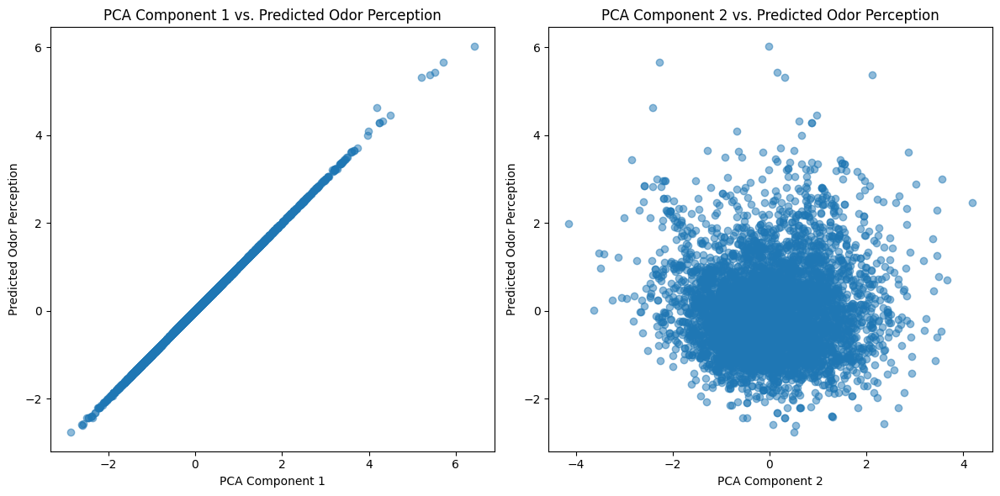

In [179]:
import matplotlib.pyplot as plt

# Plot the predicted odor perception vs. PCA component
plt.figure(figsize=(12, 6))

# Scatter plot of PCA components vs. predicted odor perception
plt.subplot(1, 2, 1)
plt.scatter(df_pca['PCA1'], df['predicted_odor_perception'], alpha=0.5)
plt.xlabel('PCA Component 1')
plt.ylabel('Predicted Odor Perception')
plt.title('PCA Component 1 vs. Predicted Odor Perception')

plt.subplot(1, 2, 2)
plt.scatter(df_pca['PCA2'], df['predicted_odor_perception'], alpha=0.5)
plt.xlabel('PCA Component 2')
plt.ylabel('Predicted Odor Perception')
plt.title('PCA Component 2 vs. Predicted Odor Perception')

plt.tight_layout()
plt.show()


### Create intensity df with new coordinates

In [ ]:
'''
combined_allpredictions'''

odour_pca_coords = list(df['odor_perception_coords'])

###Create for 3D

def generate_points_intensities_odour_component(label_name):
    intensities = []
    valid_embedding_points = []
    valid_embedding_points_3d = []

    for idx, ls in enumerate(combined_alllabels):
        try:
            if label_name in ls:
                intensity = combined_allpredictions[idx][TASKS.index(label_name)]
                intensities.append(intensity)
                valid_embedding_points.append(odour_pca_coords[idx][:2])
                valid_embedding_points_3d.append(odour_pca_coords[idx][:3])
        except:
            pass
            print(traceback.format_exc())
    
    
    return np.asarray(valid_embedding_points), np.asarray(valid_embedding_points_3d), intensities


points2d, points3d, intensities = generate_points_intensities_odour_component('woody')

    

In [ ]:
data = []
dframe = []
for l in topk_labels:
    points2d, points3d, intensities = generate_points_intensities_odour_component(l)
    for idx, p in enumerate(points3d):
        dframedict = {'label': l}
        dframedict['x'] = p[0]
        dframedict['y'] = p[1]
        dframedict['z'] = p[2]
        dframedict['intensity'] = intensities[idx]
        dframe.append(dframedict)

odour_intensity_topk = pd.DataFrame(dframe)

odour_intensity_topk.to_csv(r'odour_intensity_topk_3d_all.csv', index=False)

In [ ]:
odour_intensity_topk = pd.read_csv(r'odour_intensity_topk_3d_all.csv', index_col= False)

intensity_epicenters_odours = calculate_intensity_epicenters_weighted(odour_intensity_topk)
intensity_epicenters_odours.to_csv(r'intensity_epicenters_weighted_odours.csv', index=False)


In [ ]:
intensity_epicenters_odours.head()

,label,x,y,z
0,sweet,0.000153,0.000117,0.000136
1,fruity,0.000098,0.000075,0.000087
2,green,0.000111,0.000085,0.000099
3,floral,0.000145,0.000111,0.000130
4,waxy,0.000039,0.000030,0.000035


In [ ]:
import plotly.graph_objects as go
import pandas as pd
import plotly.express as px

# Assuming your dataframe is named df and has columns 'label', 'x', 'y', 'z'
df = intensity_epicenters_odours

# Generate unique colors for each label
unique_labels = df['label'].unique()
color_map = {label: px.colors.qualitative.Plotly[i % len(px.colors.qualitative.Plotly)] for i, label in enumerate(unique_labels)}

# Assign colors based on labels
df['color'] = df['label'].map(color_map)

# Create the 3D scatter plot
fig = go.Figure()

for label in unique_labels:
    label_data = df[df['label'] == label]
    fig.add_trace(go.Scatter3d(
        x=label_data['x'],
        y=label_data['y'],
        z=label_data['z'],
        mode='markers',
        marker=dict(
            size=10,  # Adjust size for better visibility
            color=label_data['color'],
        ),
        name=label
    ))

# Set layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='X Axis',
        yaxis_title='Y Axis',
        zaxis_title='Z Axis',
    ),
    legend_title='Labels',
    title='3D Scatter Plot of Points with Unique Labels',
    template='plotly_white'
)

fig.show()


### Datapoint heatmap for n labels with intensity

In [ ]:
labels_to_plot = {'orange', 'citrus', 'waxy'}

# Load the data
file_path = 'intensity_topk_3d_all.csv'
data = pd.read_csv(file_path)

# Create sub-DataFrame
df = data[data['label'].isin(list(labels_to_plot))]


In [ ]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Sample data creation for the sake of example (comment this out if df is already loaded)
# df = pd.DataFrame({
#     'x': np.random.rand(100),
#     'y': np.random.rand(100),
#     'z': np.random.rand(100),
#     'intensity': np.random.rand(100),
#     'label': np.random.choice(['label1', 'label2', 'label3'], 100)
# })

# Unique labels in the dataframe
unique_labels = df['label'].unique()

# Generate a distinct color for each label using a colormap
cmap = plt.get_cmap('tab20')  # Using 'tab20' colormap for distinct colors
colors = [mcolors.to_hex(cmap(i / len(unique_labels))) for i in range(len(unique_labels))]

# Create the 3D plot
fig = go.Figure()

for i, label in enumerate(unique_labels):
    label_df = df[df['label'] == label]
    rgba_colors = [
        f"rgba{mcolors.to_rgba(colors[i])[:3] + (opacity,)}"
        for opacity in label_df['intensity']
    ]
    fig.add_trace(go.Scatter3d(
        x=label_df['x'],
        y=label_df['y'],
        z=label_df['z'],
        mode='markers',
        marker=dict(
            size=5,
            color=rgba_colors,
            opacity=1,  # Overall opacity (not used for individual point transparency)
        ),
        name=label
    ))

# Update layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
    ),
    title='3D Plot with Stronger Intensity-Based Transparency and Unique Colors per Label'
)

fig.show()

### Select labels - index based

In [ ]:
import re

def convert_string_to_dict(string):
    # Use regular expression to separate alphabetic and numeric parts
    match = re.match(r'([a-zA-Z]+)(\d+)', string)
    if match:
        # Extract alphabetic and numeric parts
        key = match.group(1)
        value = int(match.group(2))
        return {key: value}
    else:
        print("String format is not valid.")
        return None

: 

String format is not valid.


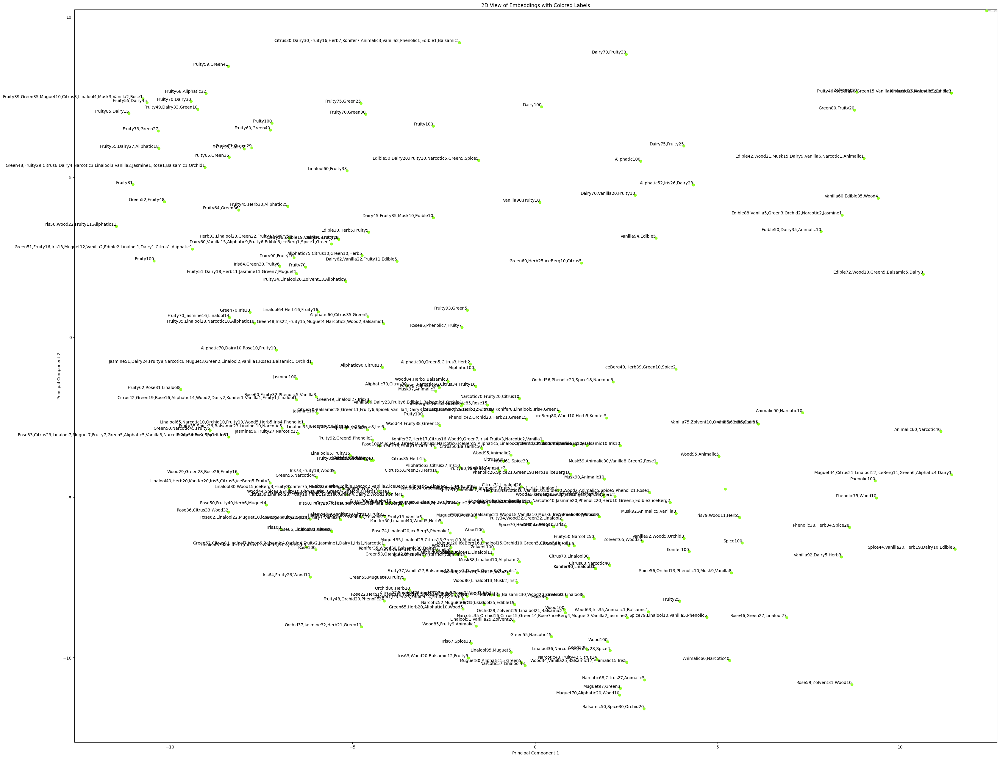

: 

In [ ]:
odour_column_names = list(perfurmershub2labels_updated.keys())

c_index_map = colour_indices_map(combined_alllabels, flavour_bracket=list(range(len(custom_input_csv))))

# Increase figure size
plt.figure(figsize=(40, 32))

intensity_regression_dataset = []

for cval, val in c_index_map.items():
    indices = val['indices']
    # intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    intersection_indices = indices
    exact_odor_list = val['exact_odors']
    intersection_eodor = []
    intersection_eodor2 = []
    for idc in intersection_indices:
      idx = indices.index(idc)
      intersection_eodor.extend(exact_odor_list[idx])
      intersection_eodor2.append(','.join(exact_odor_list[idx]))
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 1], label=f'Label {label}', c=clist, cmap='viridis')
      for idx, i_label in enumerate(compound_names):
        rowdict = {}
        for o in odour_column_names:
          rowdict[o] = 0
        odour_intensities = i_label.split(',')
        valdict = {}
        for val in odour_intensities:
          dictval = convert_string_to_dict(val)
          if dictval is not None:
            valdict.update(dictval)
          else:
            valdict = {}
            break

        for k,v in valdict.items():
          rowdict[k] = v

        for val in list(range(number_of_components)):
          var = chr(val+97)
          rowdict[var] = pca_result[intersection_indices, val][idx]

        # rowdict['x'] = pca_result[intersection_indices, 0][idx]
        # rowdict['y'] = pca_result[intersection_indices, 1][idx]
        # rowdict['z'] = pca_result[intersection_indices, 2][idx]
        if valdict:
          intensity_regression_dataset.append(rowdict)
        plt.text(pca_result[intersection_indices, 0][idx], pca_result[intersection_indices, 1][idx], i_label, ha='right', va='bottom')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(fontsize = 2)
plt.savefig("intensity_with_combined_graph_3d.png", format="png") #, dpi=resolution_value)
plt.show()

In [ ]:
intensity_regression_dataset = pd.DataFrame(intensity_regression_dataset)

: 

In [ ]:
list(intensity_regression_dataset.columns)

['Wood',
 'Green',
 'Linalool',
 'Fruity',
 'Zolvent',
 'Herb',
 'Spice',
 'Citrus',
 'Balsamic',
 'Narcotic',
 'Vanilla',
 'Rose',
 'Orchid',
 'Animalic',
 'Phenolic',
 'Iris',
 'Musk',
 'Dairy',
 'Muguet',
 'iceBerg',
 'Edible',
 'Aliphatic',
 'Jasmine',
 'Konifer',
 'a',
 'b',
 'c',
 'd',
 'e',
 'f',
 'g',
 'h',
 'i',
 'j',
 'k',
 'l',
 'm',
 'n',
 'o']

: 

In [ ]:
intensity_regression_dataset[intensity_regression_dataset['Phenolic']>0][['Phenolic', 'x', 'y', 'z']]

,Phenolic,x,y,z
23,3,-4.440232,-3.213118,6.720046
37,1,1.759630,-5.602810,-2.264299
52,1,-0.478577,-7.354447,7.482265
86,2,-3.034462,-6.830682,-0.687953
131,42,-0.226195,-2.562921,7.393013
146,24,-4.128268,-8.234746,-0.754606
149,75,9.356722,-5.019034,10.655582
154,1,-2.065191,9.193719,-0.864526
158,1,-1.266039,-5.236753,-2.938831
171,5,4.711342,-8.744467,8.145421


: 

In [ ]:
intensity_regression_dataset[intensity_regression_dataset['Phenolic']>0][['Phenolic', 'a', 'b', 'c']]

,Phenolic,a,b,c
23,3,-4.440231,-3.213132,6.719874
37,1,1.759627,-5.602788,-2.263915
52,1,-0.478574,-7.354386,7.483439
86,2,-3.034461,-6.830660,-0.687645
131,42,-0.226196,-2.562930,7.392891
146,24,-4.128270,-8.234734,-0.754474
149,75,9.356721,-5.019015,10.655875
154,1,-2.065188,9.193716,-0.864493
158,1,-1.266041,-5.236724,-2.938127
171,5,4.711346,-8.744463,8.145457


: 

In [ ]:
intensity_regression_dataset.to_csv(r'openpom/data/intensity_dataset_15d.csv', index= False)

: 

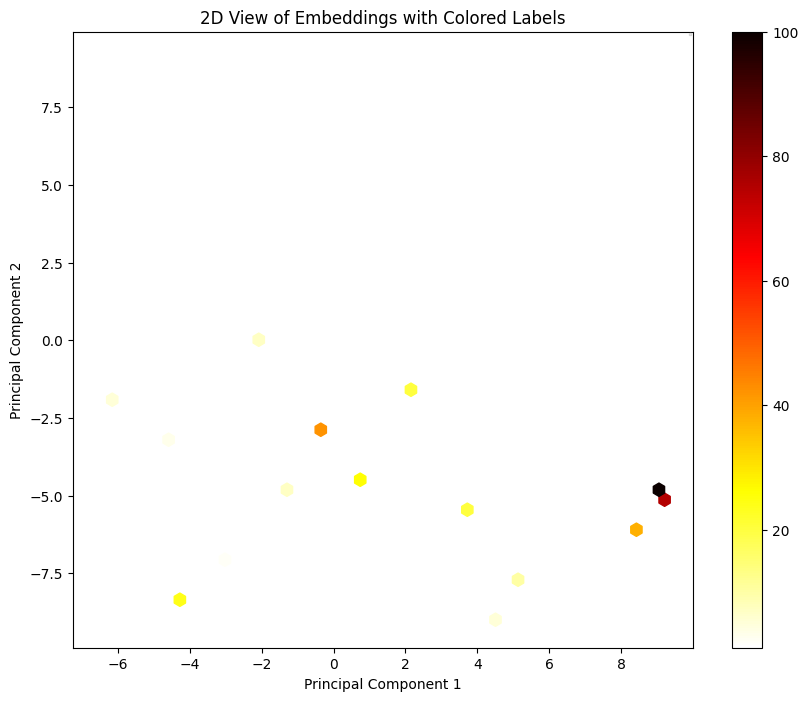

: 

In [ ]:
c_index_map = colour_indices_map(combined_alllabels, flavour_bracket=list(range(len(oj_dataset))))

# Increase figure size
plt.figure(figsize=(10, 8))

for cval, val in c_index_map.items():
    indices = val['indices']
    # intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    intersection_indices = indices
    exact_odor_list = val['exact_odors']
    intersection_eodor = []
    intersection_eodor2 = []
    for idc in intersection_indices:
      idx = indices.index(idc)
      intersection_eodor.extend(exact_odor_list[idx])
      intersection_eodor2.append(','.join(exact_odor_list[idx]))
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      intensity_values = []
      for idx, i_label in enumerate(compound_names):
        fruity_intensity = i_label[i_label.index('Phenolic')+len('Phenolic'):].split(',')[0]
        intensity_values.append(int(fruity_intensity))
        # plt.text(pca_result[intersection_indices, 0][idx], pca_result[intersection_indices, 1][idx], i_label, ha='right', va='bottom')
      # plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 1], label=f'Label {label}', c=intensity_values, cmap='hot')
      plt.hexbin(pca_result[intersection_indices, 0], pca_result[intersection_indices, 1], C=intensity_values, gridsize=50, cmap='hot_r', reduce_C_function=np.mean)
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.colorbar()
plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(fontsize = 2)
plt.savefig("phenolic_heatmap.png", format="png") #, dpi=resolution_value)
plt.show()

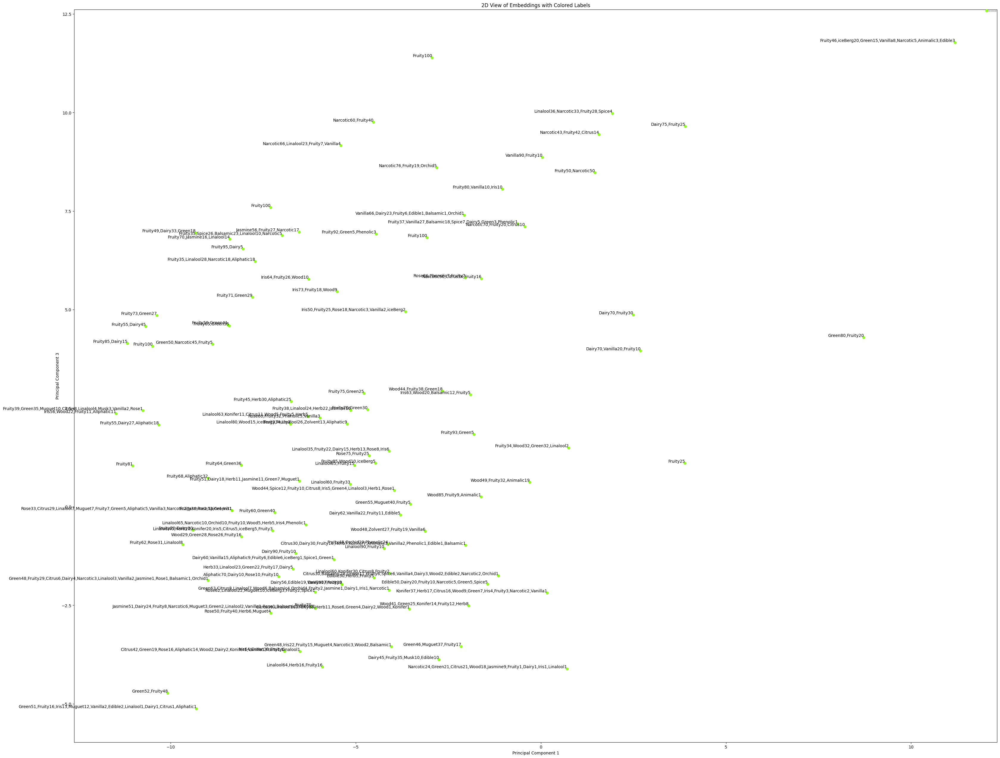

: 

In [ ]:
c_index_map = colour_indices_map(combined_alllabels, flavour_bracket=list(range(len(oj_dataset))))

# Increase figure size
plt.figure(figsize=(40, 32))

for cval, val in c_index_map.items():
    indices = val['indices']
    # intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    intersection_indices = indices
    exact_odor_list = val['exact_odors']
    intersection_eodor = []
    intersection_eodor2 = []
    for idc in intersection_indices:
      idx = indices.index(idc)
      intersection_eodor.extend(exact_odor_list[idx])
      intersection_eodor2.append(','.join(exact_odor_list[idx]))
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
      for idx, i_label in enumerate(compound_names):
        plt.text(pca_result[intersection_indices, 0][idx], pca_result[intersection_indices, 2][idx], i_label, ha='right', va='bottom')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 2)
plt.savefig("odour_intensity_plot2.png", format="png") #, dpi=resolution_value)
plt.show()

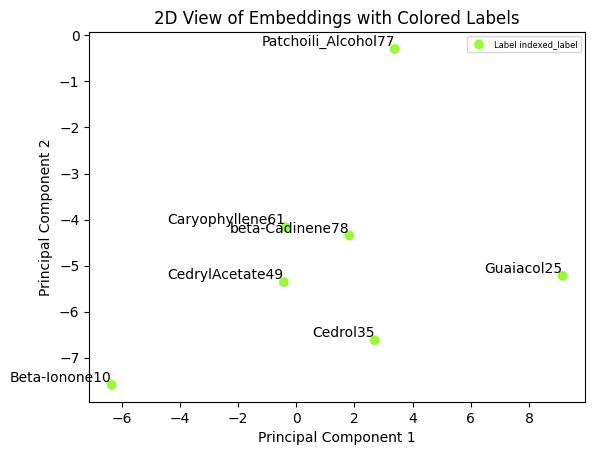

: 

In [ ]:
c_index_map = colour_indices_map(combined_alllabels, flavour_bracket=[0,1,2,3,4,5,6])
for cval, val in c_index_map.items():
    indices = val['indices']
    # intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    intersection_indices = indices
    exact_odor_list = val['exact_odors']
    intersection_eodor = []
    intersection_eodor2 = []
    for idc in intersection_indices:
      idx = indices.index(idc)
      intersection_eodor.extend(exact_odor_list[idx])
      intersection_eodor2.append(','.join(exact_odor_list[idx]))
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 1], label=f'Label {label}', c=clist, cmap='viridis')
      for idx, i_label in enumerate(compound_names):
        lval = i_label.split(';')[0]
        plt.text(pca_result[intersection_indices, 0][idx], pca_result[intersection_indices, 1][idx], lval, ha='right', va='bottom')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(fontsize = 6)
plt.show()

In [ ]:
%ls

all_labels.json   examples/  odour_intensity_plot.png  README.md         setup.py
ensemble_models/  LICENSE    openpom/                  requirements.txt  splits/


: 

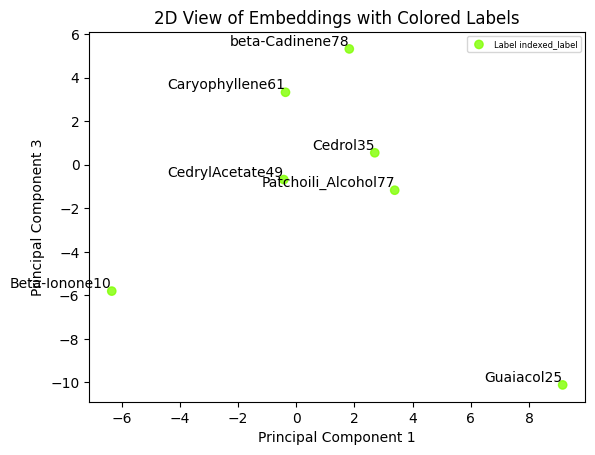

: 

In [ ]:
c_index_map = colour_indices_map(combined_alllabels, flavour_bracket=[0,1,2,3,4,5,6])
for cval, val in c_index_map.items():
    indices = val['indices']
    # intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    intersection_indices = indices
    exact_odor_list = val['exact_odors']
    intersection_eodor = []
    intersection_eodor2 = []
    for idc in intersection_indices:
      idx = indices.index(idc)
      intersection_eodor.extend(exact_odor_list[idx])
      intersection_eodor2.append(','.join(exact_odor_list[idx]))
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
      for idx, i_label in enumerate(compound_details_woody):
        lval = i_label.split(';')[0]
        plt.text(pca_result[intersection_indices, 0][idx], pca_result[intersection_indices, 2][idx], lval, ha='right', va='bottom')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

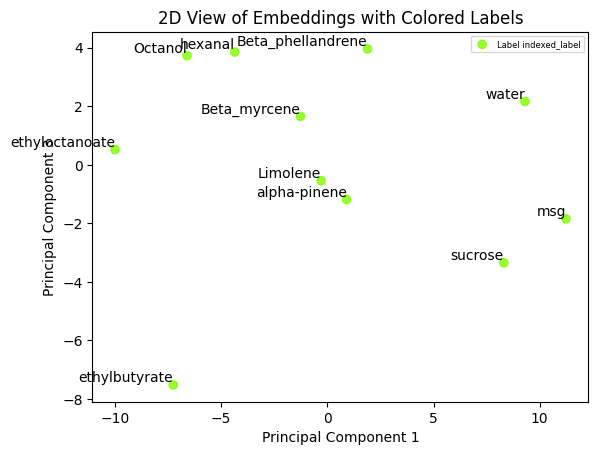

: 

In [ ]:
c_index_map = colour_indices_map(combined_alllabels, flavour_bracket=[0,1,2,3,4,5,6,7,8,9,10])
for cval, val in c_index_map.items():
    indices = val['indices']
    # intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    intersection_indices = indices
    exact_odor_list = val['exact_odors']
    intersection_eodor = []
    intersection_eodor2 = []
    for idc in intersection_indices:
      idx = indices.index(idc)
      intersection_eodor.extend(exact_odor_list[idx])
      intersection_eodor2.append(','.join(exact_odor_list[idx]))
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
      for idx, i_label in enumerate(compound_names):
        plt.text(pca_result[intersection_indices, 0][idx], pca_result[intersection_indices, 2][idx], i_label, ha='right', va='bottom')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

### Regression dataset - intensity data against nDim embedding coordinates

In [ ]:
import pandas as pd
import os
import json

: 

In [ ]:
intensity_regression_dataset = pd.read_csv(r'openpom/data/'+'intensity_dataset_v4_z.csv', index_col= False)
intensity_regression_dataset = pd.read_csv(r'openpom/data/'+'intensity_dataset_15d.csv', index_col= False)

: 

In [ ]:
odours = list(intensity_regression_dataset.columns)[:24]
feature_names = list(intensity_regression_dataset.columns)[24:]

: 

: 

In [ ]:
def normalize(x, xmin, xmax):
    return (x - xmin) / (xmax - xmin)

# # Given data
# xmin = -11.465149879455566
# xmax = 11.509297370910645
# ymin = -11.599024772644043
# ymax = 9.19375228881836
# zmin = -9.130516
# zmax = 12.1995945
normalized_feat_dims = {}
for feat in feature_names:
  feat_values = list(intensity_regression_dataset[feat])
  min_val = min(feat_values)
  max_val = max(feat_values)
  normalized_feat_dims[feat] = {'min': min_val, 'max': max_val}


normalized_dataset = []
odour_counts = {}
for idx, row in intensity_regression_dataset.iterrows():
  rowdict = {}
  for k, v in dict(row).items():
    if k not in list(normalized_feat_dims.keys()):
      rowdict[k] = v/100
      if v!= 0:
        if k in odour_counts:
          odour_counts[k] += 1
        else:
          odour_counts[k] = 1
    else:
      rowdict[k] = normalize(v, normalized_feat_dims[k]['min'], normalized_feat_dims[k]['max'])
      # if k == 'x':
      #   rowdict[k] = normalize(v, xmin, xmax)
      # if k == 'y':
      #   rowdict[k] = normalize(v, ymin, ymax)
      # if k == 'z':
      #   rowdict[k] = normalize(v, zmin, zmax)
  normalized_dataset.append(rowdict)

normalized_df = pd.DataFrame(normalized_dataset)

: 

In [ ]:
odour_counts = dict(sorted(list(odour_counts.items()), key=lambda x: x[1], reverse=True))

: 

### ML Modelling of Intensity Data - Linear Regression and Random Forest

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from copy import deepcopy
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
# Step 1: Load data
# Assuming you have loaded your dataset into a DataFrame called 'data'
# It should have columns 'x', 'y', 'a', 'b', 'c', 'd', etc.

# Step 2: Feature and target selection

data = deepcopy(intensity_regression_dataset)#(normalized_df)#(intensity_regression_dataset)
y = data[['a', 'b']]  # Features (coordinates)
X = data[list(perfurmershub2labels_updated.keys())]#['a', 'b', 'c', 'd']]  # Targets (values of variables)

# Normalize X and Y to scale the input features and targets
X = (X - np.min(X)) / (np.max(X) - np.min(X))
y = (y - np.min(Y)) / (np.max(y) - np.min(y))

# Step 3: Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 4: Model selection and training
linear_regression_model = LinearRegression()
linear_regression_model.fit(X_train, y_train)

# Step 4: Model selection and training
random_forest_model = RandomForestRegressor(n_estimators=100, random_state=42)
random_forest_model.fit(X_train, y_train)

# Step 5: Evaluation
y_pred = linear_regression_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)

print('LINEAR REGRESSION: ')
print("Mean Squared Error:", mse)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error (MSE):", mse)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error (MAE):", mae)

# Calculate R-squared (coefficient of determination)
r_squared = r2_score(y_test, y_pred)
print("R-squared (R2):", r_squared)

# Step 5: Evaluation
y_pred = random_forest_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print('RANDOM FOREST: ')
print("Mean Squared Error:", mse)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error (MSE):", mse)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error (MAE):", mae)

# Calculate R-squared (coefficient of determination)
r_squared = r2_score(y_test, y_pred)
print("R-squared (R2):", r_squared)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:86: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:86: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:86: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:86: 

LINEAR REGRESSION: 
Mean Squared Error: 0.04208438216177327
Mean Squared Error (MSE): 0.04208438216177327
Mean Absolute Error (MAE): 0.15553426020929137
R-squared (R2): 0.10771288168783855
RANDOM FOREST: 
Mean Squared Error: 0.05034698899453213
Mean Squared Error (MSE): 0.05034698899453213
Mean Absolute Error (MAE): 0.17016517653910096
R-squared (R2): -0.06883658357248729


: 

### Gradient Boosting techniques

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split

# Assuming you have already loaded your dataset into X and y

# #Flattened y
# y_flattened = y.values.flatten()
# data = deepcopy(intensity_regression_dataset)
data = deepcopy(normalized_df)#(intensity_regression_dataset)
y = data[['a', 'b']]  # Features (coordinates)
y1 = data[['a']]
y2 = data[['b']]
X = data[list(perfurmershub2labels_updated.keys())]#['a', 'b', 'c', 'd']]  # Targets (values of variables)

# Split data into train and test sets
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y1, test_size=0.2, random_state=42)
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y2, test_size=0.2, random_state=42)

# Initialize the Gradient Boosting Regressor
gb_regressor1 = GradientBoostingRegressor()

gb_regressor2 = GradientBoostingRegressor()

# Train the model
gb_regressor1.fit(X_train1, y_train1)

# Train the model
gb_regressor2.fit(X_train2, y_train2)

# Make predictions
y_pred1 = gb_regressor1.predict(X_test1)
y_pred2 = gb_regressor2.predict(X_test2)

# Evaluate the model
mse1 = mean_squared_error(y_test1, y_pred1)
mae1 = mean_absolute_error(y_test1, y_pred1)
r_squared1 = r2_score(y_test1, y_pred1)

print('For y1: ')
print("Mean Squared Error (MSE):", mse1)
print("Mean Absolute Error (MAE):", mae1)
print("R-squared (R2):", r_squared1)

# Evaluate the model
mse2 = mean_squared_error(y_test2, y_pred2)
mae2 = mean_absolute_error(y_test2, y_pred2)
r_squared2 = r2_score(y_test2, y_pred2)


print('For y2: ')
print("Mean Squared Error (MSE):", mse2)
print("Mean Absolute Error (MAE):", mae2)
print("R-squared (R2):", r_squared2)


For y1: 
Mean Squared Error (MSE): 0.0368343115959299
Mean Absolute Error (MAE): 0.12197953159848073
R-squared (R2): 0.16070006933619185
For y2: 
Mean Squared Error (MSE): 0.03101353067100247
Mean Absolute Error (MAE): 0.13088480908088573
R-squared (R2): 0.4298320941803049


: 

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import GridSearchCV



data = deepcopy(normalized_df)#(intensity_regression_dataset)
X = data[['x', 'y']]  # Features (coordinates)
# y1 = data[['x']]
# y2 = data[['y']]
y1 = data[['Phenolic']]#[list(perfurmershub2labels_updated.keys())]
y2 = data[['Rose']]

# Split data into train and test sets
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y1, test_size=0.2, random_state=42)
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y2, test_size=0.2, random_state=42)

# Define the hyperparameters
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.001, 0.01, 0.1, 0.2, 0.5, 1]
}

# Create GradientBoostingRegressor objects
gbr1 = GradientBoostingRegressor()
gbr2 = GradientBoostingRegressor()

# Create grid search objects
gbr1_gscv = GridSearchCV(gbr1, param_grid, cv=8)
gbr2_gscv = GridSearchCV(gbr2, param_grid, cv=8)

# Fit models
gbr1_gscv.fit(X_train1, y_train1)
gbr2_gscv.fit(X_train2, y_train2)

# Print best parameters
print("Best parameters for gbr1: ", gbr1_gscv.best_params_)
print("Best parameters for gbr2: ", gbr2_gscv.best_params_)
# Predict
y_pred1 = gbr1_gscv.predict(X_test1)
y_pred2 = gbr2_gscv.predict(X_test2)

# Test metrics
mse1 = mean_squared_error(y_test1, y_pred1)
mae1 = mean_absolute_error(y_test1, y_pred1)
mse2 = mean_squared_error(y_test2, y_pred2)
mae2 = mean_absolute_error(y_test2, y_pred2)

print("MSE for first target: ", mse1)
print("MAE for first target: ", mae1)
print("MSE for second target: ", mse2)
print("MAE for first target: ", mae2)

Best parameters for gbr1:  {'learning_rate': 0.001, 'n_estimators': 100}
Best parameters for gbr2:  {'learning_rate': 0.001, 'n_estimators': 100}
MSE for first target:  0.0003814699053798482
MAE for first target:  0.018743332977904772
MSE for second target:  0.027128409862257865
MAE for first target:  0.07977509088859722


: 

In [ ]:
from sklearn.ensemble import VotingRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor

estimators = []
model1 = GradientBoostingRegressor(learning_rate=0.01, n_estimators=200)
estimators.append(('gbr', model1))
model2 = SVR()
estimators.append(('svr', model2))
model3 = DecisionTreeRegressor()
estimators.append(('dtr', model3))

ensemble = VotingRegressor(estimators)
ensemble.fit(X_train2, y_train2)

y_pred1 = ensemble.predict(X_test2)
mse = mean_squared_error(y_test2, y_pred2)
print("MSE for first target: ", mse)

MSE for first target:  0.04524276543153088


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_voting.py:597: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


: 

In [ ]:
from sklearn.datasets import make_regression
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

data = deepcopy(normalized_df)#(intensity_regression_dataset)
X = data[['x', 'y']]  # Features (coordinates)
# y1 = data[['x']]
# y2 = data[['y']]
y = data[['Phenolic']]#[list(perfurmershub2labels_updated.keys())]

# Assuming X and y are your input and target variables respectively
# In this case, we generate a random regression problem
# X, y = make_regression(n_samples=1000, n_features=2, n_informative=2, n_targets=24, random_state=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = MultiOutputRegressor(RandomForestRegressor(random_state=0))

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred, multioutput='raw_values')
print(f"Mean Squared Error for each output: {mse}")

Mean Squared Error for each output: [0.04637308 0.05066395]


: 

### StackRegressor Model

In [ ]:
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor

# data = deepcopy(normalized_df)#(intensity_regression_dataset)
# y = data[['x', 'y']]  # Features (coordinates)
# y1 = data[['x']]
# y2 = data[['y']]
# X = data[list(perfurmershub2labels_updated.keys())]#['a', 'b', 'c', 'd']]  # Targets (values of variables)


data = deepcopy(normalized_df)#(intensity_regression_dataset)
X = data[['a', 'b']]  # Features (coordinates)
# y1 = data[['x']]
# y2 = data[['y']]
y1 = data[['Phenolic']]#[list(perfurmershub2labels_updated.keys())]
y2 = data[['Rose']]

# Split data into train and test sets
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y1, test_size=0.2, random_state=42)
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y2, test_size=0.2, random_state=42)
# Set up the models to be used in the stack, adjust parameters as needed
level0 = list()
level0.append(('lasso', Lasso()))
level0.append(('gbr', GradientBoostingRegressor(learning_rate=0.01, n_estimators=200)))
level0.append(('rf', RandomForestRegressor()))

# Set up meta learner model
level1 = GradientBoostingRegressor(learning_rate=0.01, n_estimators=200)

# Define the stacking ensemble
stack_regressor_model1 = StackingRegressor(estimators=level0, final_estimator=level1)
stack_regressor_model2 = StackingRegressor(estimators=level0, final_estimator=level1)

# Fit the model on all available data
stack_regressor_model1.fit(X_train1, y_train1)

# Fit the model on all available data
stack_regressor_model2.fit(X_train2, y_train2)

# Predict for training set
train_pred1 = stack_regressor_model1.predict(X_train1)

train_pred2 = stack_regressor_model2.predict(X_train2)

# Predict for one example
y_pred1 = stack_regressor_model1.predict(X_test1)

y_pred2 = stack_regressor_model2.predict(X_test2)

# Compute performance metrics for training set
mse_train = mean_squared_error(y_train1, train_pred1)
mae_train = mean_absolute_error(y_train2, train_pred2)
r2_train = r2_score(y_train1, train_pred1)

# Compute performance metrics for test set
mse_test1 = mean_squared_error(y_test1, y_pred1)
mae_test1 = mean_absolute_error(y_test1, y_pred1)

mse_test2 = mean_squared_error(y_test2, y_pred2)
mae_test2 = mean_absolute_error(y_test2, y_pred2)


r2_test = r2_score(y_test1, y_pred1)
r2_test2 = r2_score(y_test2, y_pred2)

print("Train set metrics:")
print(" - MSE: ", mse_train)
print(" - R2 Score: ", r2_train)

print("\nTest set metrics:")
print(" - MSE1 : ", mse_test1)
print("- MAE1: ", mae_test1)
print(" - R2 Score: ", r2_test)
print("\n")
print(" - MSE2 : ", mse_test2)
print("- MAE2: ", mae_test2)
print(" - R2 Score: ", r2_test2)

Train set metrics:
 - MSE:  0.004979516815017257
 - R2 Score:  -0.057836584916884703

Test set metrics:
 - MSE1 :  0.019942539441408322
- MAE1:  0.036324021196017325
 - R2 Score:  0.026898276112544695


 - MSE2 :  0.03580382123857777
- MAE2:  0.09486484801109032
 - R2 Score:  -0.11244758988956671


: 

### Residual plots

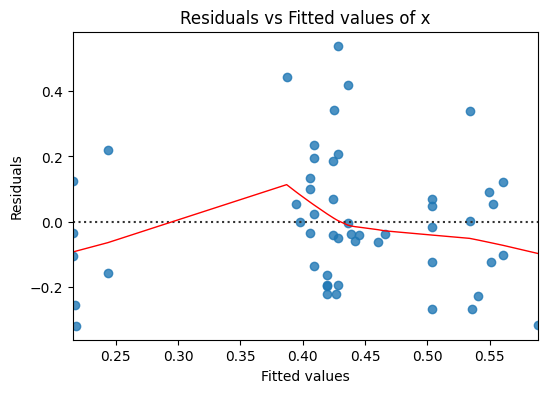

: 

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# # Fit the model
# model = create_model()
# model.fit(X_train, Y_train, epochs=100, verbose=0)

# # Make predictions
# Y_pred = model.predict(X_test)
y_pred1 = pd.DataFrame(stack_regressor_model1.predict(X_test1), columns=y1.columns, index=y_test1.index)

for col in y_test1.columns:
    residuals = y_test1[col] - y_pred1[col]
    plt.figure(figsize=(6,4))
    sns.residplot(x=y_pred1[col], y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1, 'alpha': 1})
    plt.title('Residuals vs Fitted values of ' + col)
    plt.xlabel('Fitted values')
    plt.ylabel('Residuals')
    plt.show()

# # Plot the residuals
# plt.figure(figsize=(10,6))
# sns.residplot(x='Fitted', y='Residuals', data=df_resid, lowess=True, line_kws={'color': 'red', 'lw': 1, 'alpha': 1})
# plt.title('Residuals vs Fitted values')
# plt.show()

### Regression using NNs - keras_model1

In [ ]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense
from copy import deepcopy
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Assuming y_true contains true labels and y_pred contains predicted labels
# y_true and y_pred should be numpy arrays or lists



# Assuming that X is the input (2D graph points) and Y is the target (intensity of 24 odours)

data = deepcopy(normalized_df)#(intensity_regression_dataset)
X = data[['a', 'b']]  # Features (coordinates)
Y = data[list(perfurmershub2labels_updated.keys())]#[['Wood', 'Green', 'Citrus', 'Fruity']]##[['Fruity']] #[list(perfurmershub2labels_updated.keys())]

print(len(list(perfurmershub2labels_updated.keys())))
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)  # 80% training and 20% test

# # Now we train the model with X_train and Y_train
# model.fit(X_train, Y_train, epochs=150, batch_size=10, verbose=0)


# Create sequential model
keras_model1 = Sequential()

# Add input layer
keras_model1.add(Dense(32, input_dim=2, kernel_initializer='normal', activation='relu'))

# Add hidden layer
keras_model1.add(Dense(16, activation='relu'))

# Add output layer
keras_model1.add(Dense(24, activation='linear'))

# Compile the model
keras_model1.compile(loss='mse', optimizer='adam', metrics=['mse','mae'])

# Fit the model
keras_model1.fit(X_train, Y_train, epochs=150, batch_size=10, verbose=0)

# And evaluate with X_test and Y_test
scores = keras_model1.evaluate(X_test, Y_test)

print("\n%s: %.2f%%" % (keras_model1.metrics_names[1], scores[1]*100)) # Prints MSE
print("\n%s: %.2f%%" % (keras_model1.metrics_names[2], scores[2]*100)) # Prints MAE

# Predict intensities for new graph points
# new_points = np.array([[2.3, 4.5], [5.2, 6.7]])  # substitute this with your new points
# predicted_intensities = model.predict(new_points)

24
2/2 [==============================] - 1s 21ms/step - loss: 0.0196 - mse: 0.0196 - mae: 0.0622

mse: 1.96%

mae: 6.22%


: 

In [ ]:

# Calculate precision and recall for each class

Y_pred = keras_model1.predict(X_test)
# precision = precision_score(Y_test, Y_pred, average=None)
# recall = recall_score(Y_test, Y_pred, average=None)


# Calculate mean absolute error (MAE) and mean squared error (MSE) for each output
mae = mean_absolute_error(Y_test, Y_pred, multioutput='raw_values')
mse = mean_squared_error(Y_test, Y_pred, multioutput='raw_values')

# Print MAE and MSE for each output
mse_mae = {}
for i in range(len(mae)):
  mse_mae[list(perfurmershub2labels_updated.keys())[i]] = {'mse': mse[i], 'mae': mae[i]}
    # print(f'Output {list(perfurmershub2labels_updated.keys())[i]}: MAE = {mae[i]}, MSE = {mse[i]}')

2/2 [==============================] - 0s 17ms/step


: 

In [ ]:
sorted_by_mse = dict(sorted(list(mse_mae.items()), key=lambda x: x[1]['mse']))
sorted_by_mae = dict(sorted(list(mse_mae.items()), key=lambda x: x[1]['mae']))

: 

### Regression using NNs - keras_model2

In [ ]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense
from copy import deepcopy
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Assuming y_true contains true labels and y_pred contains predicted labels
# y_true and y_pred should be numpy arrays or lists



# Assuming that X is the input (2D graph points) and Y is the target (intensity of 24 odours)

data = deepcopy(normalized_df)#(intensity_regression_dataset)
X = data[['a', 'b', 'c']]  # Features (coordinates)
Y = data[list(perfurmershub2labels_updated.keys())]#[['Wood', 'Green', 'Citrus', 'Fruity']]##[['Fruity']] #[list(perfurmershub2labels_updated.keys())]

print(len(list(perfurmershub2labels_updated.keys())))
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)  # 80% training and 20% test

# # Now we train the model with X_train and Y_train
# model.fit(X_train, Y_train, epochs=150, batch_size=10, verbose=0)


# Create sequential model
keras_model2 = Sequential()

# Add input layer
keras_model2.add(Dense(32, input_dim=3, kernel_initializer='normal', activation='relu'))

# Add hidden layer
keras_model2.add(Dense(16, activation='relu'))

# Add output layer
keras_model2.add(Dense(24, activation='linear'))

# Compile the model
keras_model2.compile(loss='mse', optimizer='adam', metrics=['mse','mae'])

# Fit the model
keras_model2.fit(X_train, Y_train, epochs=150, batch_size=10, verbose=0)

# And evaluate with X_test and Y_test
scores = keras_model2.evaluate(X_test, Y_test)

print("\n%s: %.2f%%" % (keras_model2.metrics_names[1], scores[1]*100)) # Prints MSE
print("\n%s: %.2f%%" % (keras_model2.metrics_names[2], scores[2]*100)) # Prints MAE

# Predict intensities for new graph points
# new_points = np.array([[2.3, 4.5], [5.2, 6.7]])  # substitute this with your new points
# predicted_intensities = model.predict(new_points)

24
2/2 [==============================] - 0s 13ms/step - loss: 0.0196 - mse: 0.0196 - mae: 0.0656

mse: 1.96%

mae: 6.56%


: 

In [ ]:

# Calculate precision and recall for each class

Y_pred = keras_model2.predict(X_test)
# precision = precision_score(Y_test, Y_pred, average=None)
# recall = recall_score(Y_test, Y_pred, average=None)


# Calculate mean absolute error (MAE) and mean squared error (MSE) for each output
mae = mean_absolute_error(Y_test, Y_pred, multioutput='raw_values')
mse = mean_squared_error(Y_test, Y_pred, multioutput='raw_values')

# Print MAE and MSE for each output
mse_mae = {}
for i in range(len(mae)):
  mse_mae[list(perfurmershub2labels_updated.keys())[i]] = {'mse': mse[i], 'mae': mae[i]}
    # print(f'Output {list(perfurmershub2labels_updated.keys())[i]}: MAE = {mae[i]}, MSE = {mse[i]}')

2/2 [==============================] - 0s 12ms/step


: 

In [ ]:
sorted_by_mse = dict(sorted(list(mse_mae.items()), key=lambda x: x[1]['mse']))
sorted_by_mae = dict(sorted(list(mse_mae.items()), key=lambda x: x[1]['mae']))

: 

In [ ]:
sorted_by_mse

{'Phenolic': {'mse': 0.0010257460402828974, 'mae': 0.021327332543352475},
 'Animalic': {'mse': 0.0015848760796100525, 'mae': 0.02849531363337659},
 'Orchid': {'mse': 0.0017240242322368157, 'mae': 0.03424868192666998},
 'Balsamic': {'mse': 0.002670708355195543, 'mae': 0.027677865764842585},
 'Iris': {'mse': 0.003996251726869558, 'mae': 0.05450287589660057},
 'Herb': {'mse': 0.0040753522832521994, 'mae': 0.043711236117837525},
 'Aliphatic': {'mse': 0.014315975578543565, 'mae': 0.06477012489134303},
 'Konifer': {'mse': 0.015183897772957238, 'mae': 0.047669905087409106},
 'Musk': {'mse': 0.015963154067759975, 'mae': 0.06263687613778389},
 'iceBerg': {'mse': 0.017098109610266587, 'mae': 0.04330784684476944},
 'Zolvent': {'mse': 0.019137801080834713, 'mae': 0.03883019523838392},
 'Muguet': {'mse': 0.019229084557114584, 'mae': 0.06691724232756174},
 'Edible': {'mse': 0.019928187929151655, 'mae': 0.0388875049753831},
 'Jasmine': {'mse': 0.023344442526977077, 'mae': 0.04091694116592407},
 'Lina

: 

In [ ]:
sorted_by_mae

{'Phenolic': {'mse': 0.0010257460402828974, 'mae': 0.021327332543352475},
 'Balsamic': {'mse': 0.002670708355195543, 'mae': 0.027677865764842585},
 'Animalic': {'mse': 0.0015848760796100525, 'mae': 0.02849531363337659},
 'Orchid': {'mse': 0.0017240242322368157, 'mae': 0.03424868192666998},
 'Zolvent': {'mse': 0.019137801080834713, 'mae': 0.03883019523838392},
 'Edible': {'mse': 0.019928187929151655, 'mae': 0.0388875049753831},
 'Jasmine': {'mse': 0.023344442526977077, 'mae': 0.04091694116592407},
 'iceBerg': {'mse': 0.017098109610266587, 'mae': 0.04330784684476944},
 'Herb': {'mse': 0.0040753522832521994, 'mae': 0.043711236117837525},
 'Konifer': {'mse': 0.015183897772957238, 'mae': 0.047669905087409106},
 'Iris': {'mse': 0.003996251726869558, 'mae': 0.05450287589660057},
 'Musk': {'mse': 0.015963154067759975, 'mae': 0.06263687613778389},
 'Aliphatic': {'mse': 0.014315975578543565, 'mae': 0.06477012489134303},
 'Muguet': {'mse': 0.019229084557114584, 'mae': 0.06691724232756174},
 'Vani

: 

In [ ]:
odour_counts

{'Fruity': 109,
 'Green': 82,
 'Linalool': 64,
 'Wood': 63,
 'Citrus': 53,
 'Herb': 51,
 'Vanilla': 45,
 'Narcotic': 44,
 'Dairy': 41,
 'Iris': 36,
 'Rose': 35,
 'Aliphatic': 34,
 'Spice': 31,
 'Orchid': 26,
 'iceBerg': 26,
 'Animalic': 25,
 'Muguet': 25,
 'Balsamic': 24,
 'Edible': 24,
 'Phenolic': 22,
 'Konifer': 18,
 'Musk': 16,
 'Jasmine': 15,
 'Zolvent': 10}

: 

### Keras_model1 singleodour

In [ ]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense
from copy import deepcopy
from sklearn.model_selection import train_test_split


# Assuming that X is the input (2D graph points) and Y is the target (intensity of 24 odours)

data = deepcopy(normalized_df)#(intensity_regression_dataset)
X = data[['a', 'b']]  # Features (coordinates)
Y = data[['Phenolic']]#[list(perfurmershub2labels_updated.keys())]#[['Wood', 'Green', 'Citrus', 'Fruity']]##[['Fruity']] #[list(perfurmershub2labels_updated.keys())]

print(len(list(perfurmershub2labels_updated.keys())))
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)  # 80% training and 20% test

# # Now we train the model with X_train and Y_train
# model.fit(X_train, Y_train, epochs=150, batch_size=10, verbose=0)


# Create sequential model
keras_model1 = Sequential()

# Add input layer
keras_model1.add(Dense(32, input_dim=2, kernel_initializer='normal', activation='relu'))

# Add hidden layer
keras_model1.add(Dense(16, activation='relu'))

# Add output layer
keras_model1.add(Dense(1, activation='sigmoid'))

# Compile the model
keras_model1.compile(loss='mse', optimizer='adam', metrics=['mse','mae'])

# Fit the model
keras_model1.fit(X_train, Y_train, epochs=150, batch_size=10, verbose=0)

# And evaluate with X_test and Y_test
scores = keras_model1.evaluate(X_test, Y_test)

print("\n%s: %.2f%%" % (keras_model1.metrics_names[1], scores[1]*100)) # Prints MSE
print("\n%s: %.2f%%" % (keras_model1.metrics_names[2], scores[2]*100)) # Prints MAE

# Predict intensities for new graph points
# new_points = np.array([[2.3, 4.5], [5.2, 6.7]])  # substitute this with your new points
# predicted_intensities = model.predict(new_points)

24
2/2 [==============================] - 0s 16ms/step - loss: 4.9699e-04 - mse: 4.9699e-04 - mae: 0.0180

mse: 0.05%

mae: 1.80%


: 

2/2 [==============================] - 0s 7ms/step


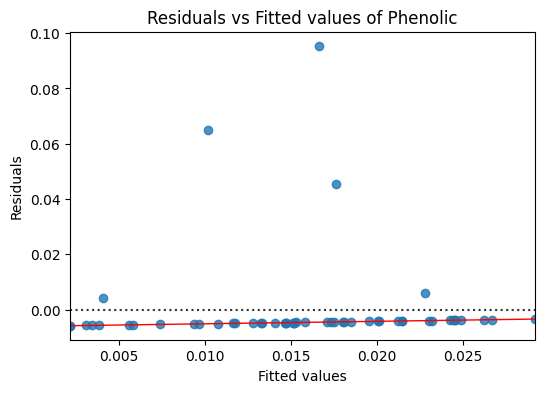

: 

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# # Fit the model
# model = create_model()
# model.fit(X_train, Y_train, epochs=100, verbose=0)

# # Make predictions
# Y_pred = model.predict(X_test)
Y_pred = pd.DataFrame(keras_model1.predict(X_test), columns=Y.columns, index=Y_test.index)

for col in Y_test.columns:
    residuals = Y_test[col] - Y_pred[col]
    plt.figure(figsize=(6,4))
    sns.residplot(x=Y_pred[col], y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1, 'alpha': 1})
    plt.title('Residuals vs Fitted values of ' + col)
    plt.xlabel('Fitted values')
    plt.ylabel('Residuals')
    plt.show()

# # Plot the residuals
# plt.figure(figsize=(10,6))
# sns.residplot(x='Fitted', y='Residuals', data=df_resid, lowess=True, line_kws={'color': 'red', 'lw': 1, 'alpha': 1})
# plt.title('Residuals vs Fitted values')
# plt.show()

###Regression using NNs - Others

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam
from copy import deepcopy

# Assume that your data is in a CSV file and the first 24 columns
# are the input variables and the last 2 columns are the output variables.
# df = pd.read_csv('your_data_file.csv')

# # Split the data into input (X) and output (Y)
# X = df.iloc[:, :24]
# Y = df.iloc[:, 24:]

data = deepcopy(normalized_df)#(intensity_regression_dataset)
X = data[['a', 'b']]  # Features (coordinates)
y = data[['Balsamic']]#[list(perfurmershub2labels_updated.keys())]



# Split the dataset into training set and test set
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2)

# Define the model
keras_model0 = Sequential()
keras_model0.add(Dense(30, input_dim=2, activation='relu'))
# model.add(Dense(100, activation='relu'))
keras_model0.add(Dense(1, activation='linear'))  # 2 output variables

custom_adam = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, amsgrad=False)

# Compile the model
keras_model0.compile(loss='mean_squared_error', optimizer=custom_adam)

# Train the model
keras_model0.fit(X_train, Y_train, epochs=60, batch_size=10, verbose=1)

# Evaluate the model
score = keras_model0.evaluate(X_test, Y_test, verbose=1)

print('Test loss:', score)

Epoch 1/60
21/21 [==============================] - 1s 4ms/step - loss: 0.0446
Epoch 2/60
21/21 [==============================] - 0s 4ms/step - loss: 0.0078
Epoch 3/60
21/21 [==============================] - 0s 3ms/step - loss: 0.0052
Epoch 4/60
21/21 [==============================] - 0s 5ms/step - loss: 0.0043
Epoch 5/60
21/21 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 6/60
21/21 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 7/60
21/21 [==============================] - 0s 5ms/step - loss: 0.0034
Epoch 8/60
21/21 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 9/60
21/21 [==============================] - 0s 4ms/step - loss: 0.0031
Epoch 10/60
21/21 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 11/60
21/21 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 12/60
21/21 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 13/60
21/21 [==============================

: 

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2)

Y_pred = model.predict(X_test)
mse1_test = mean_squared_error(Y_test, Y_pred)
r2_test = r2_score(Y_test, Y_pred)

print(mse1_test)
print(r2_test)

2/2 [==============================] - 0s 7ms/step
0.006885375668330645
0.001284421887883913


: 

2/2 [==============================] - 0s 11ms/step


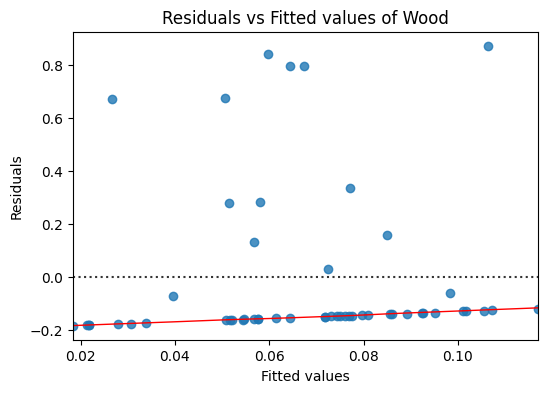

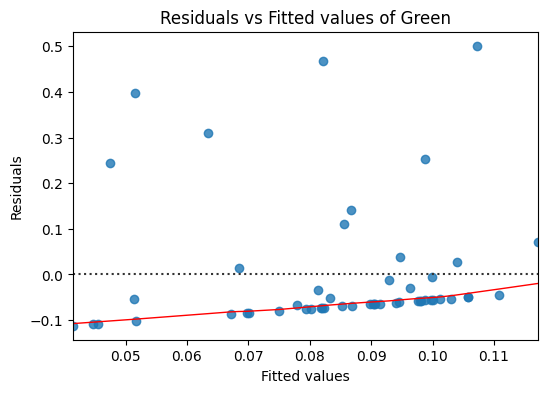

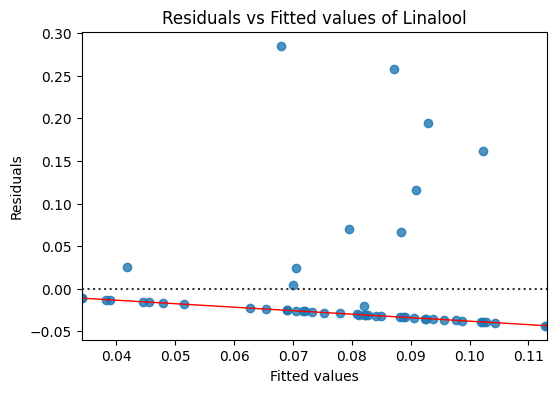

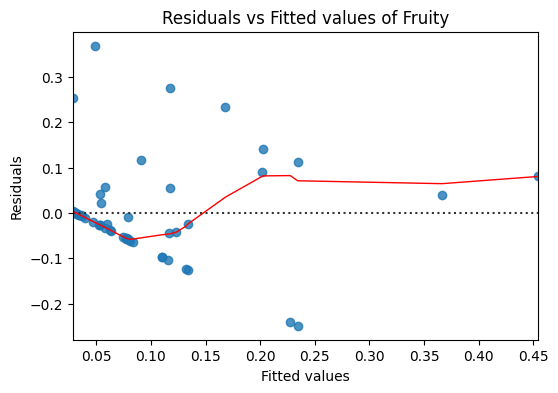

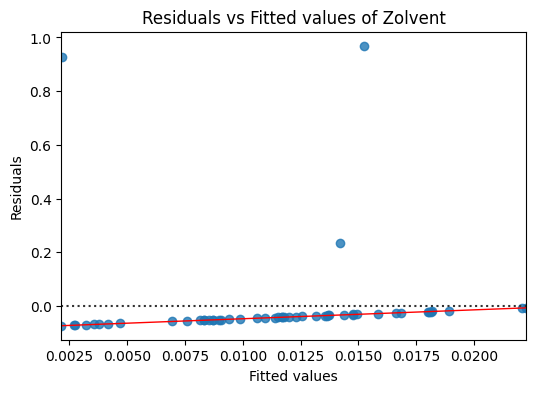

...

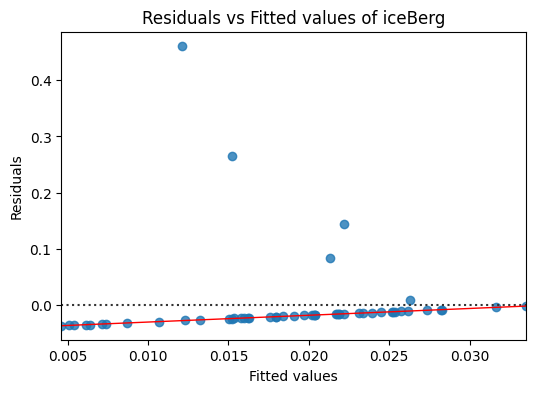

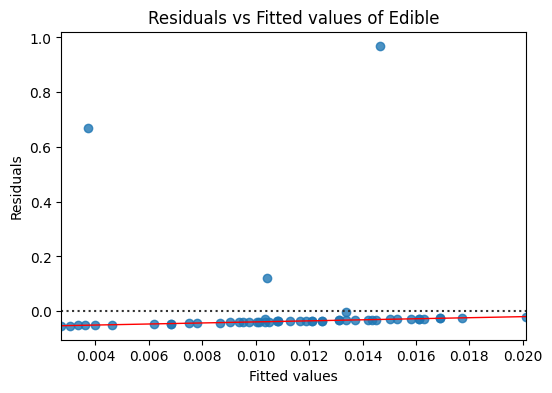

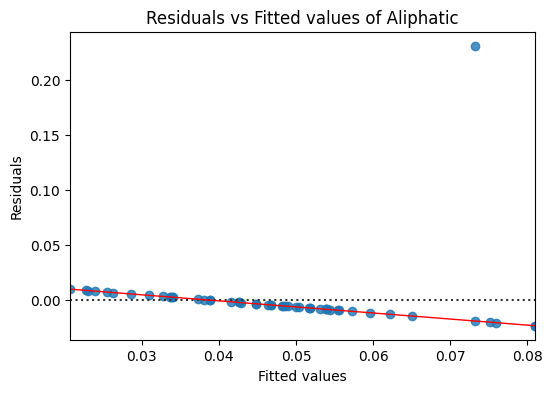

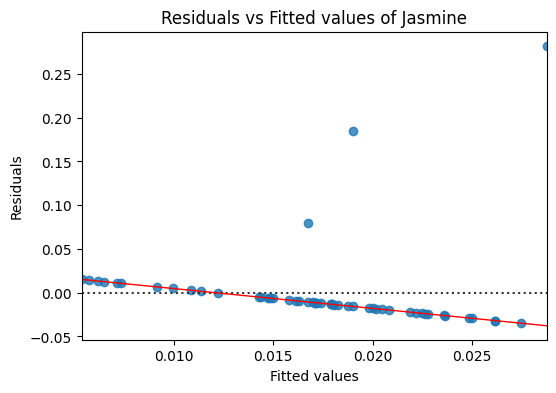

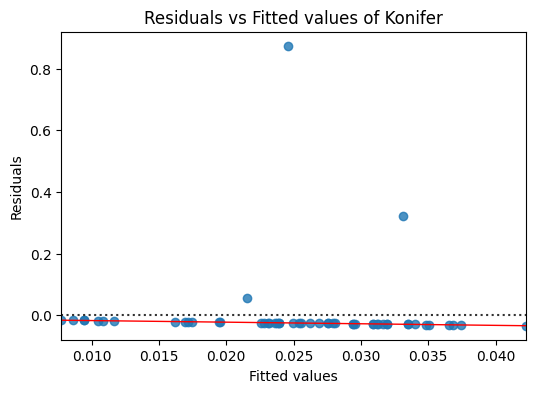

: 

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# # Fit the model
# model = create_model()
# model.fit(X_train, Y_train, epochs=100, verbose=0)

# # Make predictions
# Y_pred = model.predict(X_test)
Y_pred = pd.DataFrame(keras_model1.predict(X_test), columns=Y.columns, index=Y_test.index)

for col in Y_test.columns:
    residuals = Y_test[col] - Y_pred[col]
    plt.figure(figsize=(6,4))
    sns.residplot(x=Y_pred[col], y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1, 'alpha': 1})
    plt.title('Residuals vs Fitted values of ' + col)
    plt.xlabel('Fitted values')
    plt.ylabel('Residuals')
    plt.show()

# # Plot the residuals
# plt.figure(figsize=(10,6))
# sns.residplot(x='Fitted', y='Residuals', data=df_resid, lowess=True, line_kws={'color': 'red', 'lw': 1, 'alpha': 1})
# plt.title('Residuals vs Fitted values')
# plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
Y_pred = model.predict(X_test)
r2_test = r2_score(Y_test, Y_pred)
print(r2_test)

2/2 [==============================] - 0s 6ms/step
-0.1883554695648315


: 

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
import numpy as np

data = deepcopy(normalized_df)#(normalized_df)
X = data[['x', 'y']]  # Features (coordinates)
Y = data[list(perfurmershub2labels_updated.keys())]

# Normalize X and Y to scale the input features and targets
# X = (X - np.min(X)) / (np.max(X) - np.min(X))
# Y = (Y - np.min(Y)) / (np.max(Y) - np.min(Y))

# Assume X and Y are your data

# # Normalize X and Y to scale the input features and targets
# X = (X - np.min(X)) / (np.max(X) - np.min(X))
# Y = (Y - np.min(Y)) / (np.max(Y) - np.min(Y))

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)

# Creating the model
model = Sequential()
model.add(Dense(128, input_dim=2, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(128, activation='relu'))
# model.add(Dense(64, activation='relu'))
# model.add(Dense(32, activation='relu'))
model.add(Dense(24, activation='sigmoid'))   # Adapt for your case of 24 outputs

# Compiling the model
optimizer = Adam(learning_rate=(1e-3))
model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

# Training the model
model.fit(X_train, Y_train, epochs=200, verbose=1)

# Predicting on test data
y_pred = model.predict(X_test)

# Evaluating the model
mae = mean_absolute_error(Y_test, y_pred)
r2 = r2_score(Y_test, y_pred)
print("Mean Absolute Error (MAE): ", mae)
print("R2 Score: ", r2)

# kfold = KFold(n_splits=10)    # 10-fold cross-validation
# results = cross_val_score(wrapped_model, X, Y, cv=kfold)
# print("Model: %.2f (%.2f) MSE" % (results.mean(), results.std()))

Epoch 1/200
7/7 [==============================] - 4s 8ms/step - loss: 0.2212 - mae: 0.4632
Epoch 2/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1770 - mae: 0.4117
Epoch 3/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0969 - mae: 0.2910
Epoch 4/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0350 - mae: 0.1377
Epoch 5/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0232 - mae: 0.0635
Epoch 6/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0233 - mae: 0.0479
Epoch 7/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0234 - mae: 0.0447
Epoch 8/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0234 - mae: 0.0440
Epoch 9/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0233 - mae: 0.0439
Epoch 10/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0230 - mae: 0.0450
Epoch 11/200
7/7 [==============================] - 0s 12ms/step - loss: 0.022

: 

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.model_selection import cross_val_score, KFold
from sklearn.preprocessing import MinMaxScaler
from keras.optimizers import Adam
from keras import backend as K
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import make_scorer
from sklearn.model_selection import cross_val_score
from copy import deepcopy


data = deepcopy(normalized_df)#(intensity_regression_dataset)#(normalized_df)
X = data[['x', 'y']]  # Features (coordinates)
Y = data[list(perfurmershub2labels_updated.keys())]

# Normalize X and Y to scale the input features and targets
# X = (X - np.min(X)) / (np.max(X) - np.min(X))
# Y = (Y - np.min(Y)) / (np.max(Y) - np.min(Y))

# # Normalizing the inputs
# scaler = MinMaxScaler()
# X = scaler.fit_transform(X)

def create_model():
    model = Sequential()
    model.add(Dense(128, input_dim=2, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(24, activation='linear'))   # Adapt for your case of 24 outputs

    optimizer = Adam(learning_rate=1e-3)
    model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])
    return model

kfold = KFold(n_splits=10, shuffle=True)
mse_results = []
mae_results = []

split_no = 1

# KFold Cross Validation approach
for train_ix, val_ix in kfold.split(X, Y):
    # define model
    keras_model2 = create_model()
    # select rows for train and validation
    # print(train_ix, val_ix)
    X_train, Y_train, X_val, Y_val = X.iloc[train_ix], Y.iloc[train_ix], X.iloc[val_ix], Y.iloc[val_ix]
    # fit model
    keras_model2.fit(X_train, Y_train, epochs=100, verbose=0)
    # evaluate the model
    mse, mae = keras_model2.evaluate(X_val, Y_val, verbose=0)
    print('Split: %d, MSE=%.3f, MAE=%.3f' % (split_no, mse, mae))
    mae_results.append(mae)
    mse_results.append(mse)
    # clear session
    K.clear_session()
    split_no += 1

# summarize mae and mse for each split
print('Estimated Mean MAE: %.3f (%.3f)' % (np.mean(mae_results), np.std(mae_results)))
print('Estimated Mean MSE: %.3f (%.3f)' % (np.mean(mse_results), np.std(mse_results)))

Split: 1, MSE=0.018, MAE=0.064
Split: 2, MSE=0.021, MAE=0.066
Split: 3, MSE=0.021, MAE=0.065


Split: 4, MSE=0.020, MAE=0.065


Split: 5, MSE=0.017, MAE=0.060
Split: 6, MSE=0.019, MAE=0.062
Split: 7, MSE=0.022, MAE=0.068
Split: 8, MSE=0.022, MAE=0.069
Split: 9, MSE=0.022, MAE=0.069
Split: 10, MSE=0.023, MAE=0.067
Estimated Mean MAE: 0.065 (0.003)
Estimated Mean MSE: 0.020 (0.002)


: 

### Generate model outputs functions (predictions)


In [ ]:
def generate_data(model, num_points= 40, odour = 'Wood'):
  index_of_odour = list(perfurmershub2labels_updated.keys()).index(odour)
  inputs_to_model = []
  fraction = (1/num_points)
  intensities = []
  for i in range(num_points):
    intensity = i*fraction
    intensities.append(intensity)
    ndict = {}
    for j in range(len(list(perfurmershub2labels_updated.keys()))):
      if j != index_of_odour:
        ndict[list(perfurmershub2labels_updated.keys())[j]] = 0
      else:
        ndict[list(perfurmershub2labels_updated.keys())[j]] = intensity
    # print(ndict)
    # input_data_df = pd.DataFrame([ndict])
    inputs_to_model.append(ndict)
    # inputs_to_model.append(input_data_df)

  # outputs = []
  # for p in inputs_to_model:
  #   outputs.append(model.predict(p))
  outputs = model.predict(pd.DataFrame(inputs_to_model))

  return {'outputs': outputs, 'intensities': intensities}



def generate_data_inverse(model, num_points = 20, odour = 'Wood'):
  index_of_odour = list(perfurmershub2labels_updated.keys()).index(odour)
  print(index_of_odour)
  inputs_to_model = []
  fraction = (1/num_points)
  x = []
  y = []
  to_predict = []
  for i in range(num_points):
    for j in range(num_points):
      x_point = fraction*i
      y_point = fraction*j
      # odour_intensities = model.predict(pd.DataFrame([{'x': x_point, 'y': y_point}]))
      to_predict.append({'a': x_point, 'b': y_point})
      x.append(x_point)
      y.append(y_point)
  odour_intensities = model.predict(pd.DataFrame(to_predict))


  values = []
  for v in odour_intensities:
    v = (v - np.min(v)) / (np.max(v) - np.min(v))
    values.append(v[index_of_odour])
  return x, y, values


def generate_data_inverse_singleodour1(model, num_points = 20):
  # index_of_odour = list(perfurmershub2labels_updated.keys()).index(odour)
  inputs_to_model = []
  fraction = (1/num_points)
  x = []
  y = []
  to_predict = []
  for i in range(num_points):
    for j in range(num_points):
      x_point = fraction*i
      y_point = fraction*j
      # odour_intensities = model.predict(pd.DataFrame([{'x': x_point, 'y': y_point}]))
      to_predict.append({'a': x_point, 'b': y_point})
      x.append(x_point)
      y.append(y_point)
  odour_intensities = model.predict(pd.DataFrame(to_predict))
  values = []
  for v in odour_intensities:
    values.append(v)
  return x, y, values

def generate_data_inverse_singleodour2(model, num_points = 20):
  # index_of_odour = list(perfurmershub2labels_updated.keys()).index(odour)
  inputs_to_model = []
  fraction = (1/num_points)
  x = []
  y = []
  to_predict = []
  for i in range(num_points):
    for j in range(num_points):
      x_point = fraction*i
      y_point = fraction*j
      # odour_intensities = model.predict(pd.DataFrame([{'x': x_point, 'y': y_point}]))
      to_predict.append({'a': x_point, 'b': y_point})
      x.append(x_point)
      y.append(y_point)
  odour_intensities = model.predict(pd.DataFrame(to_predict))
  values = []
  for v in odour_intensities:
    values.append(v[0])
  return x, y, values


def generate_data_inverse_old(model, num_points = 20, odour = 'Wood'):
  index_of_odour = list(perfurmershub2labels_updated.keys()).index(odour)
  print(index_of_odour)
  inputs_to_model = []
  fraction = (1/num_points)
  x = []
  y = []
  to_predict = []
  values = []
  for i in range(num_points):
    for j in range(num_points):
      x_point = fraction*i
      y_point = fraction*j
      odour_intensities = model.predict(pd.DataFrame([{'a': x_point, 'b': y_point}]))
      values.append(odour_intensities[0][index_of_odour])
      # to_predict.append({'x': x_point, 'y': y_point})
      x.append(x_point)
      y.append(y_point)
  # odour_intensities = model.predict(pd.DataFrame(to_predict))
  # values = []
  # for v in odour_intensities:
  #   values.append(v[index_of_odour])
  return x, y, values


: 

In [ ]:
# outputs = generate_data_inverse_singleodour(model=stack_regressor_model1, num_points = 20)
# # outputs_y = generate_data(model=stack_regressor_model2, odour = 'Green', num_points = 100)

# # # outputs = generate_data(model=keras_model2, odour = 'Green', num_points = 100)

# outputs = generate_data_inverse_singleodour1(model=gbr1_gscv, num_points = 20)


: 

### Individual heatmaps

In [ ]:
final_data = []
for i in range(len(outputs_x['outputs'])):
  datapoint = {'x': outputs_x['outputs'][i][0], 'y': outputs_y['outputs'][i][0], 'intensity': outputs_x['intensities'][i]}
  final_data.append(datapoint)

final_data_keras = []
for i in range(len(outputs['outputs'])):
  datapoint = {'x': outputs['outputs'][i][0][0], 'y': outputs['outputs'][i][0][1], 'intensity': outputs['intensities'][i]}
  final_data_keras.append(datapoint)

: 

In [ ]:


# Generate sample data (replace this with your own data)
# For demonstration purposes, I'll generate random data
# num_points = 100
# x = np.random.rand(num_points)
# y = np.random.rand(num_points)
# values = np.random.rand(num_points)  # Random values between 0 and 1
x = []
y = []
values = []
for v in final_data:
  x.append(v['x'])
  y.append(v['y'])
  values.append(v['intensity'])


x_keras = []
y_keras = []
values_keras = []
for v in final_data_keras:
  x_keras.append(v['x'])
  y_keras.append(v['y'])
  values_keras.append(v['intensity'])

: 

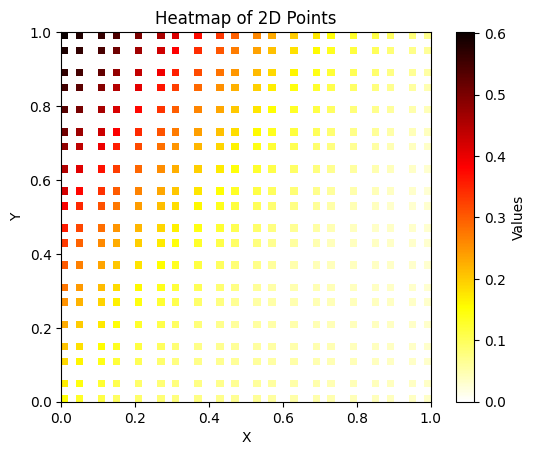

: 

In [ ]:
#FRUITY
# Create a 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=50, weights=values)


# Plot the heatmap
plt.imshow(heatmap.T, extent=[0, 1, 0, 1], origin='lower', cmap='hot_r', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Heatmap of 2D Points')
plt.show()

14
13/13 [==============================] - 0s 2ms/step


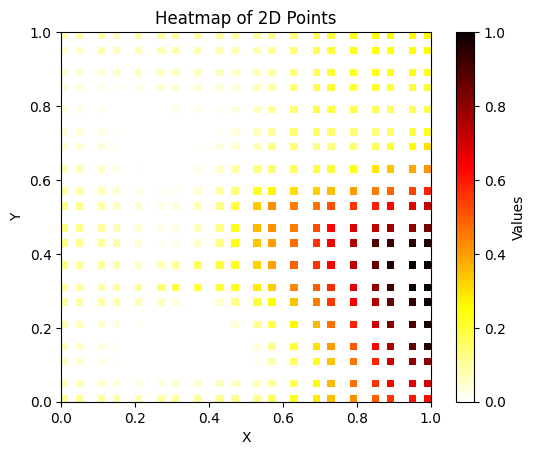

: 

In [ ]:
#Phenonlic
# Create a 2D histogram
x,y, values = generate_data_inverse(model=keras_model1, num_points= 20, odour='Phenolic')
heatmap, xedges, yedges = np.histogram2d(x, y, bins=50, weights=values)


# Plot the heatmap
plt.imshow(heatmap.T, extent=[0, 1, 0, 1], origin='lower', cmap='hot_r', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Heatmap of 2D Points')
plt.show()

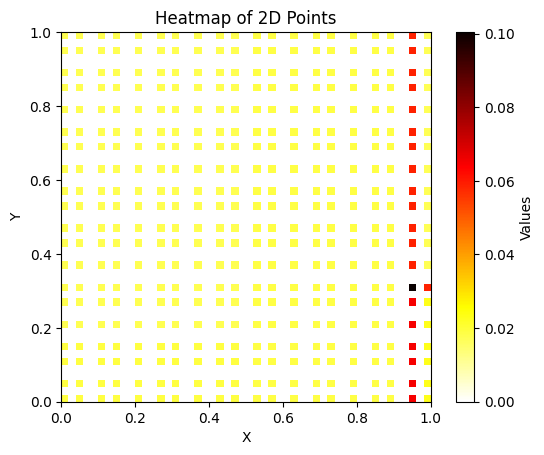

: 

In [ ]:
#Phenonlic
# Create a 2D histogram
x,y, values = generate_data_inverse_singleodour1(model=gbr1_gscv, num_points= 20)
heatmap, xedges, yedges = np.histogram2d(x, y, bins=50, weights=values)


# Plot the heatmap
plt.imshow(heatmap.T, extent=[0, 1, 0, 1], origin='lower', cmap='hot_r', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Heatmap of 2D Points')
plt.show()

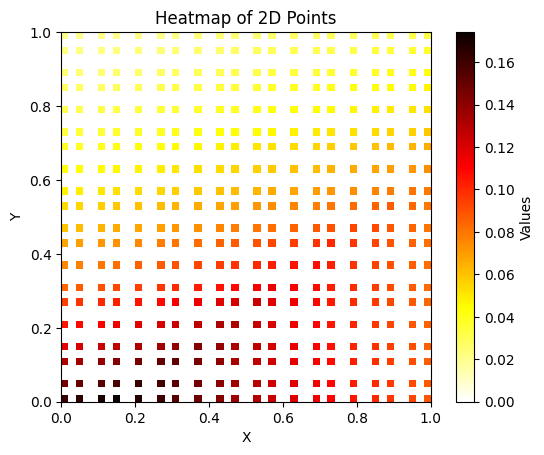

: 

In [ ]:
#WOOD

# Create a 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=50, weights=values)

# Plot the heatmap
plt.imshow(heatmap.T, extent=[0, 1, 0, 1], origin='lower', cmap='hot_r', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Heatmap of 2D Points')
plt.show()

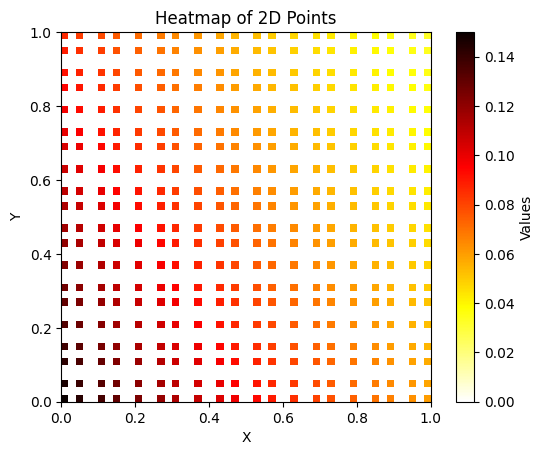

: 

In [ ]:
#GREEN
# Create a 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=50, weights=values)


# Plot the heatmap
plt.imshow(heatmap.T, extent=[0, 1, 0, 1], origin='lower', cmap='hot_r', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Heatmap of 2D Points')
plt.show()

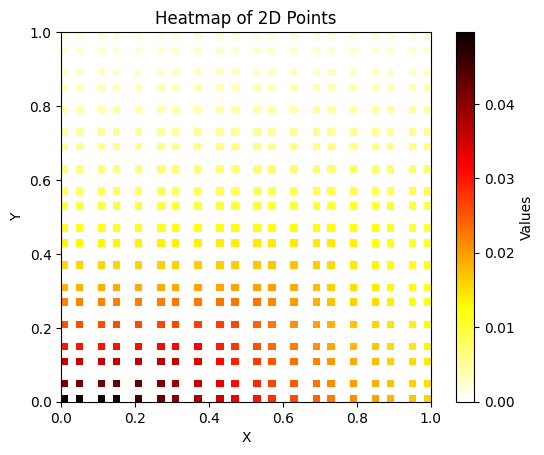

: 

In [ ]:
#BALSAMIC
# Create a 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=50, weights=values)


# Plot the heatmap
plt.imshow(heatmap.T, extent=[0, 1, 0, 1], origin='lower', cmap='hot_r', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Heatmap of 2D Points')
plt.show()

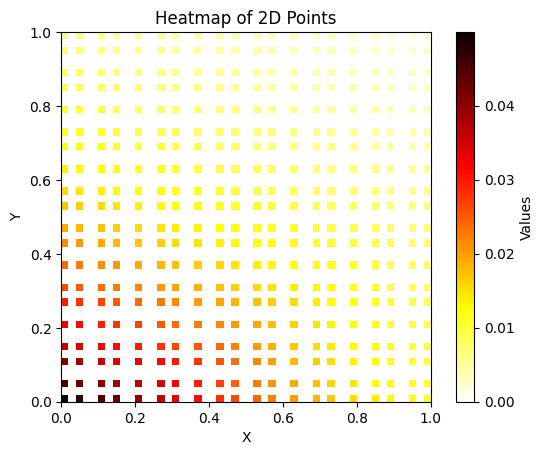

: 

In [ ]:
#BALSAMIC
# Create a 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=50, weights=values)


# Plot the heatmap
plt.imshow(heatmap.T, extent=[0, 1, 0, 1], origin='lower', cmap='hot_r', interpolation='nearest')
plt.colorbar(label='Values')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Heatmap of 2D Points')
plt.show()

### Group heatmaps

In [186]:
intensity_predictions = {}
for odourval in list(perfurmershub2labels_updated.keys()):
  x,y, values = generate_data_inverse(model=keras_model1, odour=odourval, num_points= 20)
  intensity_predictions[odourval] = {'x': x, 'y': y, 'values': values}

NameError: name 'generate_data_inverse' is not defined

In [ ]:
intensity_dataset = {}
for idx, row in intensity_regression_dataset.iterrows():
  row_dict = dict(row)
  x_val = row_dict['a']
  y_val = row_dict['b']
  for odour in list(perfurmershub2labels_updated.keys()):
    if row_dict[odour] != 0:
      intensity_val = row_dict[odour]
      if odour not in intensity_dataset:
        intensity_dataset[odour] = {'a':[x_val], 'b':[y_val],'values': [intensity_val]}
      else:
        intensity_dataset[odour]['a'].append(x_val)
        intensity_dataset[odour]['b'].append(y_val)
        intensity_dataset[odour]['values'].append(intensity_val)


: 

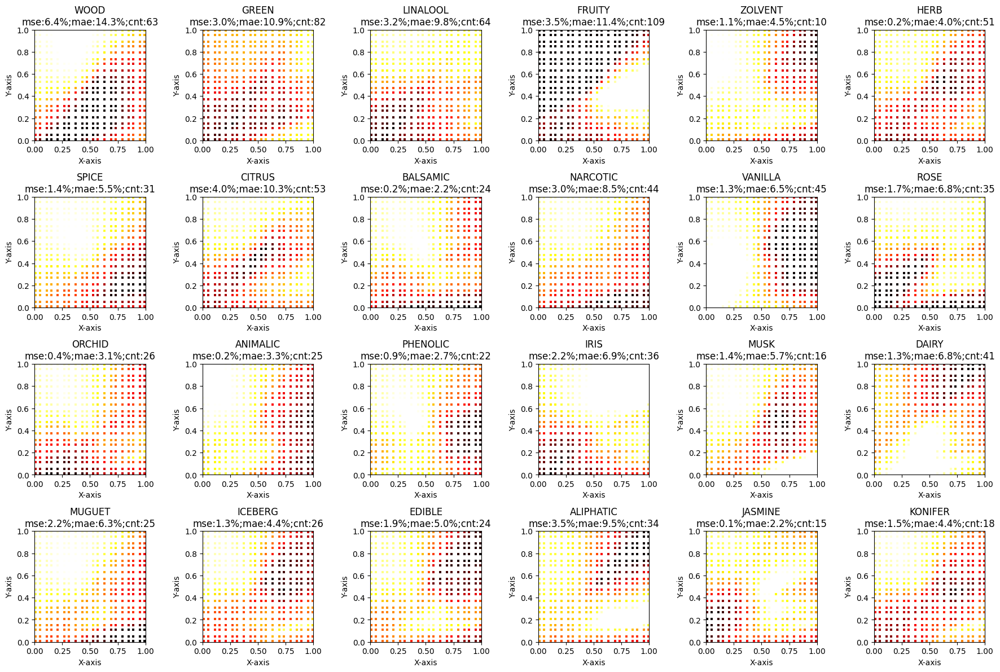

: 

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# # Generate some example data
# x = np.linspace(0, 2*np.pi, 100)
# y = np.sin(x)

# Create a figure and axis objects
fig, axs = plt.subplots(4, 6, figsize=(18, 12))

# Flatten the axs array to iterate over it easily
axs = axs.flatten()

odour_list = list(intensity_predictions.keys())

for i, ax in enumerate(axs):
    odour_val = odour_list[i]
    x = intensity_predictions[odour_val]['a']
    y = intensity_predictions[odour_val]['b']
    values = intensity_predictions[odour_val]['values']
    heatmap, xedges, yedges = np.histogram2d(x, y, bins=50, weights=values)


    # Plot the heatmap
    ax.imshow(heatmap.T, extent=[0, 1, 0, 1], origin='lower', cmap='hot_r', interpolation='nearest')
    # ax.plot(x, y)  # Plot the example data
    ax.set_title(str(odour_val).upper()+'\n'+ 'mse:'+str(round(sorted_by_mse[str(odour_val)]['mse']*100, 1))+'%;mae:'+str(round(sorted_by_mae[str(odour_val)]['mae']*100,1))+'%;cnt:'+str(odour_counts[str(odour_val)]))  # Set subplot title
    ax.set_xlabel('X-axis')  # Set label for X-axis
    ax.set_ylabel('Y-axis')  # Set label for Y-axis

plt.tight_layout()  # Adjust layout to prevent overlap
plt.savefig("intensity_heatmap_on_pca2d_kerasmodel3.png", format="png")
plt.show()

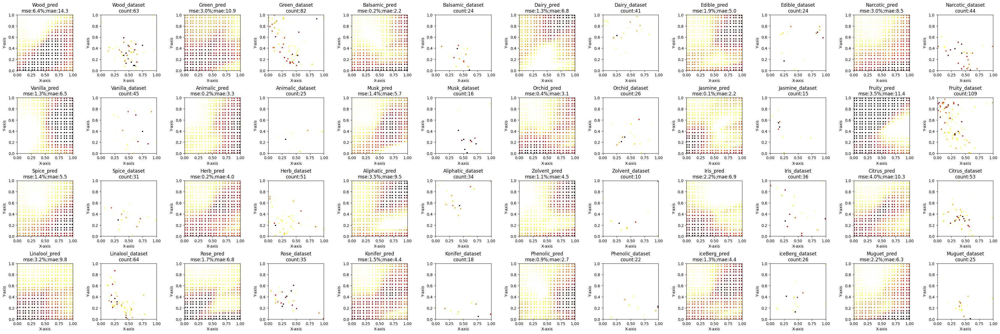

: 

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# # Generate some example data
# x = np.linspace(0, 2*np.pi, 100)
# y = np.sin(x)

# Create a figure and axis objects
fig, axs = plt.subplots(4, 12, figsize=(36, 12))

# Flatten the axs array to iterate over it easily
axs = axs.flatten()

odour_list = list(intensity_dataset.keys())

intensity_dataset_predictions = {}
for odour in odour_list:
  intensity_dataset_predictions[odour+'_pred'] = intensity_predictions[odour]
  intensity_dataset_predictions[odour+'_dataset'] = intensity_dataset[odour]

odour_list = list(intensity_dataset_predictions.keys())

for i, ax in enumerate(axs):
    odour_val = odour_list[i]
    x = intensity_dataset_predictions[odour_val]['x']
    y = intensity_dataset_predictions[odour_val]['y']
    values = intensity_dataset_predictions[odour_val]['values']
    heatmap, xedges, yedges = np.histogram2d(x, y, bins=50, weights=values)
    # Plot the heatmap
    ax.imshow(heatmap.T, extent=[0, 1, 0, 1], origin='lower', cmap='hot_r', interpolation='nearest')
    # ax.plot(x, y)  # Plot the example data
    if '_pred' in odour_val:
      original_odour = odour_val.split('_pred')[0]
      ax.set_title(str(odour_val)+'\n'+ 'mse:'+str(round(sorted_by_mse[str(original_odour)]['mse']*100, 1))+'%;mae:'+str(round(sorted_by_mae[str(original_odour)]['mae']*100,1)))  # Set subplot title
    else:
      original_odour = odour_val.split('_dataset')[0]
      ax.set_title(str(odour_val)+'\n'+ 'count:'+str(odour_counts[str(original_odour)]))
    ax.set_xlabel('X-axis')  # Set label for X-axis
    ax.set_ylabel('Y-axis')  # Set label for Y-axis


plt.tight_layout()  # Adjust layout to prevent overlap
plt.savefig("intensity_heatmap_on_pca2d_dataset_predictions3.png", format="png")
plt.show()

### Individual label test

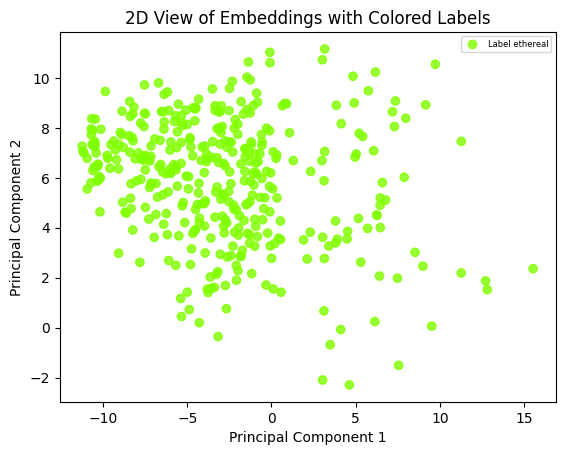

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=ethereal_smell)
for cval, val in c_index_map.items():
    indices = val['indices']
    # intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    intersection_indices = indices
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 1], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(fontsize = 6)
plt.show()

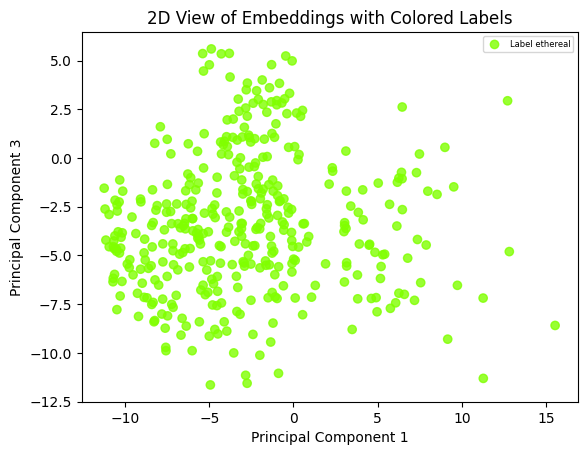

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=ethereal_smell)
for cval, val in c_index_map.items():
    indices = val['indices']
    # intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    intersection_indices = indices
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

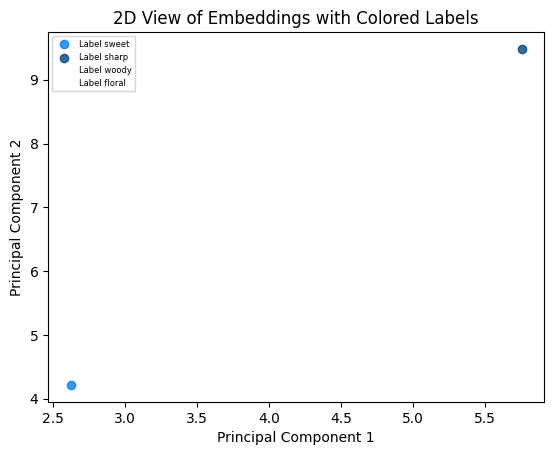

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=custom_odours_2)
for cval, val in c_index_map.items():
    indices = val['indices']
    intersection_indices = list(set(individual_indices).intersection(set(indices)))
    # intersection_indices = indices
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 1], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(fontsize = 6)
plt.show()

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=custom_odours_2)
for cval, val in c_index_map.items():
    indices = val['indices']
    intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    intersection_indices = indices
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

NameError: name 'indices_to_capture' is not defined

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=custom_odours_2)
for cval, val in c_index_map.items():
    indices = val['indices']
    # intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    intersection_indices = indices
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[intersection_indices, 1], pca_result[intersection_indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 2')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

: 

### Primary odours

In [282]:

# colors = plt.cm.viridis(np.linspace(0, 1, len(unique_labels)))
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=primary_odours)
for cval, val in c_index_map.items():
    indices = val['indices']
    exact_odor_list = val['exact_odors']
    # intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    intersection_indices = indices
    intersection_eodor = []
    for idc in intersection_indices:
      idx = indices.index(idc)
      intersection_eodor.extend(exact_odor_list[idx])


    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(clist)
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      # intersection_indices = indices
      print('BRACKET: ', label)
      label_coord_dict = {}
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 1] ,label=f'Label {label}', c=clist, cmap='viridis')
      for idx in range(len(pca_result[intersection_indices, 0])):
        odour_value = intersection_eodor[idx]
        # print('label: ', label, 'odour_value: ', odour_value)
        x_coord = pca_result[intersection_indices, 0][idx]
        y_coord = pca_result[intersection_indices, 1][idx]
        all_ls = odour_value.split(',')
        for al in all_ls:
          if al in label_coord_dict:
            label_coord_dict[al].append([x_coord, y_coord])
          else:
            label_coord_dict[al] = [[x_coord, y_coord]]
        # print(label_coord_dict)
      ranked_keys, key_centroids = rank_keys_by_cluster_distance(label_coord_dict)
      # print('ranked_keys: ', ranked_keys)
      print('key_centeroids: ', key_centroids)


#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)
      # for idx, i_label in enumerate(intersection_eodor):
      #   plt.text(pca_result[intersection_indices, 0][idx], pca_result[intersection_indices, 1][idx], i_label, ha='right', va='bottom')

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(fontsize = 5)

# ax.set_xlabel('Principal Component 1')
# ax.set_ylabel('Principal Component 2')
# ax.set_zlabel('Principal Component 3')
# ax.set_title('3D PCA of Embeddings')
plt.show()

NameError: name 'all_labels_alldata' is not defined

In [ ]:

# colors = plt.cm.viridis(np.linspace(0, 1, len(unique_labels)))
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=primary_odours)
for cval, val in c_index_map.items():
    indices = val['indices']
    exact_odor_list = val['exact_odors']
    intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    intersection_eodor = []
    for idc in intersection_indices:
      idx = indices.index(idc)
      intersection_eodor.extend(exact_odor_list[idx])

    # intersection_indices = indices
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(clist)
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      # intersection_indices = indices
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 1] ,label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)
      # for idx, i_label in enumerate(intersection_eodor):
      #   plt.text(pca_result[intersection_indices, 0][idx], pca_result[intersection_indices, 1][idx], i_label, ha='right', va='bottom')

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(fontsize = 5)

# ax.set_xlabel('Principal Component 1')
# ax.set_ylabel('Principal Component 2')
# ax.set_zlabel('Principal Component 3')
# ax.set_title('3D PCA of Embeddings')
plt.show()

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=primary_odours)
for cval, val in c_index_map.items():
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 1], pca_result[indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 2')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=primary_odours)
for cval, val in c_index_map.items():
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 0], pca_result[indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

: 

### Primary with remaining

In [ ]:
# colors = plt.cm.viridis(np.linspace(0, 1, len(unique_labels)))
primary_remaining = other_smells(primary_odours, targets=TASKS)
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=primary_remaining)
for cval, val in c_index_map.items():
    indices = val['indices']
    intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(clist)
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      # intersection_indices = indices
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 1] ,label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(fontsize = 5)

# ax.set_xlabel('Principal Component 1')
# ax.set_ylabel('Principal Component 2')
# ax.set_zlabel('Principal Component 3')
# ax.set_title('3D PCA of Embeddings')
plt.show()

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=primary_remaining)
for cval, val in c_index_map.items():
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 1], pca_result[indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 2')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=primary_odours)
for cval, val in c_index_map.items():
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 0], pca_result[indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

: 

### Crocker-Henderson

label:  OOS
label:  burnt
key_centeroids:  {'burnt': [5.325640469819307, -1.5902502728551626], 'caramellic': [5.4955666340563605, -1.3760791378824606], 'fatty': [2.662346363067627, -1.6055786609649658], 'fruity': [5.440185732882599, -1.930263667271055], 'sweet': [5.965423250042946, -2.1969741377386316], 'almond': [4.771839879453182, -2.4049826898456863], 'balsamic': [6.229331158778884, -2.1711041873151604], 'creamy': [7.099350261688232, -1.4197295680642128], 'phenolic': [5.925270630937359, -1.7792300411943094], 'powdery': [6.049459837377071, -2.4207738223759567], 'vanilla': [6.0742794434181775, -2.770872842692412], 'bitter': [4.519678920507431, -2.3990945696830748], 'cherry': [4.682729184627533, -2.97201300462087], 'coumarinic': [4.999274941591116, -2.940592646598816], 'hay': [5.478225431659005, -3.5975872061469336], 'medicinal': [6.411359282831351, -1.7427195694652342], 'nutty': [5.103630187019946, -1.9413214232772589], 'spicy': [5.827547131878574, -1.4506971471435655], 'woody': [5.77

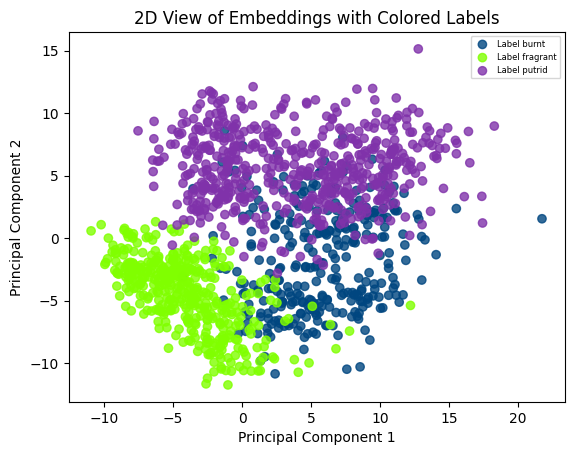

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=crocker_henderson)
for cval, val in c_index_map.items():
    # print(val)
    indices = val['indices']
    exact_odor_list = val['exact_odors']
    # intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    intersection_indices = indices
    intersection_eodor = []
    for idc in intersection_indices:
      idx = indices.index(idc)
      intersection_eodor.extend(exact_odor_list[idx])
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    print('label: ', label)
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 0], pca_result[indices, 1], label=f'Label {label}', c=clist, cmap='viridis')

      label_coord_dict = {}
      for idx in range(len(pca_result[intersection_indices, 0])):
        odour_value = intersection_eodor[idx]
        # print('label: ', label, 'odour_value: ', odour_value)
        x_coord = pca_result[intersection_indices, 0][idx]
        y_coord = pca_result[intersection_indices, 1][idx]
        all_ls = odour_value.split(',')
        for al in all_ls:
          if al in label_coord_dict:
            label_coord_dict[al].append([x_coord, y_coord])
          else:
            label_coord_dict[al] = [[x_coord, y_coord]]
        # print(label_coord_dict)
      ranked_keys, key_centroids = rank_keys_by_cluster_distance(label_coord_dict)
      # print('ranked_keys: ', ranked_keys)
      print('key_centeroids: ', key_centroids)
      centroid_clusters = cluster_centroids(key_centroids, thresh= .7)
      print('centroid_clusters: ', centroid_clusters)

#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(fontsize = 6)
plt.show()

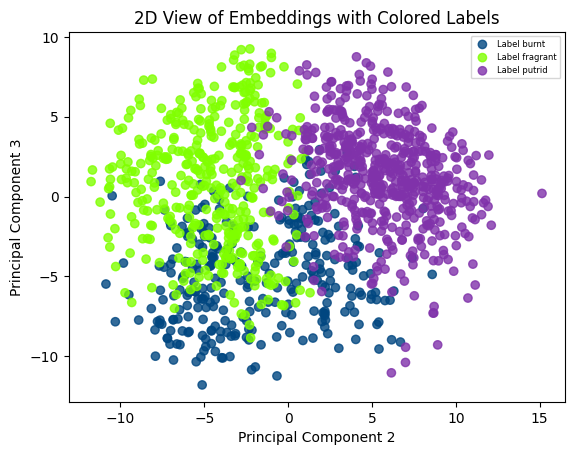

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=crocker_henderson)
for cval, val in c_index_map.items():
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 1], pca_result[indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 2')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

{'c_val': [255, 255, 255], 'indices': [0, 6, 8, 9, 10, 11, 16, 17, 18, 19, 20, 24, 27, 30, 31, 32, 33, 34, 35, 37, 38, 42, 44, 45, 46, 48, 49, 51, 52, 54, 56, 58, 61, 62, 63, 65, 67, 68, 70, 71, 72, 73, 75, 76, 77, 79, 82, 83, 84, 86, 87, 88, 89, 90, 91, 92, 94, 95, 97, 99, 100, 102, 108, 109, 111, 112, 113, 114, 115, 116, 119, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 138, 139, 142, 143, 144, 145, 148, 154, 155, 157, 158, 160, 161, 162, 164, 165, 166, 167, 168, 169, 172, 175, 178, 183, 184, 185, 186, 187, 188, 189, 190, 194, 197, 198, 201, 202, 203, 204, 205, 206, 207, 208, 211, 213, 217, 218, 221, 226, 229, 231, 232, 235, 236, 237, 242, 243, 245, 246, 247, 251, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 266, 267, 270, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 284, 286, 287, 288, 289, 291, 292, 293, 294, 295, 296, 297, 298, 300, 301, 303, 305, 306, 308, 309, 310, 311, 312, 313, 314, 315, 318, 324, 325, 326, 327, 328, 329, 330, 331, 332, 

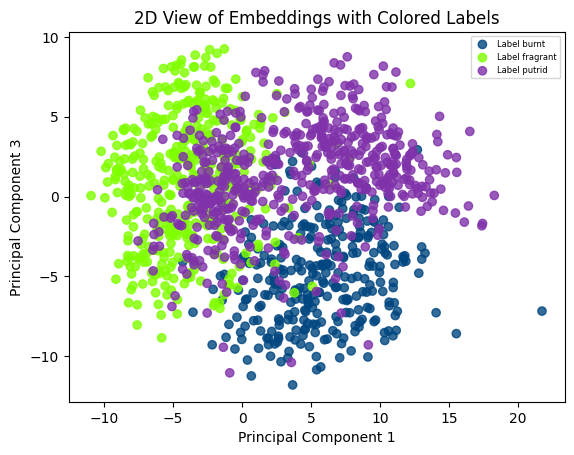

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=crocker_henderson)
for cval, val in c_index_map.items():
    print(val)
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 0], pca_result[indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

### Crocker with remaining

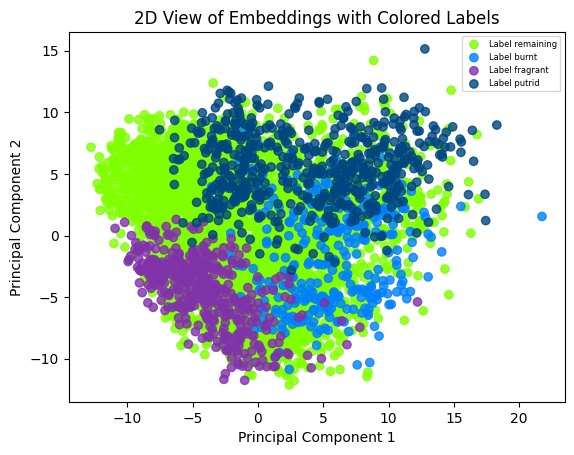

: 

In [ ]:
crocker_henderson_updated = other_smells(crocker_henderson, TASKS)
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=crocker_henderson_updated)
for cval, val in c_index_map.items():
    # print(val)
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      # for idx, ix in enumerate(pca_result[indices, 0]):
      #   for idy, iy in enumerate(pca_result[indices, 1]):
      #     #overlap
      #     if 2<ix<11 and 4<iy<7:
      #       print('overlap: ', all_labels_alldata[idx])
      #     elif -12.5<ix<-7.5 and 2<iy<10:
      #       print('unmapped corner: ', all_labels_alldata[idx])
      plt.scatter(pca_result[indices, 0], pca_result[indices, 1], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(fontsize = 6)
plt.show()

In [ ]:
#overlap between burnt, putrid
#y: 4,7
#x: 2,11

#remaining - left aside:
#x: -12.5, -7.5
#y: 2.5, 10



: 

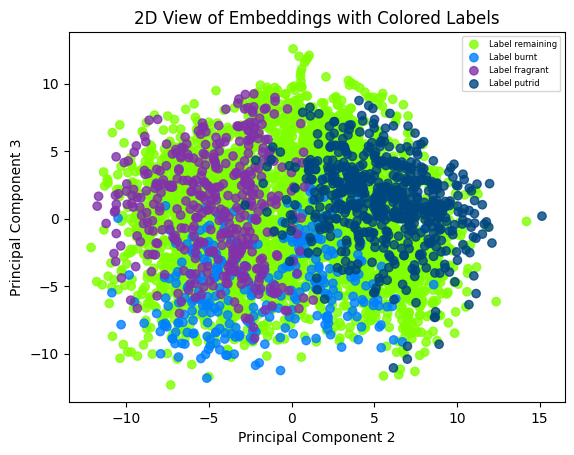

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=crocker_henderson_updated)
for cval, val in c_index_map.items():
    # print(val)
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 1], pca_result[indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 2')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

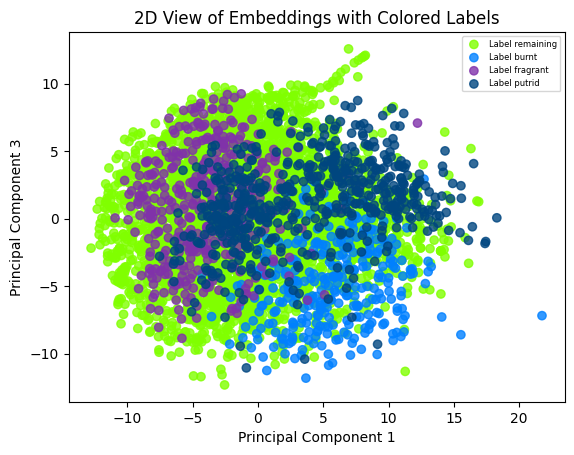

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=crocker_henderson_updated)
for cval, val in c_index_map.items():
    # print(val)
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 0], pca_result[indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

### Zwaardemaker

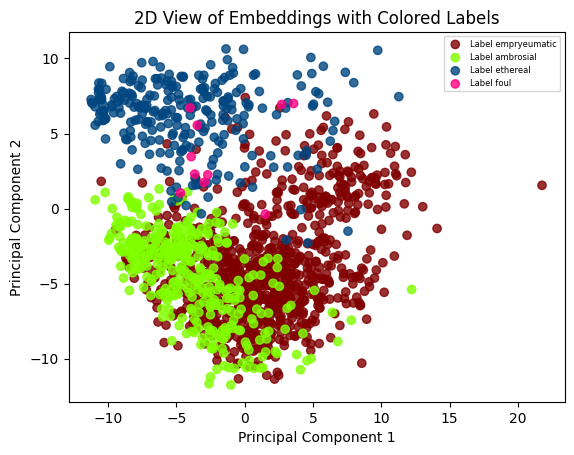

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=zwaardemaker)
for cval, val in c_index_map.items():
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 0], pca_result[indices, 1], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(fontsize = 6)
plt.show()

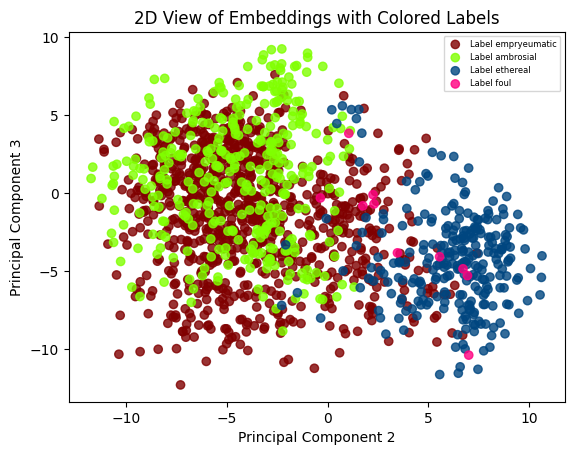

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=zwaardemaker)
for cval, val in c_index_map.items():
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 1], pca_result[indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 2')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

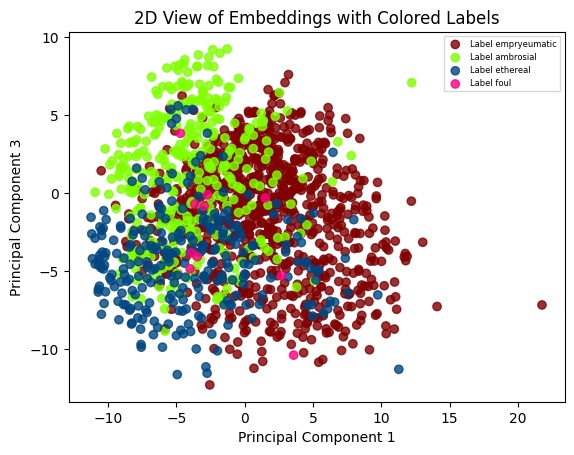

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=zwaardemaker)
for cval, val in c_index_map.items():
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 0], pca_result[indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

### Zwaardemaker with remaining

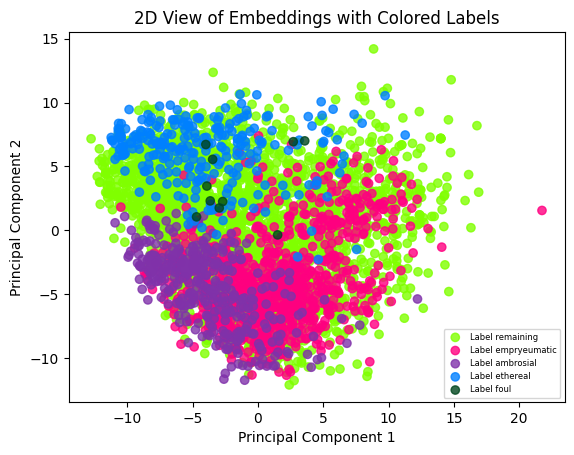

: 

In [ ]:
zwaardemaker_updated = other_smells(zwaardemaker, TASKS)

c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=zwaardemaker_updated)
for cval, val in c_index_map.items():
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 0], pca_result[indices, 1], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(fontsize = 6)
plt.show()

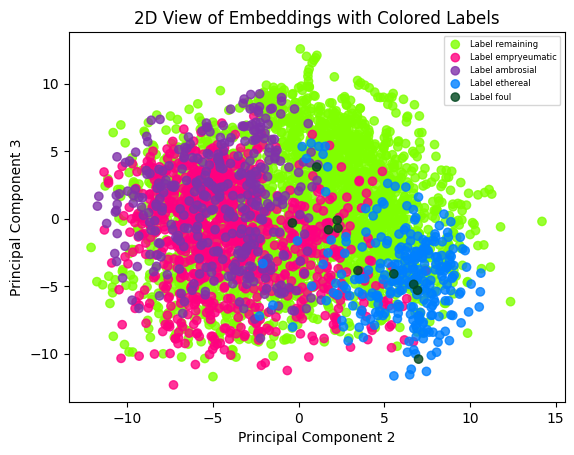

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=zwaardemaker_updated)
for cval, val in c_index_map.items():
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 1], pca_result[indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 2')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

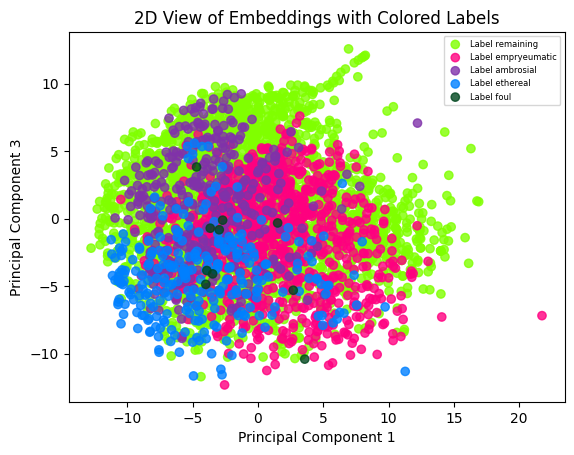

: 

In [ ]:
zwaardemaker_updated = other_smells(zwaardemaker, TASKS)

c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=zwaardemaker_updated)
for cval, val in c_index_map.items():
    indices = val['indices']
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[indices, 0], pca_result[indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

### Get centroids for all

In [ ]:
label_coord_dict = {}
for idx in range(len(pca_result[:, 0])):
  # print('label: ', label, 'odour_value: ', odour_value)
  x_coord = pca_result[:, 0][idx]
  y_coord = pca_result[:, 1][idx]
  all_ls = combined_alllabels[idx]
  for al in all_ls:
    if al in label_coord_dict:
      label_coord_dict[al].append([x_coord, y_coord])
    else:
      label_coord_dict[al] = [[x_coord, y_coord]]
print(label_coord_dict)
ranked_keys, key_centroids = rank_keys_by_cluster_distance(label_coord_dict)
# print('ranked_keys: ', ranked_keys)
print('key_centeroids: ', key_centroids)
centroid_clusters = cluster_centroids(key_centroids, thresh= .7)
print('centroid_clusters: ', centroid_clusters)

{'fishy': [[9.305183, 5.479861], [5.7565436, 9.482505], [8.429071, 0.06560346], [6.6799083, 5.1207285], [-1.4279706, 10.672531], [11.847062, -0.17112413], [8.126081, 10.464279], [8.178116, 10.15338], [5.9340177, 7.2679563], [5.07169, -1.7774737], [0.23618111, 3.1337538], [6.9417095, -2.7408674], [3.995459, -1.7792101], [5.185877, -2.454313], [8.427028, 2.3214877], [8.951595, -1.8254778], [7.18984, 7.7526608], [14.753404, 6.079871], [3.8976984, 5.446126], [5.829929, 5.0014286], [11.437449, 5.772996], [6.4257135, -5.3464327], [2.8644335, -2.990037], [5.177022, 5.439534], [10.392379, -0.07502915], [5.7363772, -0.9444607], [2.500737, -3.0576622], [5.702396, 1.7666187], [5.944953, 10.239374], [14.240248, 0.28747472], [8.857419, 14.2053385], [6.0488114, 2.569255], [4.685996, 8.604143], [7.523815, 5.394626], [3.0700724, 0.17309485], [6.0833645, -3.41859], [7.4108186, 3.5550237], [6.3395405, -6.156001], [5.1562896, -1.7663198], [9.17857, 0.51229465], [14.012486, 2.3440278], [16.137695, 4.35904

: 

In [ ]:
label_coord_dict_subset = {}
for k,v in label_coord_dict.items():
  odour_dict = all_odours_considered
  all_odour_list = []
  for k1,v1 in odour_dict.items():
    all_odour_list.extend(v1)
    all_odour_list.append(k1)
  all_odour_list.extend(['sweet', 'fruity'])
  if k in all_odour_list:
    label_coord_dict_subset[k] = v

ranked_keys, key_centroids = rank_keys_by_cluster_distance(label_coord_dict_subset)

print('ranked_keys: ', ranked_keys)
print('key_centroids: ', key_centroids)

: 

In [ ]:
import json
clustered_centroids = cluster_centroids(key_centroids, thresh=1.2)

: 

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Specify the number of clusters (you can adjust this based on your data)
n_clusters = 8

coordinates_list = []
labels = []
for k,v in key_centroids.items():
  coordinates_list.append(v)
  labels.append(k)

coordinates = np.array(coordinates_list)

data = np.column_stack((coordinates, labels))

# Extract only coordinates for clustering
X = coordinates

# Apply k-means clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(X)

# Get cluster labels and centroids
cluster_labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# Print cluster labels for each data point
clustered_labels = {}
ordered_labels = []
for i, label in enumerate(labels):
  if str(cluster_labels[i]) not in clustered_labels:
    clustered_labels[str(cluster_labels[i])] = [{'label': label, 'coord': coordinates_list[labels.index(label)]}]
  else:
    clustered_labels[str(cluster_labels[i])].append({'label': label, 'coord': coordinates_list[labels.index(label)]})
    ordered_labels.append(label)


print('clustered_labels: ', json.dumps(clustered_labels, indent=4))

: 

In [ ]:
# Plot the clusters
label_order = []
for val in cluster_labels:
  label_order.append(labels[val])

plt.scatter(X[:, 0], X[:, 1], c=cluster_labels, cmap='viridis', edgecolors='k')
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')

# Add labels to the clusters
for i, txt in enumerate(cluster_labels):
    plt.annotate(txt, (X[i, 0], X[i, 1]), textcoords="offset points", xytext=(0, 5), ha='center')

plt.title('K-Means Clustering')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.legend()
plt.show()


: 

### Plot for all smell brackets

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=all_odours_custom_clustered)
for cval, val in c_index_map.items():
    indices = val['indices']
    intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    # intersection_indices = indices
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 1], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(fontsize = 6)
plt.show()

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=all_odours_custom_clustered)
for cval, val in c_index_map.items():
    indices = val['indices']
    intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    # intersection_indices = indices
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

: 

In [ ]:
c_index_map = colour_indices_map(all_labels_alldata, flavour_bracket=all_odours_custom_clustered)
for cval, val in c_index_map.items():
    indices = val['indices']
    intersection_indices = list(set(indices_to_capture).intersection(set(indices)))
    # intersection_indices = indices
    # print('indices', indices)
    colour = val['c_val']
    rgba_colour = rgb_to_rgba_normalized(colour, alpha=0.8)
    clist = [rgba_colour for i in range(len(intersection_indices))]
    # print(colour)
    label = val['label']
    if label not in {'OOS', 'overlap'}:
      plt.scatter(pca_result[intersection_indices, 0], pca_result[intersection_indices, 2], label=f'Label {label}', c=clist, cmap='viridis')
#     plt.scatter(pca_result[0, 0], pca_result[0, 1], color=colors[i], marker='o', s=50)

plt.title('2D View of Embeddings with Colored Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(fontsize = 6)
plt.show()

: 

: 